In [2]:
import numpy as np
from astropy.io import fits
from astropy import table
import matplotlib.pyplot as plt
import scipy
import os
import pandas as pd
from scipy.interpolate import interp1d
import numpy as np
import math
import scipy.optimize as opt
from lmfit.models import StepModel, LinearModel


In [3]:
working_directory = os.getcwd()

In [4]:
# get lightcurves
def grab_files(folder):
    path = working_directory + folder
    files = [f for f in os.listdir(path)]
    files = [(working_directory+folder+"/"+x) for x in files]
    return files

def grab_files_HR(folder):
    path = working_directory + folder
    files = [f for f in os.listdir(path)]
    return files

In [5]:
# get lightcurves
lcs = grab_files("/GRS_lc_files")

# get respective HR
channel1 = grab_files_HR("/GRS_lc_hardness/channel1")
channel2 = grab_files_HR("/GRS_lc_hardness/channel2")
channel3 = grab_files_HR("/GRS_lc_hardness/channel3")
channel4 = grab_files_HR("/GRS_lc_hardness/channel4")

In [6]:
def f(x, a, b, c, d):
    return a / (1. + np.exp(-c * (x - d))) + b

In [7]:


# massive function to do some lc analysis, very messy
def RXTE_analysis(lcs,plot_yes,timing):
    #keeps track of all baselines for observations with eclipsess
    baselines = []
    # keeps track of all dip rates
    dip_rates = []
    # combines this info with name and start time
    all_info = []
    # keeps track of calculated ingress/egress with uncertainties
    ingress_times = []
    egress_times = []
    # keeps track of which obsids had bursts
    burst_obsids = []
    # keeps track of all times and lc names, for sorting
    times_and_names = []
    noises = []
    flagged_dips = []
    
    eclipse_obsids = []
    
    ingresses_data_centered = []
    egresses_data_centered = []

    ing_num = 0
    eg_num = 0
    
    eg_no = 0
    ing_no = 0 
    
    diff = 0
    invisible = []
    data_missing = 0
    both = 0
    snrs = []
    tot_time = 0
    for i in lcs:
        name = i
        print(name)
        new_file = fits.open(i)
        tab = table.Table(new_file[1].data) 
        time = tab["TIME"].tolist()
        rate = tab["RATE"].tolist()
        start_time = time[0]
        end_time = time[-1] + 75
        
        duration = time[-1]-time[0]
        tot_time += duration

        times_and_names.append((name,start_time))

        # convert starting and ending time to MJD
        start_time_MJD = 49353.00003909 + start_time*(1/86400)
        end_time_MJD = 49353.00003909 + end_time*(1/86400)

        print("MJD start",start_time_MJD)
        '''
        This is MJD $52066.259473(5) + 
        0.514980303(7)n$ for ingress and MJD $52066.289497(10) +
        0.514980303(7)n$ for egress 
        '''
        #determing n-values for start and end ingress
        start_n_ingress = ((start_time_MJD)-52066.259473)/0.514980303
        end_n_ingress = ((end_time_MJD)-52066.259473)/0.514980303

        #determing n-values for start and end ingress
        start_n_egress = ((start_time_MJD)-52066.289497)/0.514980303
        end_n_egress = ((end_time_MJD)-52066.289497)/0.514980303


        color = 'white'

        # check how different start and end times are from expected ingress/egress to see if we should expect an eclipse during that observation
        ingress_different = (math.floor(start_n_ingress) != math.floor(end_n_ingress))
        egress_different = (math.floor(start_n_egress) != math.floor(end_n_egress))

        cleaned_rate = [x for x in rate if str(x) != 'nan']
    
    
    ## dip checking:
        median = np.median(cleaned_rate)
        sd = np.std(cleaned_rate)
        dipping = False
        eclispe_data = []
        if ingress_different == False and egress_different == False:
            for i in range(0,len(cleaned_rate)):
                # check none of them are negative
                try:
                    if cleaned_rate[i] > 0 and cleaned_rate[i+1]>0 and cleaned_rate[i+2]> 0 and cleaned_rate[i+3] > 0:
                        if np.mean([cleaned_rate[i],cleaned_rate[i+1],cleaned_rate[i+2],cleaned_rate[i+3]]) < (median - 3*sd):
                            dipping = True 
                except:
                    pass
        if dipping == True:
            flagged_dips.append(name)

        color = 'white'
        
        if ingress_different or egress_different:
            eclipse_data = []
            diff +=1
            eclipse_obsids.append(name)


          ## plotting
            if plot_yes == True:
                color = 'gold'
                plt.rcParams["figure.figsize"] = (15,7)
                plt.figure(facecolor=color)
                plt.ylabel("RATE (Counts/s)")
                plt.xlabel("Time (s)")
                plt.scatter(time,rate)



            'Data Cleaning, Rolling Average, and Interpolation'
            # clean the rate list by removing nan values
            # then find the median of the rate list
            med = np.median(cleaned_rate)
            # these are all the times with rates that are not nan
            removed_times = []
            for i in range(0,len(rate)):
                if str(rate[i]) != 'nan': 
                    removed_times.append(time[i])
            
            time = removed_times
            # make a rolling average of the cleaned rate
            pd_cleaned_rate = pd.DataFrame(cleaned_rate)
            window_size = 5
            rolling_average = pd_cleaned_rate.rolling(window=window_size).mean()
            rolling_average = rolling_average.values.tolist()
            # remove first and last three bc they are nan
            rolling_average = rolling_average[window_size+1:]
            removed_times = removed_times[window_size+1:]
            # convert this pd to list (probably a better way to do this??)
            list_rolling_average = []
            for i in rolling_average:
                list_rolling_average.append(i[0])
            # let's interpolate this rolling average
            interp_func = interp1d(removed_times, list_rolling_average)
            interp_times = np.arange(removed_times[0],removed_times[-1],1)
            interp_times = interp_times.tolist()
            interp_average = interp_func(interp_times)
            interp_average = interp_average.tolist()

          # We define a function that will find the closest time associated with a particular rate
            def find_closest_time(rate,time,counts):
                calculated_time_in = 0
                copied_interp = counts.copy()
                tries = 0
                closest_in_rate = min(copied_interp, key=lambda x:abs(x-rate))
                rate_index_in = interp_average.index(closest_in_rate)
                calculated_time_in = interp_times[rate_index_in]

                return calculated_time_in

    #         'If there is an expected ingress'
            error = 53
            if ingress_different: 
                print("INGRESS EXPECTED")

            # calculate the expected ingress, with an error factor to make it more aligned. Possible that RXTE observations are not barycenter corrected?
                true_n_ingress = (52066.259473 + 0.514980311*math.floor(end_n_ingress)-49353)*86400 - 60.184
                true_n_ingress_MJD =  49353.00003909 + true_n_ingress*(1/86400)
                # grabs time closest to true_n_ingress time
                closest_in = min(time, key=lambda x:abs(x-true_n_ingress))
                index_in = time.index(closest_in)
                
                print("TIME_DIFF", closest_in -true_n_ingress)
                if (closest_in -true_n_ingress) > 50:
                    data_missing +=1

                # defines the previous part of the lightcurve as the baseline before this index_in, with a buffer to account for ingress itself
                # get mean and sd
                baseline_before = np.mean(cleaned_rate[0:(index_in-12)])
                baseline = baseline_before
                baseline_sd = np.std(cleaned_rate[0:(index_in-12)])


                # defines the following part of the lightcurve as the diprate, with a buffer to account for ingress
                # get mean and sd
                dip_rate = np.mean(cleaned_rate[index_in+12:])
                
                
                dip_sd = np.std(cleaned_rate[index_in+12:])
                
                
                # calculate 1ks before and after for calculations of observed- calculated
                
                
                bins_number = 30

                base_OC = cleaned_rate[(index_in-bins_number):(index_in-10)]

                baseline_OC = np.mean(base_OC)
                std_baseline_OC = np.std(base_OC)
                print('baseline:',baseline_OC)

                if len(base_OC) == 0:
                    base_OC = cleaned_rate[0:(index_in-10)]
                    baseline_OC = np.mean(base_OC)
                    std_baseline_OC = np.std(base_OC)
                    print('baseline_e:',baseline_OC)

                dip_OC = cleaned_rate[index_in+10:index_in+bins_number]
                dip_rate_OC = np.mean(dip_OC)            
                dip_sd_OC = np.std(dip_OC)
                print('dip_rate_OC:',dip_rate_OC)

                if len(dip_OC) == 0:
                    dip_OC = cleaned_rate[index_in+10:]
                    dip_rate_OC = np.mean(dip_OC)            
                    dip_sd_OC = np.std(dip_OC)
                    print('dip_rate_OC_e:',dip_rate_OC)


                # defines the following part of the lightcurve as the diprate, with a buffer to account for ingress
                # get mean and sd
                
                

                
                
                noise = np.sqrt(dip_sd**2+baseline_sd**2)

                rate_mid_err = np.sqrt(dip_sd_OC**2 + std_baseline_OC**2)/2

                # defines this as the midway of the ingress
                
                # find the point in time closest to this rate, using an interpolated smoothed lightcurve
                halfway_mean_in = (dip_rate_OC + baseline_OC)/2
                halfway_mean_in_sd_up = halfway_mean_in + rate_mid_err
                halfway_mean_in_sd_down = halfway_mean_in - rate_mid_err
                
                print('half means',halfway_mean_in,halfway_mean_in_sd_up,halfway_mean_in_sd_down)

                # get associated times with all these values
                # get index of interpolated data
                closest_in_interp = min(interp_times, key=lambda x:abs(x-true_n_ingress))
                interp_index = interp_times.index(closest_in_interp)
                print('interp time:',closest_in_interp,closest_in)
                
#                 time_mid = find_closest_time(halfway_mean_in,true_n_ingress,interp_average[interp_index-12:interp_index+12])
#                 time_mid_plus = find_closest_time(halfway_mean_in_sd_up,true_n_ingress,interp_average[interp_index-12:interp_index+12])
#                 time_mid_minus = find_closest_time(halfway_mean_in_sd_down,true_n_ingress,interp_average[interp_index-12:interp_index+12])

                
                

#                 coef = np.polyfit(x,y,1)
#                 poly1d_fn = np.poly1d(coef) 
# # poly1d_fn is now a function which takes in x and returns an estimate for y

#                 plt.plot(x,y, 'yo', x, poly1d_fn(x), '--k') #'--k'=black dashed line, 'yo' = yellow circle marker
                
                ydata = np.array(cleaned_rate[index_in-bins_number:index_in+bins_number])
                og_xdata = np.array(time[index_in-bins_number:index_in+bins_number])

                if len(og_xdata) == 2*bins_number: 
                    time_off = np.min(og_xdata)
                    xdata = og_xdata - time_off
                    print(xdata.tolist())
                    print(ydata.tolist())

                    # model data as Step + Line
                    step_mod = StepModel(form='linear', prefix='step_')
                    line_mod = LinearModel(prefix='line_')

                    model = step_mod + line_mod


                    print('center',xdata.mean())
                    # make named parameters, giving initial values:
                    pars = model.make_params(line_intercept=ydata.min(),
                                             line_slope=0,
                                             step_center=xdata.mean(),
                                             step_amplitude=ydata.std(),
                                             step_sigma=30)

                    # fit data to this model with these parameters
                    out = model.fit(ydata, pars, x=xdata)
                    xdata = xdata + time_off
                    plt.plot(og_xdata, out.best_fit, 'r-')
                    plt.scatter(og_xdata,ydata,color='orange')
                    
                    fitted_data = out.best_fit
                    
                    fitted_interp_func = interp1d(og_xdata, fitted_data)
                    fitted_interp_times = np.arange(og_xdata[0],og_xdata[-1],.1)
                    fitted_interp_times = fitted_interp_times.tolist()
                    fitted_interp_average = fitted_interp_func(fitted_interp_times)
                    fitted_interp_average = fitted_interp_average.tolist()
                    
                    closest_in_rate = min(fitted_interp_average, key=lambda x:abs(x-halfway_mean_in))
                    rate_index_in = fitted_interp_average.index(closest_in_rate)
                    time_mid = fitted_interp_times[rate_index_in]
                    
                    closest_in_rate = min(fitted_interp_average, key=lambda x:abs(x-halfway_mean_in_sd_up))
                    rate_index_in = fitted_interp_average.index(closest_in_rate)
                    time_mid_plus = fitted_interp_times[rate_index_in]

                    closest_in_rate = min(fitted_interp_average, key=lambda x:abs(x-halfway_mean_in_sd_down))
                    rate_index_in = fitted_interp_average.index(closest_in_rate)
                    time_mid_minus = fitted_interp_times[rate_index_in]

                    
                    print("FITTED MID",time_mid-true_n_ingress)
                    if (baseline-dip_rate)/noise >= 2 and abs((time_mid-true_n_ingress))<100:
                        ingress_times.append((true_n_ingress,(time_mid-true_n_ingress),(time_mid_plus-true_n_ingress),(time_mid_minus-true_n_ingress),rate_mid_err,true_n_ingress_MJD,end_n_ingress))
                        print((true_n_ingress,(time_mid-true_n_ingress),(time_mid_plus-true_n_ingress),(time_mid_minus-true_n_ingress),rate_mid_err))

                
                if plot_yes == True:
                # plot the time associated with this point as a line
                  print('interp',len(interp_times), len(interp_average))
                  # plot a line at ingress time
                  plt.axvline(x = true_n_ingress, color = 'green', label = 'axvline - full height')
                  plt.axvline(x = true_n_ingress-10, color = 'green', ls='--',label = 'axvline - full height')
                  plt.axvline(x = true_n_ingress+10, color = 'green', ls='--',label = 'axvline - full height')

                  plt.axvline(x = time_mid, color = 'black', label = 'axvline - full height')
                  plt.plot(interp_times, interp_average, color='green')

                  plt.axvline(x = time_mid_plus, color = 'orange', label = 'PLUS')
                  plt.axvline(x = time_mid_minus, color = 'blue', label = 'MINUS')
                    
                  plt.axhline(y = halfway_mean_in, color = 'black', label = 'axvline - full height')
                  plt.axhline(y = halfway_mean_in_sd_up, color = 'black', label = 'axvline - full height')
                  plt.axhline(y = halfway_mean_in_sd_down, color = 'black', label = 'axvline - full height')


                # if it is reasonably close to the expected time of ingress, assume no bugs occured and add it to the ingress list
                print("time diff ingress:",time_mid-true_n_ingress)
                if abs(time_mid-true_n_ingress) > 30:
                    print("BIG DIFERENCE")
#                 if len(interp_average[interp_index-12:interp_index+12]) == 24 and (baseline-dip_rate)/noise >= 1:
#                     ingress_times.append((true_n_ingress,(time_mid-true_n_ingress),(time_mid_plus-true_n_ingress),(time_mid_minus-true_n_ingress),rate_mid_err))
                print('midded')
                print("SnR",(baseline-dip_rate)/noise)
                    
                both = False
                if ingress_different and egress_different:
                    both = True
                
                print('clostin',index_in)
                num_ecl = 50
#                     if index_in > num_ecl:
                index_in = int(index_in)
                if (index_in-10+670) < len(time):
                    eclipse_data = cleaned_rate[(index_in-10):(index_in-10+670)]
                elif ((baseline-dip_rate)/noise)>5 and both==False :
                    rest = index_in
                    if rest > num_ecl:
                        eclipse_data = cleaned_rate[(index_in-num_ecl):]
                    else:
                        eclipse_data = cleaned_rate[0:]

                    ingresses_data_centered.append(eclipse_data)        
                        

                
                if ingress_different and egress_different:
                    pass
                else:
                    snrs.append((baseline-dip_rate)/noise)
                    if (baseline-dip_rate)/noise >= 1:
                        ing_num += 1
                    else:
                        ing_no += 1
                        invisible.append(name)


            if egress_different:
                print("EGRESS EXPECTED")

                
            # calculate the expected ingress, with an error factor to make it more aligned
                true_n_egress = (52066.289497 + 0.514980275*math.floor(end_n_egress)-49353)*86400 - 60.184
                true_n_egress_MJD =  49353.00003909 + true_n_egress*(1/86400)

                # grabs time closest to true_n_engress time
                closest_out = min(time, key=lambda x:abs(x-true_n_egress))
                index_out = time.index(closest_out)
                print("TIME_DIFF", closest_out -true_n_egress)
                if (closest_out -true_n_egress) > 50:
                    data_missing +=1
                    


                # calculates baseline rate
                bins_number = 30

                baseline_after = np.mean(cleaned_rate[index_out+12:])
                baseline = baseline_after
                baseline_sd = np.std(cleaned_rate[index_out+12:])

                #calculates dip rate
                dip_rate = np.mean(cleaned_rate[:index_out-12])
                dip_sd = np.std(cleaned_rate[:index_out-12])
                
                
                
                base_OC = cleaned_rate[(index_out-bins_number):(index_out-10)]
                baseline_OC = np.mean(base_OC)
                std_baseline_OC = np.std(base_OC)
                print('baseline:',baseline_OC)

                if len(base_OC) == 0:
                    base_OC = cleaned_rate[0:(index_out-10)]
                    baseline_OC = np.mean(base_OC)
                    std_baseline_OC = np.std(base_OC)
                    print('baseline_e:',baseline_OC)

                dip_OC = cleaned_rate[index_out+10:index_out+bins_number]
                dip_rate_OC = np.mean(dip_OC)            
                dip_sd_OC = np.std(dip_OC)
                print('dip_rate_OC:',dip_rate_OC)

                if len(dip_OC) == 0:
                    dip_OC = cleaned_rate[index_out+10:]
                    dip_rate_OC = np.mean(dip_OC)            
                    dip_sd_OC = np.std(dip_OC)
                    print('dip_rate_OC_e:',dip_rate_OC)


                rate_mid_err = np.sqrt(dip_sd_OC**2 + std_baseline_OC**2)/2
                noise = np.sqrt(dip_sd**2+baseline_sd**2)

                # now lets calculate the time at which the rate is halfway between eclipse and baseline
                
                halfway_mean_out = (dip_rate_OC + baseline_OC)/2
                halfway_mean_out_sd_up = halfway_mean_out + rate_mid_err
                halfway_mean_out_sd_down = halfway_mean_out - rate_mid_err
                
                print('half means',halfway_mean_out,halfway_mean_out_sd_up,halfway_mean_out_sd_down)

                closest_out_interp = min(interp_times, key=lambda x:abs(x-true_n_egress))
                interp_index = interp_times.index(closest_out_interp)

#                 time_mid = find_closest_time(halfway_mean_out,true_n_egress,interp_average[interp_index-12:interp_index+12])
#                 time_mid_plus = find_closest_time(halfway_mean_out_sd_up,true_n_egress,interp_average[interp_index-12:interp_index+12])
#                 time_mid_minus = find_closest_time(halfway_mean_out_sd_down,true_n_egress,interp_average[interp_index-12:interp_index+12])

                bins_number = 30
                ydata = np.array(cleaned_rate[index_out-bins_number:index_out+bins_number])
                og_xdata = np.array(time[index_out-bins_number:index_out+bins_number])
                                 
                if len(og_xdata) == 2*bins_number: 

                    time_off = np.min(og_xdata)
                    xdata = og_xdata - time_off
                    print(xdata.tolist())
                    print(ydata.tolist())

                    # model data as Step + Line
                    step_mod = StepModel(form='linear', prefix='step_')
                    line_mod = LinearModel(prefix='line_')

                    model = step_mod + line_mod


                    print('center',xdata.mean())
                    # make named parameters, giving initial values:
                    pars = model.make_params(line_intercept=ydata.min(),
                                             line_slope=0,
                                             step_center=xdata.mean(),
                                             step_amplitude=ydata.std(),
                                             step_sigma=30)

                    # fit data to this model with these parameters
                    out = model.fit(ydata, pars, x=xdata)
                    xdata = xdata + time_off
                    plt.plot(og_xdata, out.best_fit, 'r-')
                    plt.scatter(og_xdata,ydata,color='orange')

                    fitted_data = out.best_fit
                    
                    fitted_interp_func = interp1d(og_xdata, fitted_data)
                    fitted_interp_times = np.arange(og_xdata[0],og_xdata[-1],.1)
                    fitted_interp_times = fitted_interp_times.tolist()
                    fitted_interp_average = fitted_interp_func(fitted_interp_times)
                    fitted_interp_average = fitted_interp_average.tolist()
                    
                    
                    closest_in_rate = min(fitted_interp_average, key=lambda x:abs(x-halfway_mean_out))
                    rate_index_in = fitted_interp_average.index(closest_in_rate)
                    time_mid = fitted_interp_times[rate_index_in]
                    
                    closest_in_rate = min(fitted_interp_average, key=lambda x:abs(x-halfway_mean_out_sd_up))
                    rate_index_in = fitted_interp_average.index(closest_in_rate)
                    time_mid_plus = fitted_interp_times[rate_index_in]

                    closest_in_rate = min(fitted_interp_average, key=lambda x:abs(x-halfway_mean_out_sd_down))
                    rate_index_in = fitted_interp_average.index(closest_in_rate)
                    time_mid_minus = fitted_interp_times[rate_index_in]

                    
                    print("FITTED MID",time_mid-true_n_egress)
                    if (baseline-dip_rate)/noise >= 2 and abs((time_mid-true_n_egress))<100:
                        egress_times.append((true_n_egress,(time_mid-true_n_egress),(time_mid_plus-true_n_egress),(time_mid_minus-true_n_egress),rate_mid_err,true_n_egress_MJD,end_n_egress))
                        print((true_n_egress,(time_mid-true_n_egress),(time_mid_plus-true_n_egress),(time_mid_minus-true_n_egress),rate_mid_err,true_n_egress_MJD))
                    plt.plot(fitted_interp_times, fitted_interp_average, color='purple')


                
                

                if plot_yes == True:
                  # plot lines
                  plt.axvline(x = true_n_egress, color = 'red', label = 'axvline - full height')
                  plt.axvline(x = true_n_egress-10, color = 'red', ls='--',label = 'axvline - full height')
                  plt.axvline(x = true_n_egress+10, color = 'red', ls='--',label = 'axvline - full height')

                  plt.axvline(x = time_mid, color = 'black', label = 'axvline - full height')
                  plt.plot(interp_times, interp_average, color='green')
                  plt.axvline(x = time_mid_plus, color = 'orange', label = 'PLUS')
                  plt.axvline(x = time_mid_minus, color = 'blue', label = 'MINUS')
                    
                    
                  plt.axhline(y = halfway_mean_out, color = 'black', label = 'axvline - full height')
                  plt.axhline(y = halfway_mean_out_sd_up, color = 'black', label = 'axvline - full height')
                  plt.axhline(y = halfway_mean_out_sd_down, color = 'black', label = 'axvline - full height')

                print("time diff egress:",time_mid-true_n_egress)
                
                if abs(time_mid-true_n_egress) > 30:
                    print("BIG DIFERENCE")
#                 if len(interp_average[interp_index-12:interp_index+12]) == 24 and (baseline-dip_rate)/noise >= 1:
#                     egress_times.append((true_n_egress,(time_mid-true_n_egress),(time_mid_plus-true_n_egress),(time_mid_minus-true_n_egress),rate_mid_err))
                print('midded')
                print("SnR",(baseline-dip_rate)/noise)
                if ingress_different and egress_different:
                    both = True

                num_ecl = 50
                print('clostout',index_out)
                index_out = int(index_out)
                if (index_out-num_ecl-670) >= 0:
                    eclipse_data = cleaned_rate[(index_out+10-670):(index_out+10)]
                elif ((baseline-dip_rate)/noise)>5 and both == False:
                    rest = (len(time)-index_out)
                    if rest > num_ecl:
                        eclipse_data = cleaned_rate[:(index_out+num_ecl)]
                    else:
                        eclipse_data = cleaned_rate[:(index_out+rest-1)]
                    egresses_data_centered.append(eclipse_data)        

                if ingress_different and egress_different:
                    pass
                else:
                    snrs.append((baseline-dip_rate)/noise)
                    if (baseline-dip_rate)/noise >= 1:
                        eg_num += 1
                    else:
                        eg_no += 1
                        if name not in invisible:
                            invisible.append(name)


                #print statements

            if ingress_different and egress_different:
                # we have a new baselin and dip rate if there is a full eclipse
                baseline = np.mean(cleaned_rate[:(index_in-12)] + cleaned_rate[(index_out+12):])
                total_baseline = np.concatenate((cleaned_rate[:index_in-12],cleaned_rate[index_out+12:]))
                both +=1
                baseline_sd = np.std(total_baseline)
                dip_rate = np.mean(cleaned_rate[index_in+12:index_out-12])
                print('dip_rate,',dip_rate)
                dip_sd = np.std(cleaned_rate[index_in+12:index_out-12])
                noise = np.sqrt(dip_sd**2+baseline_sd**2)
                print("SnR",(baseline-dip_rate)/noise)
                snrs.append((baseline-dip_rate)/noise)

                if (baseline-dip_rate)/noise >= 1:
                    eg_num += 1
                    ing_num +=1
                else:
                    print('added')
                    eg_no += 1
                    ing_no +=1 
                    if name not in invisible:
                        invisible.append(name)



#             all_eclipses_ /data_centered.append(eclipse_data)
            noises.append(noise)

          #if max rate is bigger than 2x basline, we will say we have a burst
            print("max",max(cleaned_rate))
            print('baseline',baseline)
            if max(cleaned_rate) > (3*baseline):
                burst_obsids.append(name)

            baselines.append(baseline)
            dip_rates.append(dip_rate)
            
            

            lc_info = (baseline, dip_rate, name, time[0], noise)
            all_info.append(lc_info)
            print('tottime:',tot_time)

            # plotting
            if plot_yes == True:
            # actual plot
                plt.plot(removed_times,rolling_average,color='red')
                plt.plot(interp_times,interp_average,color='green')
                plt.title(f'{name} -- (Time: {start_time})')
                # plt.ylim(0,100)
                plt.show()

        else:
            if plot_yes == True:
                plt.rcParams["figure.figsize"] = (10,7)
                plt.figure(facecolor=color)
                plt.step(time,rate)
                # print(rate)
                # print(med)
                # plt.ylim(0,100)
                plt.title(f'{name} -- (Time: {start_time})')
                plt.show()
        print("max",max(cleaned_rate))
        print('baseline',np.mean(cleaned_rate))
        if max(cleaned_rate) > (4*np.mean(cleaned_rate)):
            burst_obsids.append(name)
    print('# clear ingress and egress',ing_num,eg_num)
    print('# invisible ingress/egress',ing_no,eg_no)
    print('# observations with either ingr/egre',diff)
    print('# observations with both',both)
    print('# data Missing',data_missing)
    print(burst_obsids)
#     print('invisible,', invisible)
    if timing == True:
        return (ingress_times, egress_times, all_info, times_and_names,flagged_dips, invisible, snrs,eclipse_obsids,ingresses_data_centered,egresses_data_centered)


/Users/caleb/Downloads/GRS_lc_files/60038-01-07-05.lc
MJD start 52209.052303940676
max 93.53106689453125
baseline 77.22392513430752
/Users/caleb/Downloads/GRS_lc_files/50034-01-02-06.lc
MJD start 51600.74197389467
EGRESS EXPECTED
TIME_DIFF -1.7892763912677765
baseline: 7.841712570190429
dip_rate_OC: 60.38458442687988
half means 34.11314849853515 37.531856855288666 30.694440141781637
[0.0, 4.000325381755829, 8.000650525093079, 12.000975549221039, 16.001300275325775, 20.001624822616577, 24.001949161291122, 28.00227329134941, 32.002597242593765, 36.00292098522186, 40.00324448943138, 44.00356784462929, 48.003890961408615, 52.00421389937401, 56.004536628723145, 60.004859149456024, 64.00518149137497, 68.00550362467766, 72.00582560896873, 76.00614732503891, 80.00646886229515, 84.00679025053978, 88.00711140036583, 92.00743243098259, 96.0077532529831, 100.00807383656502, 104.00839424133301, 108.00871443748474, 112.00903454422951, 116.00935438275337, 120.00967410206795, 124.00999358296394, 128.0

FITTED MID -0.22064033150672913
time diff egress: -0.22064033150672913
midded
SnR -0.005157811736614552
clostout 2529
dip_rate, 7.2882361953908745
SnR 8.69894278062052
max 116.19774627685547
baseline 81.2715111233224
tottime: 33507.63747391105
max 116.19774627685547
baseline 79.72332401888752
/Users/caleb/Downloads/GRS_lc_files/91045-02-01-10.lc
MJD start 53494.29321751338
INGRESS EXPECTED
TIME_DIFF 1.6131879091262817
baseline: 57.5357177734375
dip_rate_OC: 8.134639358520507
half means 32.835178565979 35.31054131408221 30.359815817875788
interp time: 357808248.6180051 357808250.6640069
[0.0, 4.000369846820831, 8.000739634037018, 12.001109302043915, 16.001478910446167, 20.001848340034485, 24.002217650413513, 28.002586901187897, 32.002955973148346, 36.00332498550415, 40.00369381904602, 44.004062592983246, 48.00443118810654, 52.00479966402054, 56.00516813993454, 60.00553643703461, 64.00590455532074, 68.00627255439758, 72.00664037466049, 76.00700813531876, 80.00737571716309, 84.00774312019

/opt/homebrew/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/homebrew/lib/python3.11/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/opt/homebrew/lib/python3.11/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/homebrew/lib/python3.11/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/opt/homebrew/lib/python3.11/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


MJD start 54883.19628024288
INGRESS EXPECTED
TIME_DIFF -1.8352095484733582
baseline: 85.69393119812011
dip_rate_OC: 9.83391613960266
half means 47.76392366886139 50.91905926573042 44.60878807199236
interp time: 477809373.237617 477809371.26907814
[0.0, 4.000315964221954, 8.00063169002533, 12.000947177410126, 16.001262426376343, 20.00157743692398, 24.001892268657684, 28.00220686197281, 32.00252115726471, 36.00283533334732, 40.00314921140671, 44.003462851047516, 48.003776252269745, 52.00408947467804, 56.004402458667755, 60.00471514463425, 64.0050276517868, 68.00533992052078, 72.00565201044083, 76.00596392154694, 80.00627547502518, 84.00658690929413, 88.0068981051445, 92.0072090625763, 96.00751978158951, 100.00783032178879, 104.00814062356949, 108.0084508061409, 112.00876063108444, 116.00907039642334, 120.00937980413437, 124.00968909263611, 128.00999814271927, 132.01030695438385, 136.01061564683914, 140.01092398166656, 144.0112321972847, 148.01154017448425, 152.01184809207916, 156.0121556

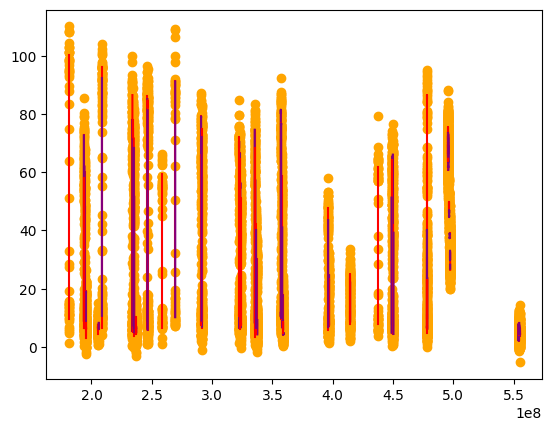

In [8]:
ingress_times, egress_times, all_info, times_and_names,flagged_dips,gone, snrs,eclipse_obsids,ingresses_data_centered,egresses_data_centered = RXTE_analysis(lcs,False,True)


108 108
414 414
187 187
155 155
121 121
220 220
128 128
72 72
258 258
136 136
177 177
183 183
168 168
659 659
131 131
117 117
224 224
109 109
193 193
145 145
648 648
209 209
180 180
152 152
467 467
151 151
158 158
136 136
146 146
160 160
512 512
147 147
294 294


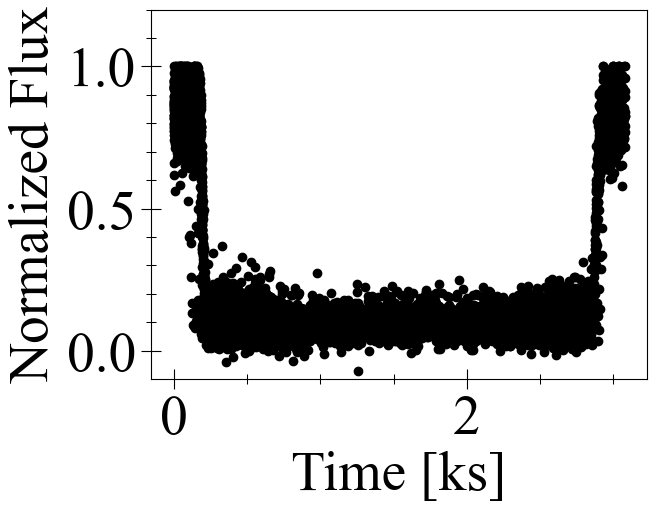

In [9]:

# x = np.arange(0,690,1)
size= 40
num_ecl = 50
for data in ingresses_data_centered[2:]:
    data = data/np.max(data)
    eclipse_data_len = len(data)
    extra=[20] * (670+2*num_ecl-eclipse_data_len)
    x_white = np.arange(len(data)*4,(len(data)+len(extra))*4,4)
    x_white = x_white/1000

    plt.scatter(x_white,extra,color='white',alpha=0)
    x = np.arange(0,len(data)*4,4)
    x = x/1000

    print(len(x),len(data))

    plt.scatter(x,data,color='black')

# plt.show()

for data in egresses_data_centered[2:]:
    data = data/np.max(data)

    eclipse_data_len = len(data)
    extra=[20] * (670+2*num_ecl-eclipse_data_len)
    x_white = np.arange(0,len(extra)*4,4)

    x_white = x_white/1000

    plt.scatter(x_white,extra,color='white',alpha=0)

    x = np.arange(len(extra)*4,(len(extra)+len(data))*4,4)
    x = x/1000

    print(len(x),len(data))

    plt.scatter(x,data,color='black')
    
plt.ylim(-.1,1.2)
plt.xlabel('Time [ks]',fontsize=size)
plt.ylabel('Normalized Flux',fontsize=size)
plt.rcParams.update({
            'font.sans-serif': 'Times New Roman',
            'font.family': 'serif'
            })
plt.tick_params(axis='both',which='major', labelsize=size)

# plt.rcParams.update({'font.size': 30,
#                      'xtick.labelsize' :30 ,
#                      'ytick.labelsize' : 30,
#                      'figure.figsize' : (15,12),
#                      'font.sans-serif': 'Times New Roman',
#                      'font.family': 'serif'

# })
plt.rcParams["figure.figsize"] = (15,12)
plt.tick_params(axis='both', which='both', labelsize=size,direction='inout',length=15)

plt.tick_params(which='minor', width=0.75, length=7)
plt.minorticks_on()

plt.savefig("rxte_all_eclipses")

plt.show()

In [49]:
all_eclipses_data_centered[1]

[77.3733139038086,
 81.1233139038086,
 92.6356201171875,
 89.92252349853516,
 85.42252349853516,
 91.42252349853516,
 82.95626068115234,
 89.05746459960938,
 85.80746459960938,
 89.55746459960938,
 78.79527282714844,
 85.00869750976562,
 91.75869750976562,
 85.50869750976562,
 84.36897277832031,
 84.69979095458984,
 86.19979095458984,
 82.44979095458984,
 77.9437255859375,
 87.67552185058594,
 83.67552185058594,
 80.17552185058594,
 78.31182098388672,
 84.97071075439453,
 85.22071075439453,
 83.22071075439453,
 84.61360931396484,
 98.54231262207031,
 79.79231262207031,
 77.04231262207031,
 83.93779754638672,
 82.87423706054688,
 92.12423706054688,
 94.62423706054688,
 86.2212142944336,
 86.26214599609375,
 76.26214599609375,
 82.26214599609375,
 84.23570251464844,
 85.1563491821289,
 82.9063491821289,
 96.4063491821289,
 82.07221221923828,
 74.5698013305664,
 79.0698013305664,
 66.8198013305664,
 90.95762634277344,
 68.37110900878906,
 85.37110900878906,
 78.62110900878906,
 76.5981979

In [26]:
len(eclipse_obsids)

111

/Users/caleb/Downloads/GRS_lc_files/94041-01-04-01.lc
TIME_DIFF -94.33445036411285
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 14459 14459
time diff ingress: 5408.5035155415535
SnR 0.1109910831314487
TIME_DIFF 1.7223169207572937
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: -10188.190730810165
SnR -0.09838371717787209
dip_rate, 27.511745373408
SnR 0.21813406273347513
added
max 42.83940887451172
baseline 28.61208418313559


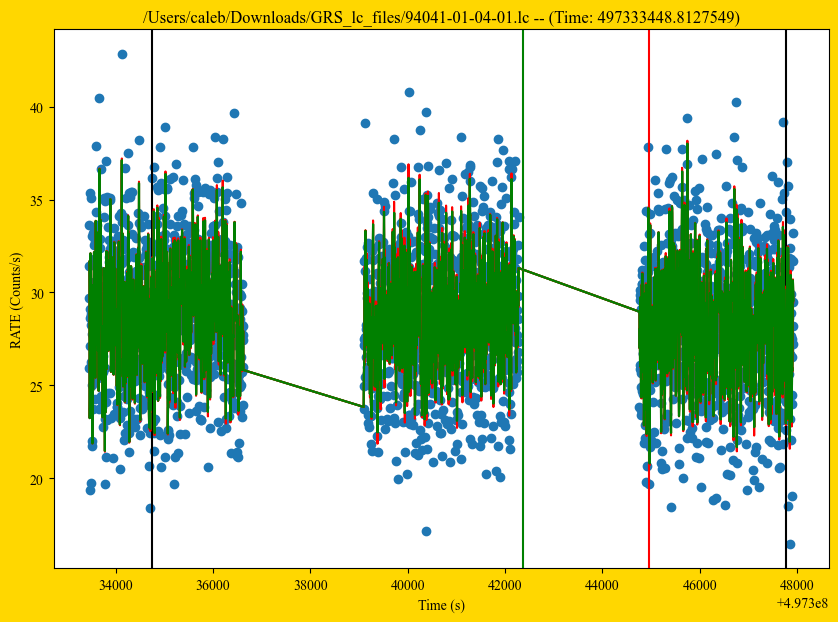

max 42.83940887451172
baseline 28.58463720310445
/Users/caleb/Downloads/GRS_lc_files/96052-02-01-02.lc
TIME_DIFF -1.9857832193374634
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 996 996
time diff ingress: -315.9335901737213
SnR 0.07344834121517385
max 11.340143203735352
baseline 4.096798250549718


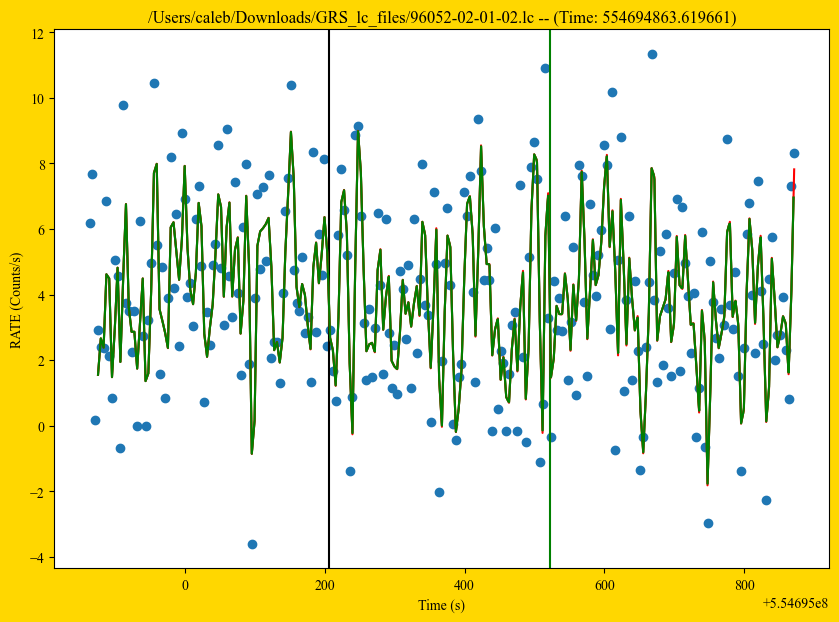

max 11.340143203735352
baseline 3.9930830378777427
/Users/caleb/Downloads/GRS_lc_files/94041-01-02-10.lc
TIME_DIFF -0.362315833568573
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 9596 9596
time diff ingress: -330.51643282175064
SnR -0.10139935910289252
max 60.65434646606445
baseline 48.148977264404294


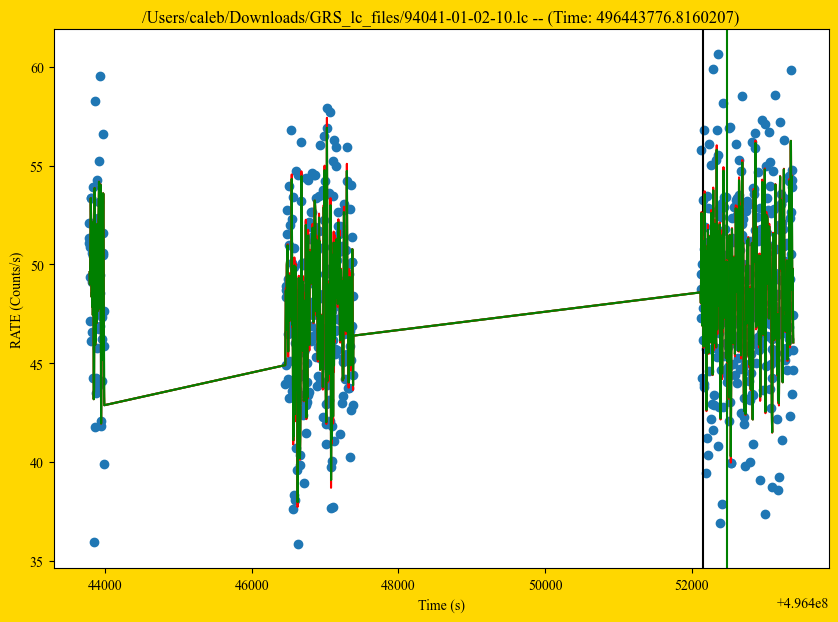

max 60.65434646606445
baseline 48.326453619445395
/Users/caleb/Downloads/GRS_lc_files/91045-02-01-20.lc
TIME_DIFF -0.38898372650146484
1
2
3
1
2
3
4
5
1
2
3
4
5
interp 3265 3265
time diff ingress: -18.42831712961197
midded
SnR 0.6947657412779942
TIME_DIFF -1.6456289291381836
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: -2633.833232343197
SnR 0.6414728003018525
dip_rate, 10.779406013979406
SnR 0.7300246023267287
added
max 74.97322845458984
baseline 18.317443923950194


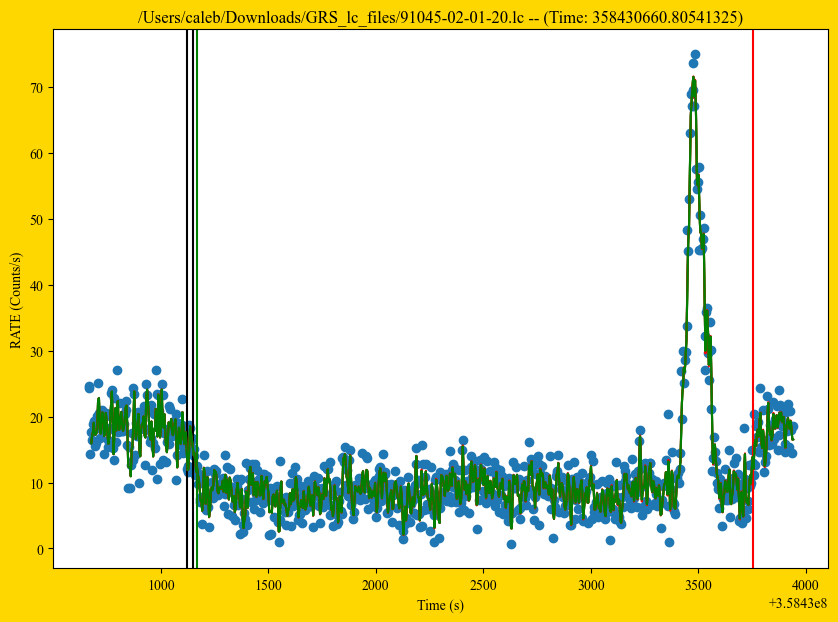

max 74.97322845458984
baseline 12.268420075207223
/Users/caleb/Downloads/GRS_lc_files/91045-02-01-30.lc
TIME_DIFF 0.4151230454444885
1
2
3
1
2
3
4
5
1
2
3
4
5
time diff egress: -13.599187195301056
SnR -0.008570721398132404
max 12.482213973999023
baseline 5.099174383412237


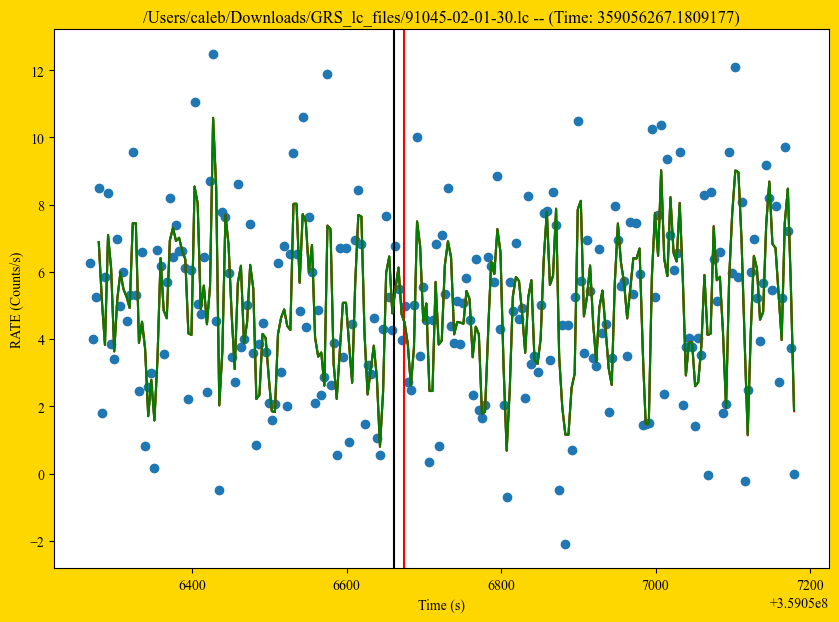

max 12.482213973999023
baseline 5.021104087996171
/Users/caleb/Downloads/GRS_lc_files/94041-01-02-00.lc
TIME_DIFF -0.8552812337875366
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: 8789.206147968769
SnR -0.08995574441868272
max 82.58758544921875
baseline 62.28969256190603


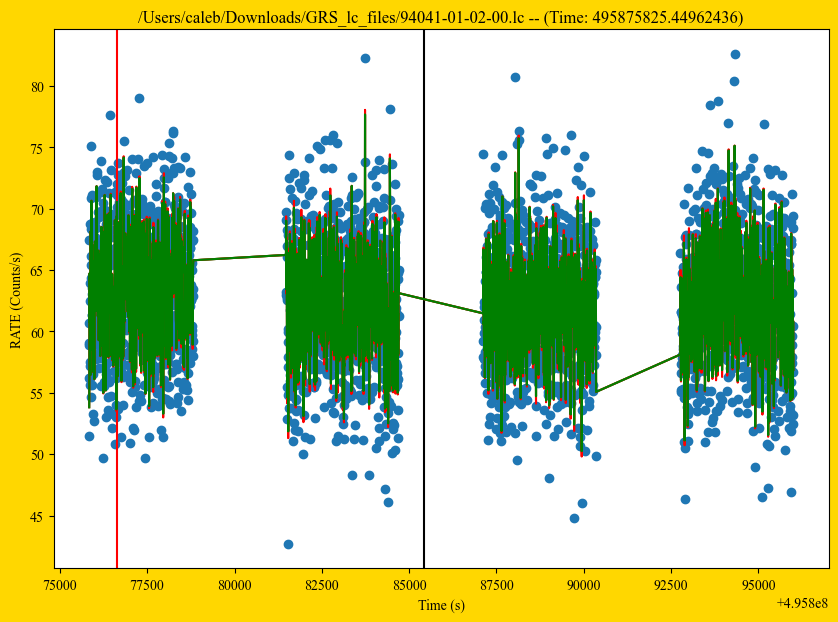

max 82.58758544921875
baseline 62.330592344508275
/Users/caleb/Downloads/GRS_lc_files/96052-02-01-03.lc
TIME_DIFF 1.5449843406677246
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 3196 3196
time diff ingress: 769.5600688457489
SnR -0.03178031522438832
TIME_DIFF 1.7044206857681274
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: -2161.112429857254
SnR -0.2920935152744223
dip_rate, 5.168069118444292
SnR -0.15603345089768328
added
max 14.467737197875977
baseline 4.546824111078019


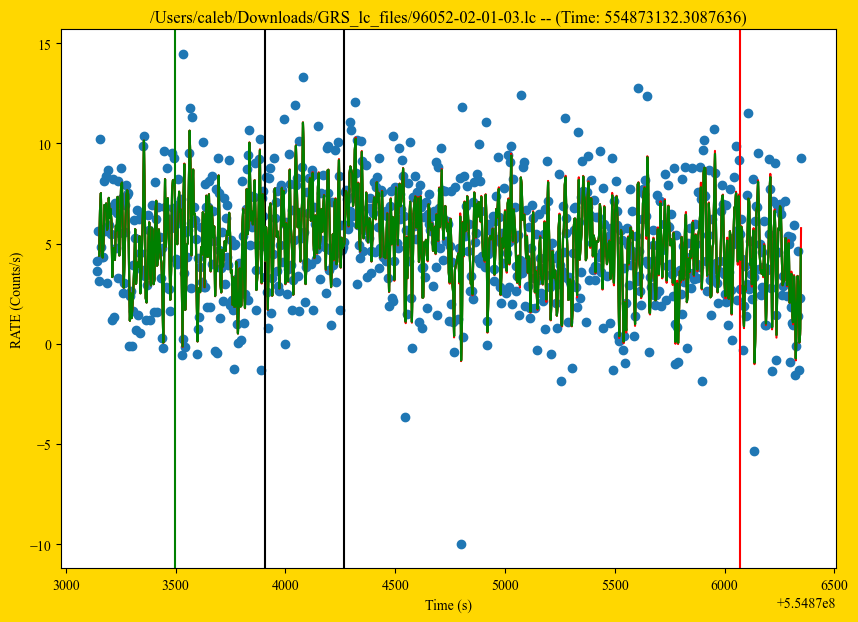

max 14.467737197875977
baseline 5.056134456396103
/Users/caleb/Downloads/GRS_lc_files/91045-02-01-31.lc
TIME_DIFF 0.46665138006210327
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: -206.5534805059433
SnR 0.45523052232971334
max 15.13519287109375
baseline 8.19502398627145


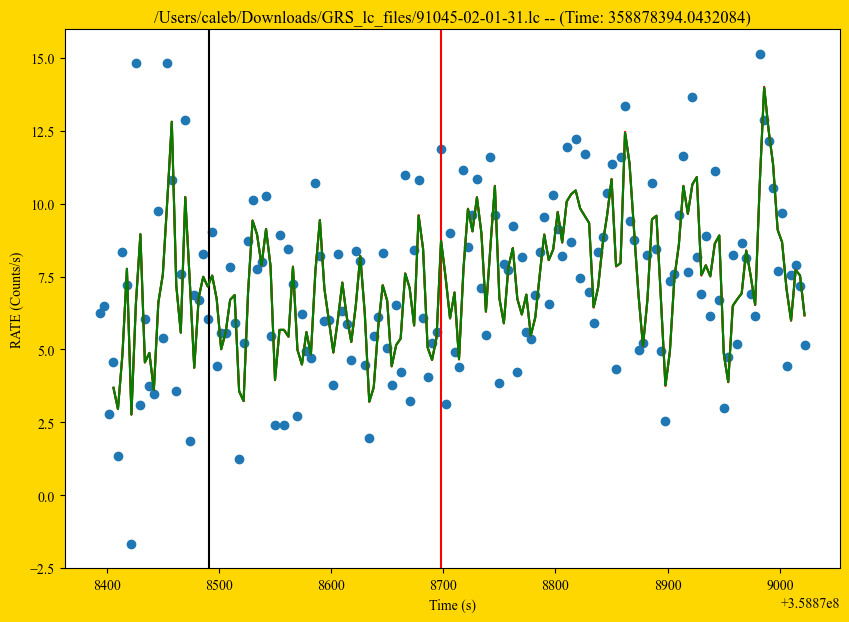

max 15.13519287109375
baseline 7.290362563314317
/Users/caleb/Downloads/GRS_lc_files/60038-01-06-01.lc
TIME_DIFF -1.6354014575481415
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: 969.3726863265038
SnR 1.2670635187122272
max 17.905710220336914
baseline 9.822587203654006


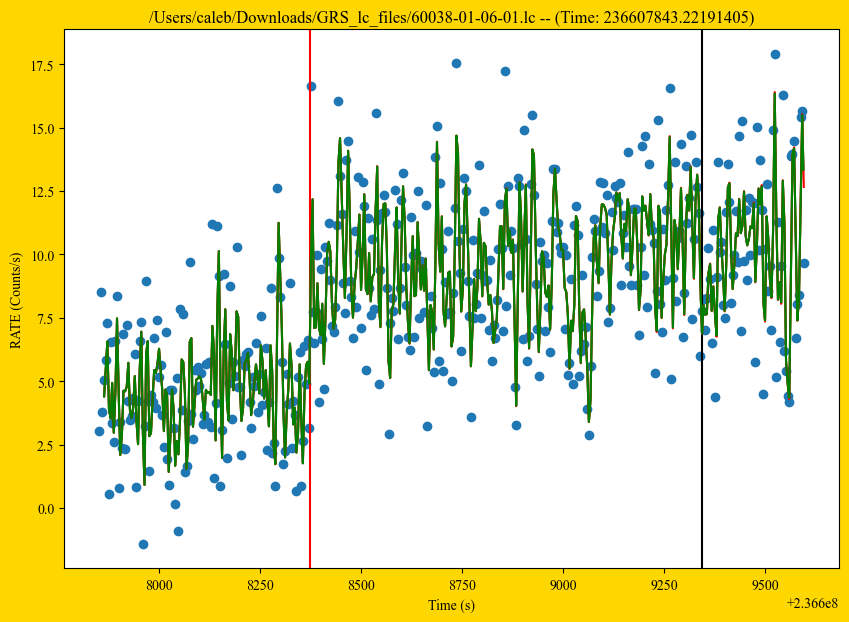

max 17.905710220336914
baseline 8.260839019269092
/Users/caleb/Downloads/GRS_lc_files/94041-01-01-14.lc
TIME_DIFF 0.8036562204360962
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: 312.92801558971405
SnR 0.1017425839335558
max 80.4698257446289
baseline 63.78098395445466


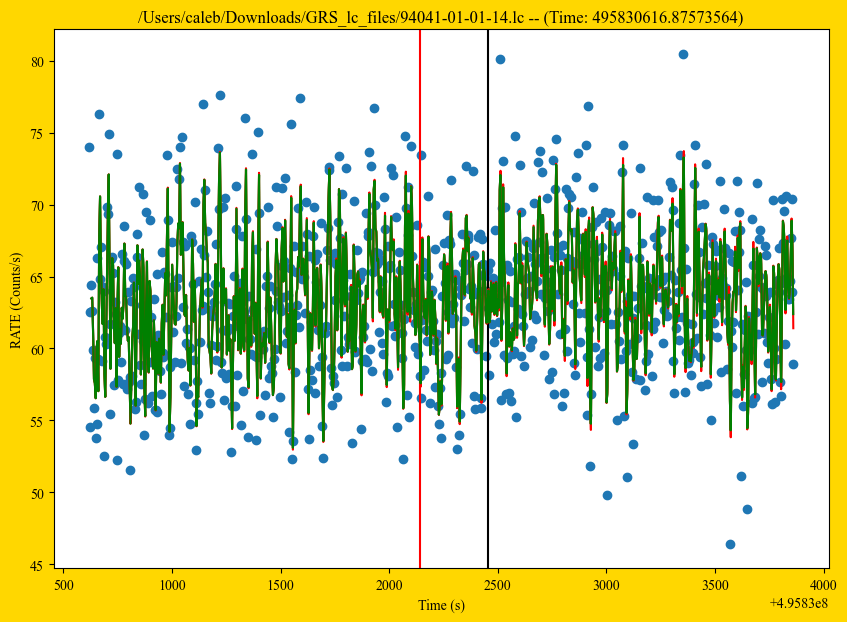

max 80.4698257446289
baseline 63.43455741205826
/Users/caleb/Downloads/GRS_lc_files/96052-02-02-02.lc
TIME_DIFF -0.9119260311126709
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: 231.1188325881958
SnR -0.2632921838130852
max 14.220067977905273
baseline 4.700342237032377


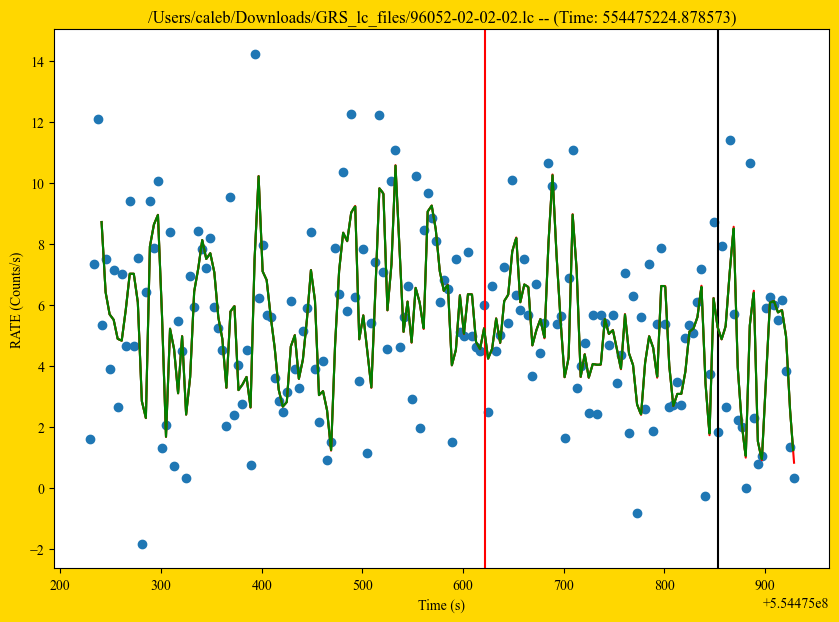

max 14.220067977905273
baseline 5.378869750282981
/Users/caleb/Downloads/GRS_lc_files/50034-01-05-02.lc
TIME_DIFF -14.03988230228424
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 1716 1716
time diff ingress: -1742.008318334818
SnR nan
max 15.570209503173828
baseline 6.587060369603774


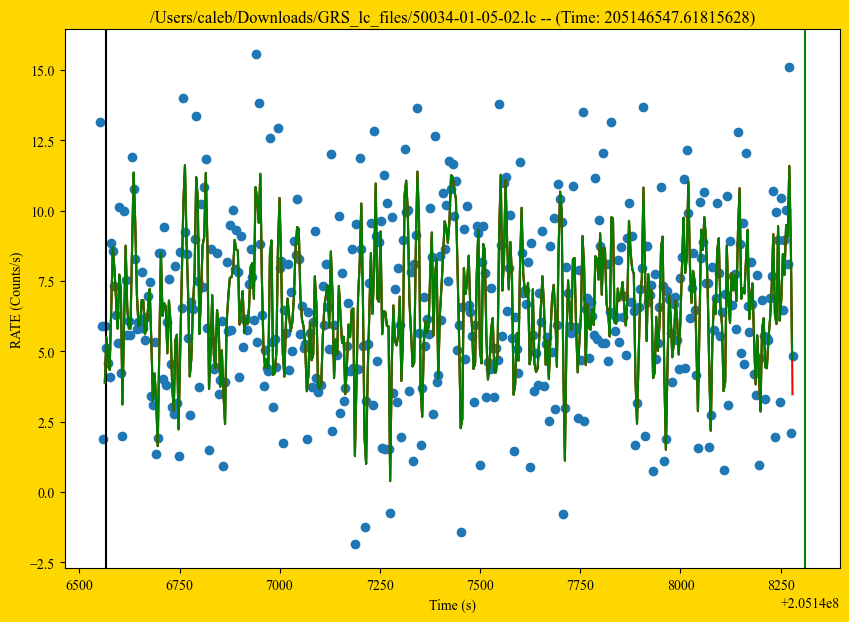

max 15.570209503173828
baseline 6.617917895592388
/Users/caleb/Downloads/GRS_lc_files/94041-01-01-11.lc
TIME_DIFF 1.8022907376289368
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 2100 2100
time diff ingress: -380.1393394470215
SnR -0.0930332637744898
max 88.49139404296875
baseline 70.93749525919127


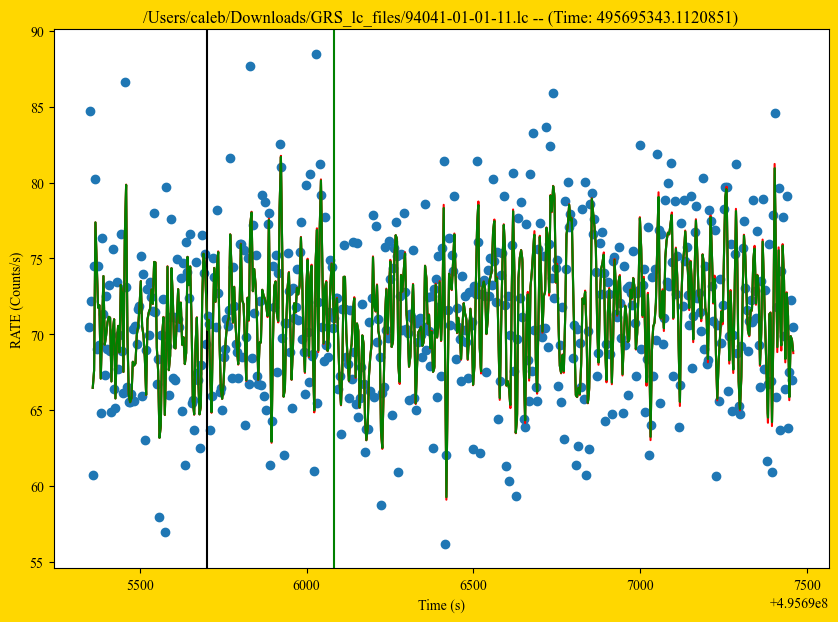

max 88.49139404296875
baseline 71.39320087973698
/Users/caleb/Downloads/GRS_lc_files/60038-01-06-00.lc
TIME_DIFF 0.8118385374546051
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 3244 3244
time diff ingress: 1953.812265098095
SnR -0.09509747078991888
TIME_DIFF -1.149117648601532
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: -790.0840419232845
SnR -0.025421577058249965
dip_rate, 5.761996920286224
SnR -0.0674340790252464
added
max 15.622098922729492
baseline 5.493285439231179


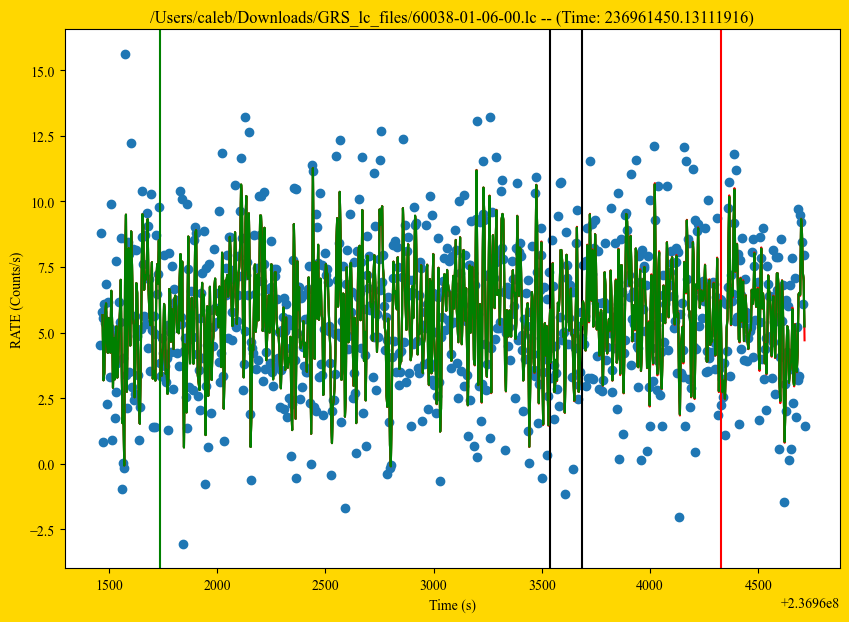

max 15.622098922729492
baseline 5.683109805330726
/Users/caleb/Downloads/GRS_lc_files/94041-01-03-01.lc
TIME_DIFF 0.996663510799408
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: 5681.194584846497
SnR -0.05244367897225889
max 61.210426330566406
baseline 46.30052515465444


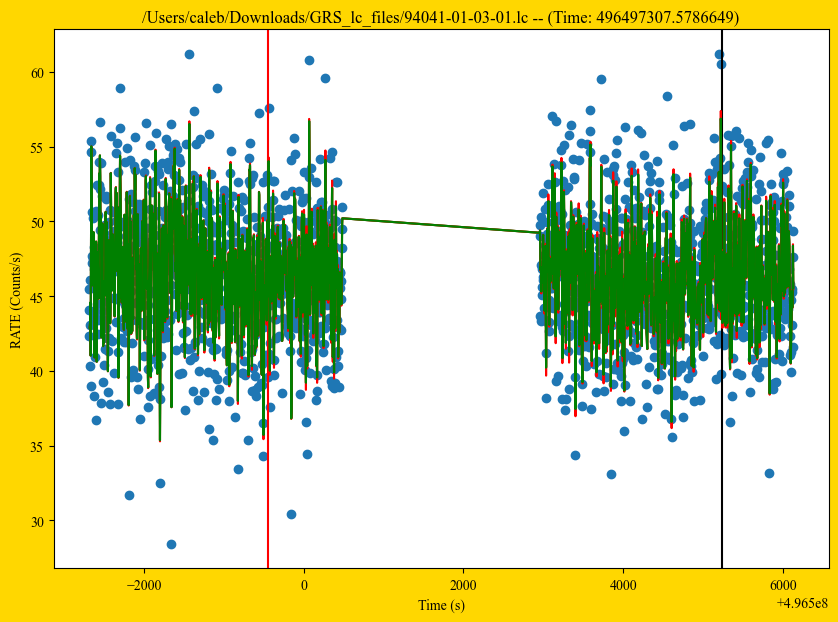

max 61.210426330566406
baseline 46.418045959232735
/Users/caleb/Downloads/GRS_lc_files/96052-02-02-00.lc
TIME_DIFF 0.02140331268310547
1
2
3
4
5
1
2
3
4
5
1
time diff egress: 76.06831645965576
SnR 0.11092637651764219
max 13.62446403503418
baseline 5.715641869439019


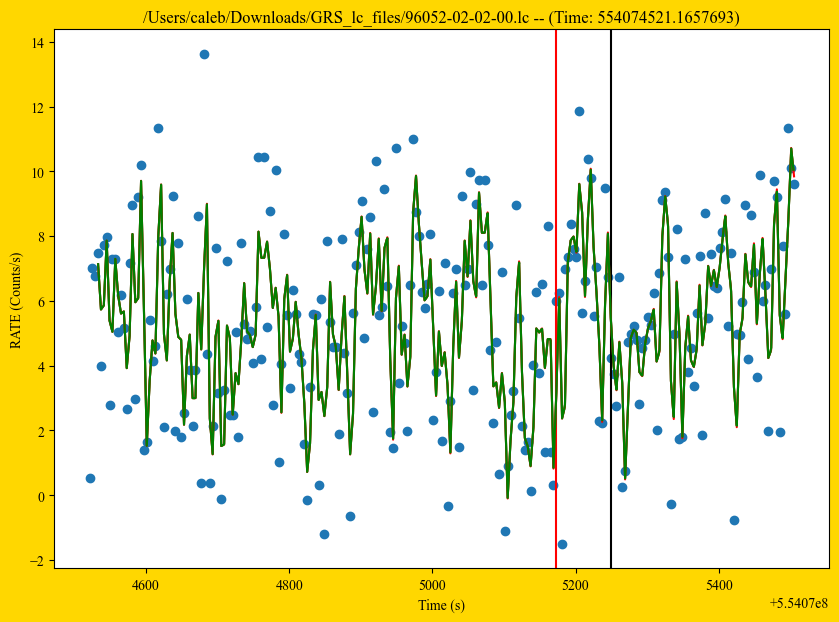

max 13.62446403503418
baseline 5.370666287688591
/Users/caleb/Downloads/GRS_lc_files/94041-01-01-12.lc
TIME_DIFF 1.449104368686676
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: 231.6455892920494
SnR -0.1213717736110176
max 2170.23095703125
baseline 65.56890556285465


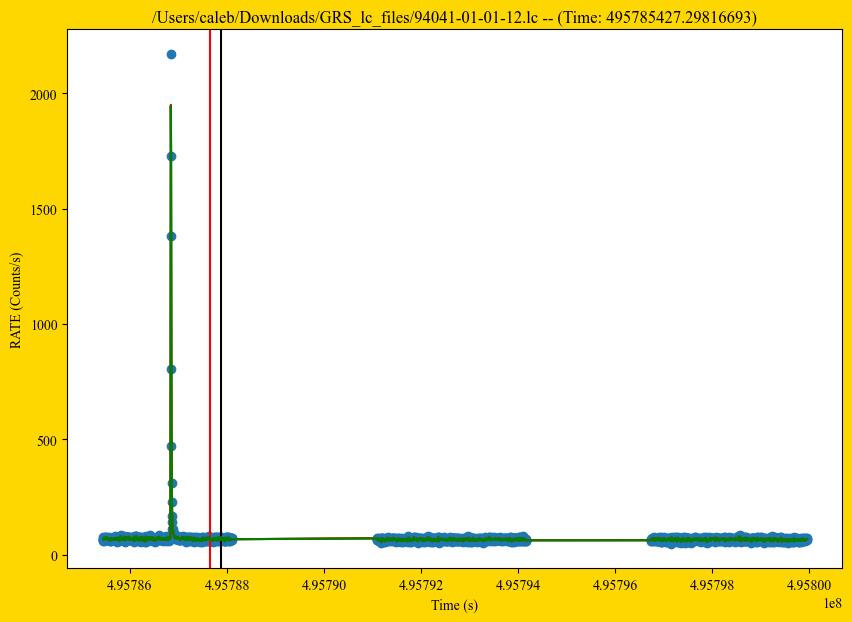

max 2170.23095703125
baseline 69.50718257560968
/Users/caleb/Downloads/GRS_lc_files/94041-01-01-06.lc
TIME_DIFF -0.550495445728302
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 23906 23906
time diff ingress: 10101.152079045773
SnR -0.02517710628517885
TIME_DIFF -1100.5293226242065
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: 7503.339637815952
SnR -0.079555788659559
dip_rate, 92.94730073127194
SnR -0.13193847084594182
added
max 2375.494140625
baseline 71.60170910780566


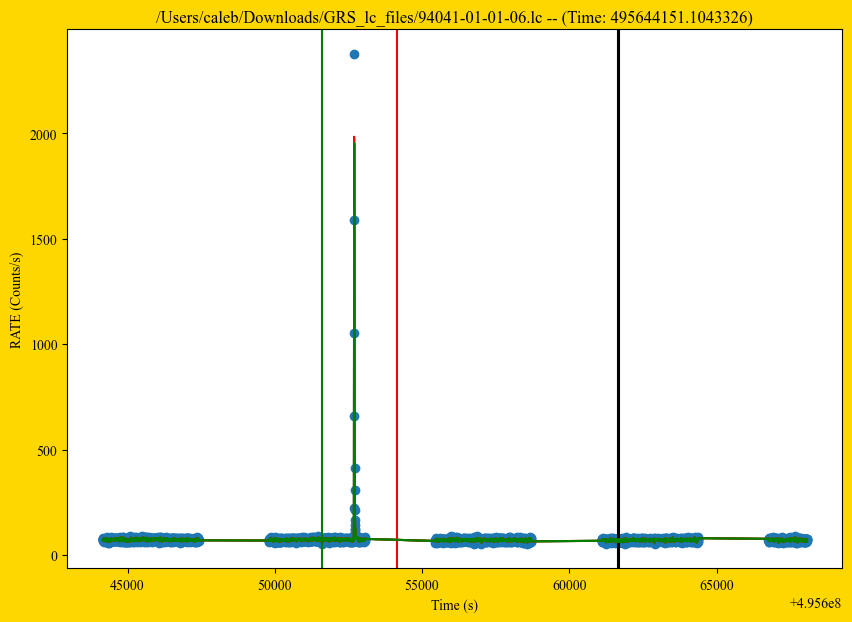

max 2375.494140625
baseline 73.65014975562886
/Users/caleb/Downloads/GRS_lc_files/50034-01-05-05.lc
TIME_DIFF 1.6393817961215973
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: -1289.3272495865822
SnR -0.030779843422321426
max 16.110610961914062
baseline 6.708084844893518


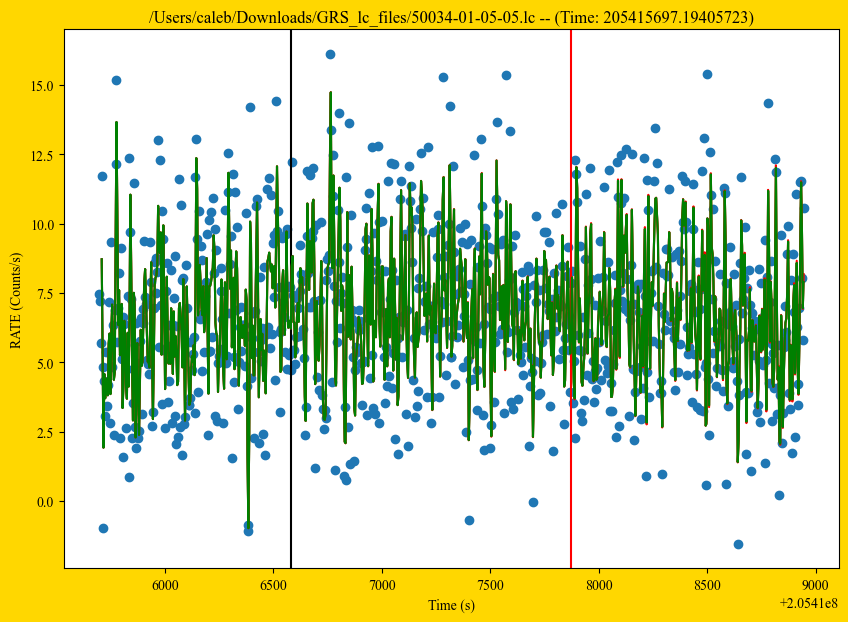

max 16.110610961914062
baseline 6.798848040722686
/Users/caleb/Downloads/GRS_lc_files/80045-02-10-00.lc
TIME_DIFF -0.3447544574737549
1
1
1
2
3
4
5
interp 468 468
time diff ingress: 4.684766590595245
midded
SnR 0.49532003185971335
max 12.845117568969727
baseline 6.8857673176547936


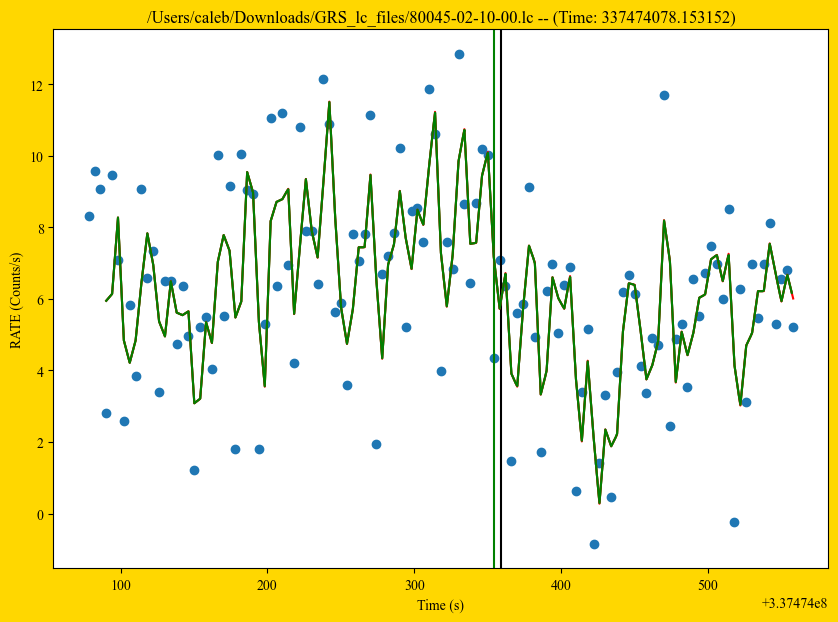

max 12.845117568969727
baseline 6.32747055873398
/Users/caleb/Downloads/GRS_lc_files/92046-02-02-02.lc
TIME_DIFF 0.691769003868103
1
1
2
3
4
5
1
2
3
4
5
interp 789 789
time diff ingress: -2.35982209444046
midded
SnR 1.65174609906517
max 33.492130279541016
baseline 22.36499917395761


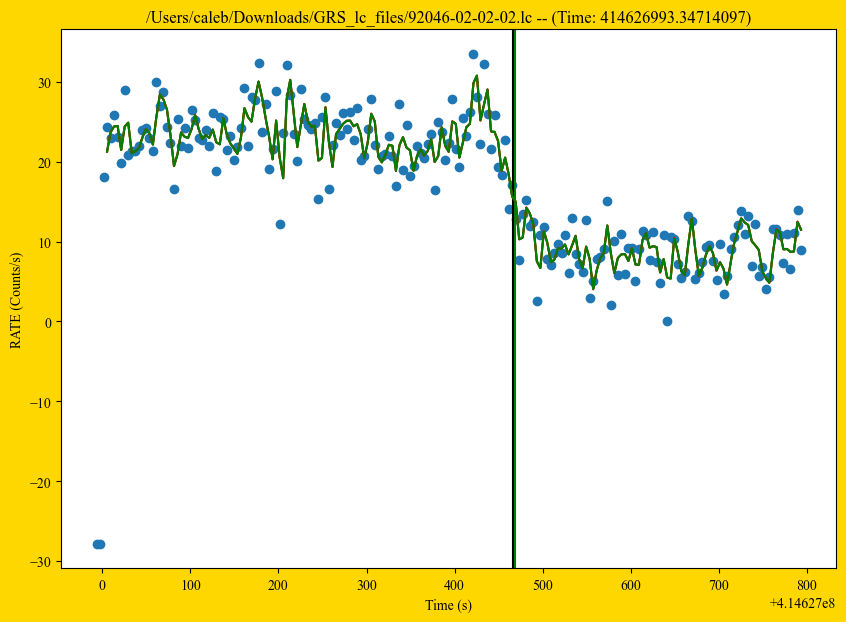

max 33.492130279541016
baseline 16.896378844531615
/Users/caleb/Downloads/GRS_lc_files/94041-01-03-13.lc
TIME_DIFF 0.5683821439743042
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 20107 20107
time diff ingress: -16189.571146130562
SnR -0.12216251162924263
max 67.5
baseline 36.809450628535934


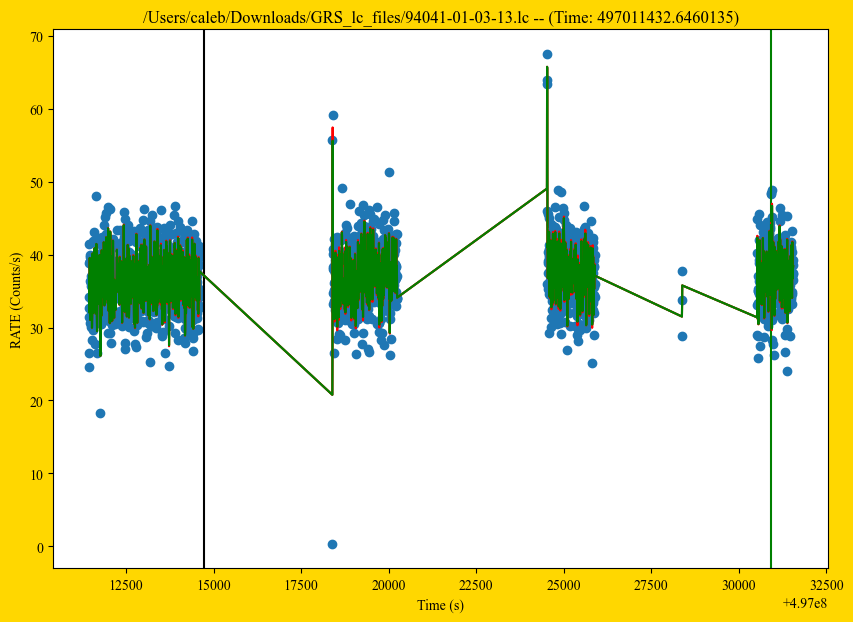

max 67.5
baseline 36.873656291048974
/Users/caleb/Downloads/GRS_lc_files/60038-01-06-02.lc
TIME_DIFF 0.9231358170509338
1
2
3
4
5
1
2
3
4
5
1
2
3
4
interp 1596 1596
time diff ingress: -334.052000105381
SnR 1.2238347234940719
max 17.016897201538086
baseline 10.126904976779016


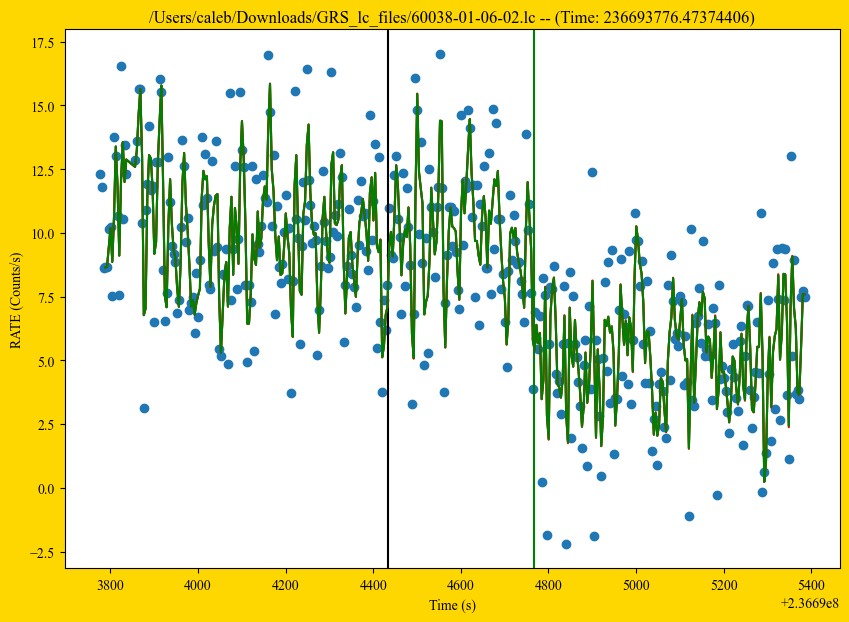

max 17.016897201538086
baseline 8.199736262884056
/Users/caleb/Downloads/GRS_lc_files/50034-01-05-04.lc
TIME_DIFF 0.669145405292511
1
2
3
4
5
1
2
3
4
5
1
2
3
4
interp 1312 1312
time diff ingress: 321.69972437620163
SnR -0.06167018258467143
max 14.994135856628418
baseline 5.96839917672647


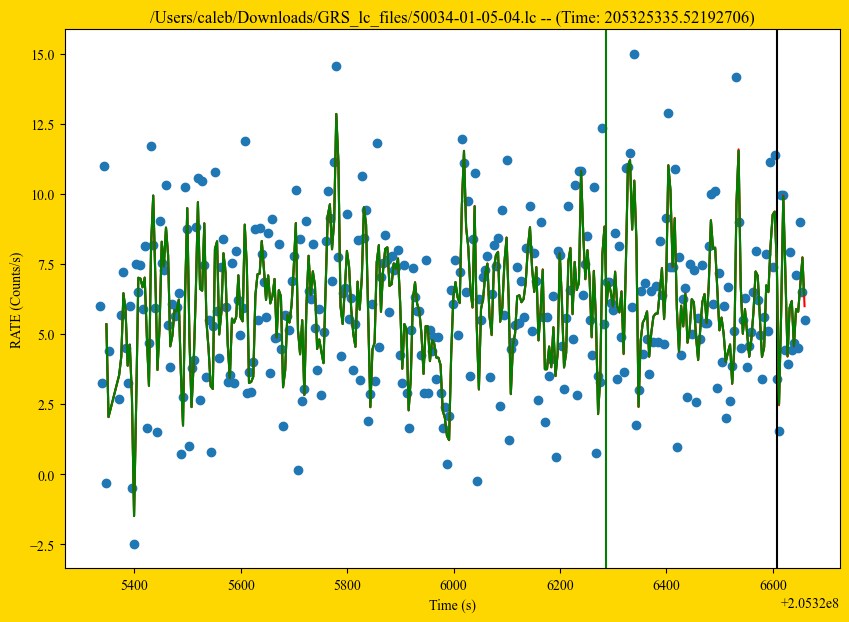

max 14.994135856628418
baseline 6.098860996525462
/Users/caleb/Downloads/GRS_lc_files/80045-02-10-01.lc
TIME_DIFF 0.5341805815696716
1
2
3
4
1
2
3
4
5
1
2
3
4
5
time diff egress: -13.454003095626831
midded
SnR 0.8638869227611609
max 14.68082332611084
baseline 7.8167147514147635


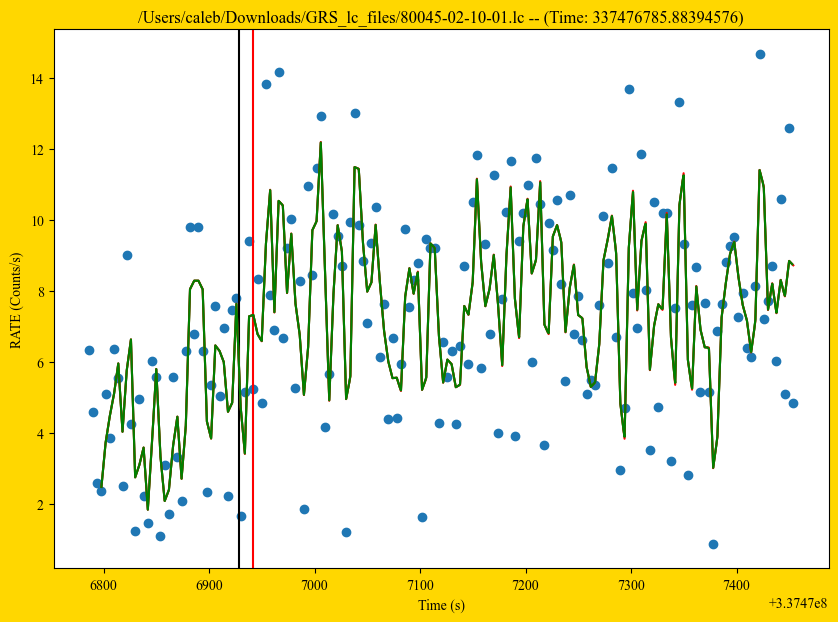

max 14.68082332611084
baseline 7.179531540189471
/Users/caleb/Downloads/GRS_lc_files/94041-01-01-03.lc
TIME_DIFF 0.6373593211174011
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: 1155.6476836800575
SnR 0.08339088909636395
max 93.882568359375
baseline 73.2947573498209


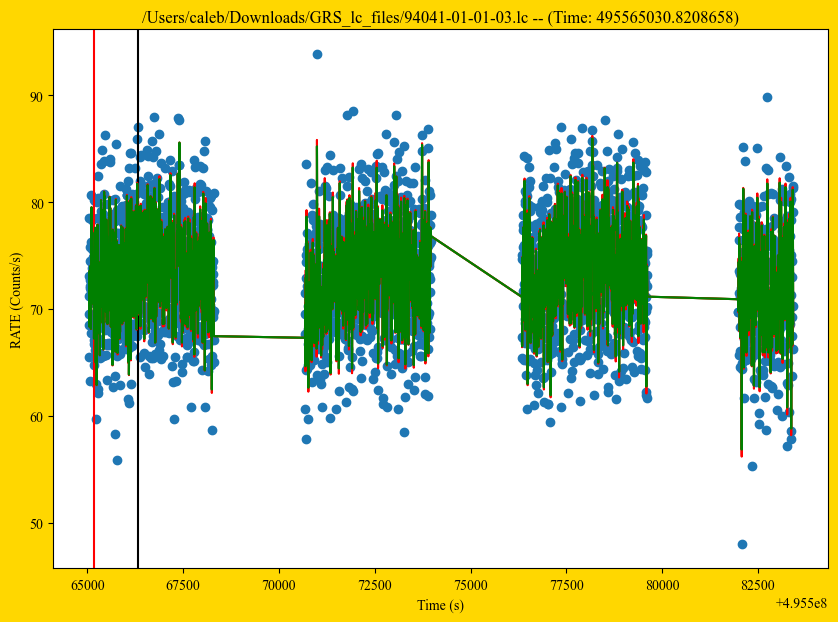

max 93.882568359375
baseline 73.2755027475787
/Users/caleb/Downloads/GRS_lc_files/96052-02-02-01.lc
TIME_DIFF -1.6612846851348877
1
2
3
4
5
1
2
3
4
5
1
2
3
4
interp 1212 1212
time diff ingress: 62.40000057220459
SnR 0.32665517237418984
max 12.636560440063477
baseline 6.122814631462097


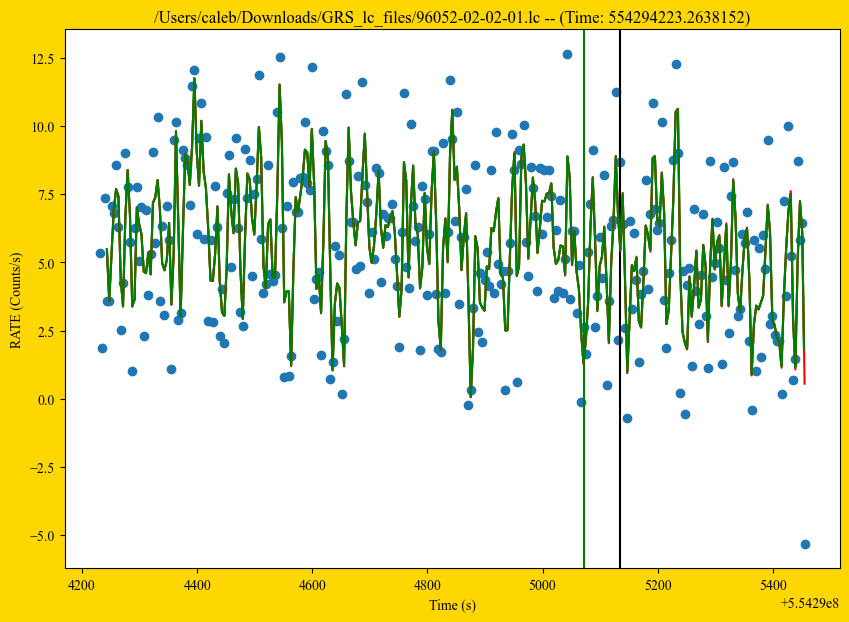

max 12.636560440063477
baseline 5.665489622358391
/Users/caleb/Downloads/GRS_lc_files/96052-02-01-00.lc
TIME_DIFF 1.2277333736419678
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: 1278.2699726819992
SnR 0.004683165784793647
max 14.87362289428711
baseline 5.684293504235541


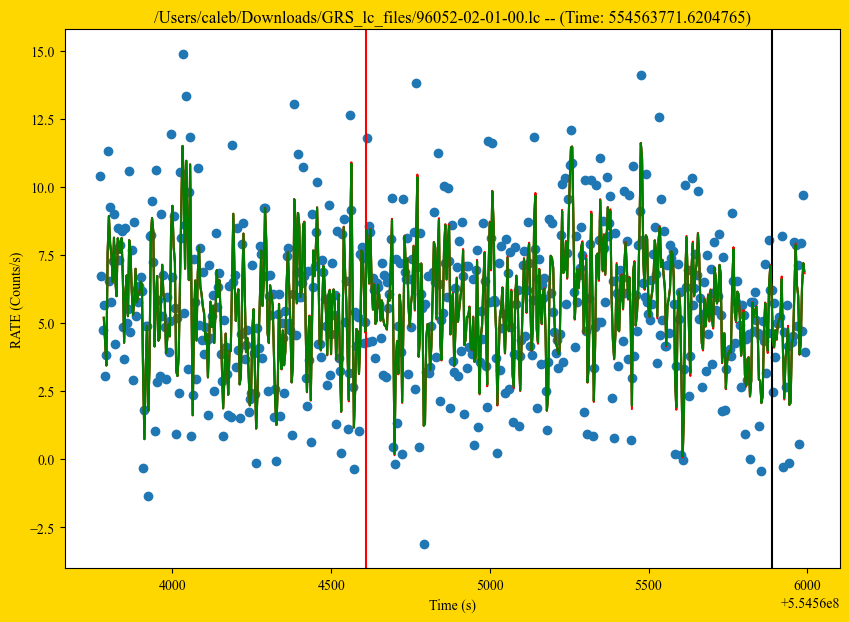

max 14.87362289428711
baseline 5.677016954621126
/Users/caleb/Downloads/GRS_lc_files/91045-02-01-32.lc
TIME_DIFF -0.26142144203186035
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 1441 1441
time diff ingress: -581.304610490799
SnR 0.10958557251256684
max 14.633005142211914
baseline 6.865356182762485


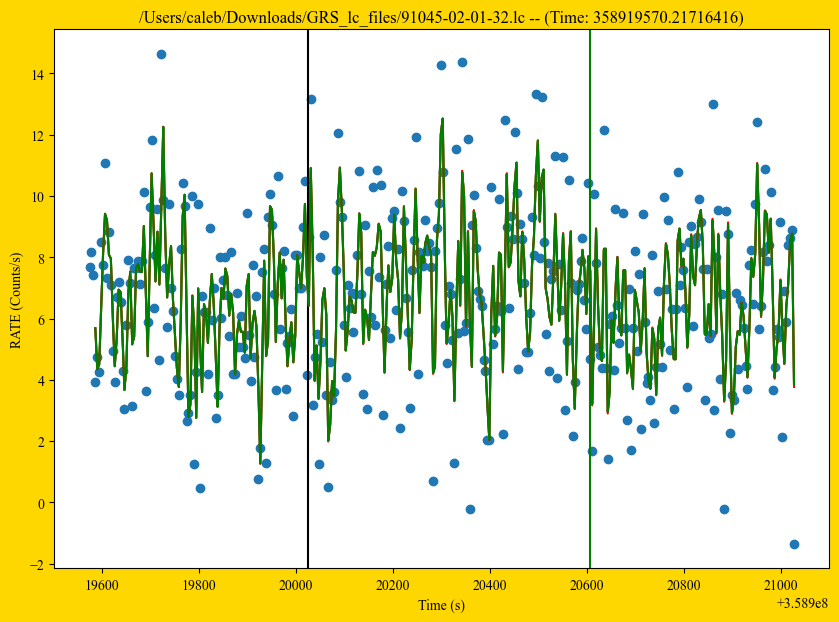

max 14.633005142211914
baseline 6.716042130858034
/Users/caleb/Downloads/GRS_lc_files/50034-01-08-02.lc
TIME_DIFF -7.668996274471283
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 1408 1408
time diff ingress: -1427.5713898539543
SnR nan
max 118.15156555175781
baseline 85.14783420945307


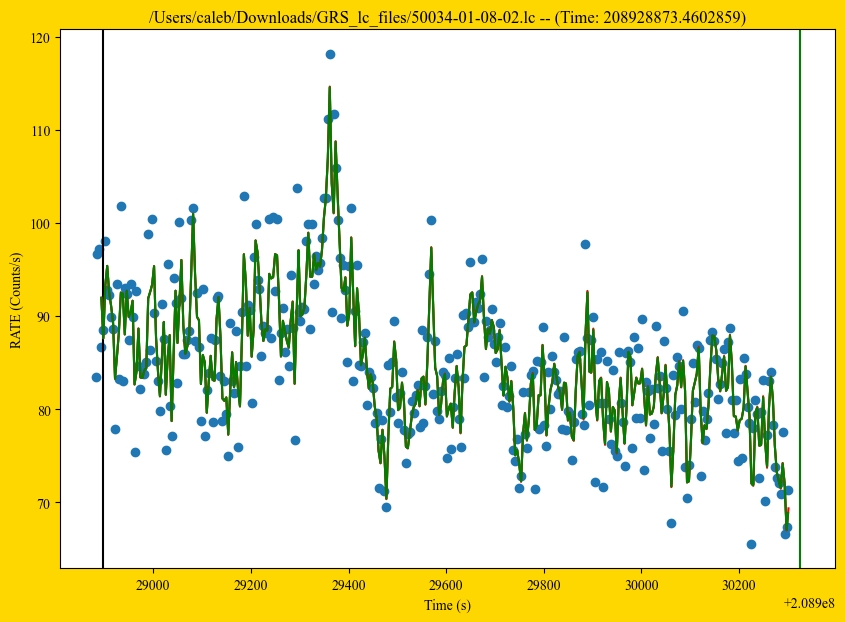

max 118.15156555175781
baseline 84.87357281031234
/Users/caleb/Downloads/GRS_lc_files/94041-01-04-07.lc
TIME_DIFF 984.6342143416405
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 13003 13003
time diff ingress: 3463.0607384443283
SnR 0.13163623094758983
TIME_DIFF 0.8085957169532776
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: 4198.360271692276
SnR -0.12840592859397226
dip_rate, 31.049641032907413
SnR -0.06046068664167388
added
max 45.06523132324219
baseline 30.730574960463166


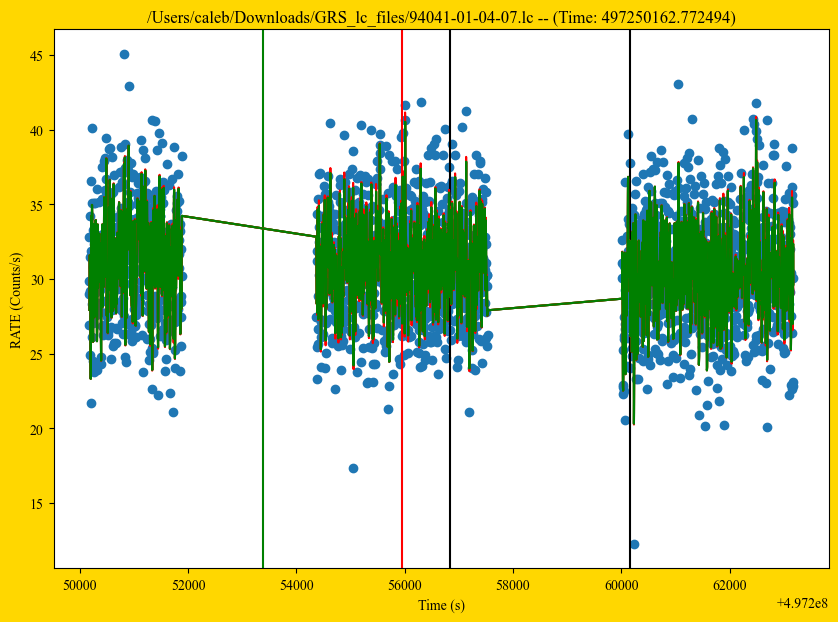

max 45.06523132324219
baseline 30.801660961785327
/Users/caleb/Downloads/GRS_lc_files/94041-01-02-06.lc
TIME_DIFF 0.877605676651001
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 2896 2896
time diff ingress: -1109.8968047499657
SnR 0.05345755542297191
max 81.32029724121094
baseline 62.442746302244885


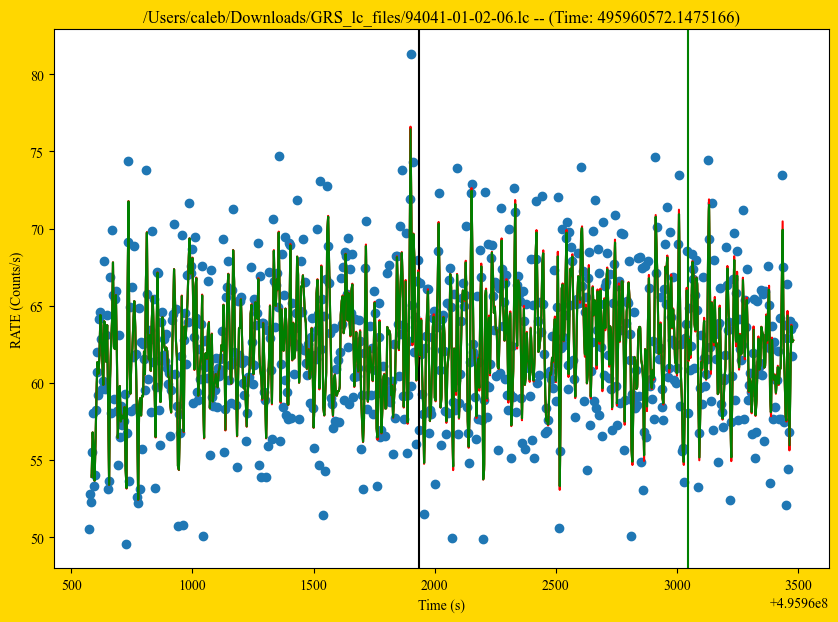

max 81.32029724121094
baseline 62.40081585370577
/Users/caleb/Downloads/GRS_lc_files/50034-01-06-05.lc
TIME_DIFF -1.454258769750595
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: 26.557040959596634
SnR 0.006668090556186512
max 14.93484115600586
baseline 7.16858162384867


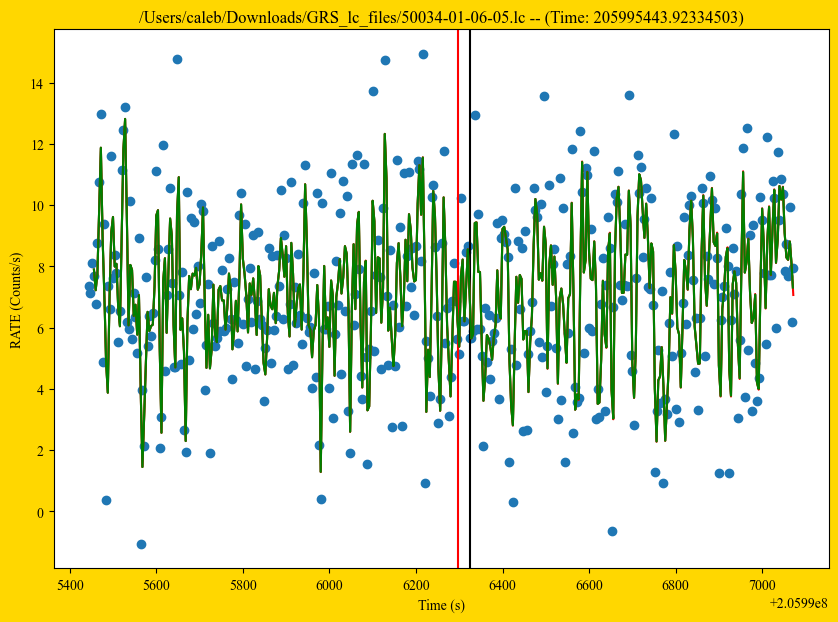

max 14.93484115600586
baseline 7.129378274375317
/Users/caleb/Downloads/GRS_lc_files/50034-01-04-00.lc
TIME_DIFF 0.5977673232555389
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 3329 3329
time diff ingress: 2003.5189585089684
SnR 0.12304713002450006
TIME_DIFF 0.0618053674697876
1
2
1
2
3
4
5
1
2
3
4
5
time diff egress: 11.739310532808304
midded
SnR 0.4735678106352633
dip_rate, 6.198213256835937
SnR 0.15296632151030765
added
max 18.138572692871094
baseline 6.880470094505263


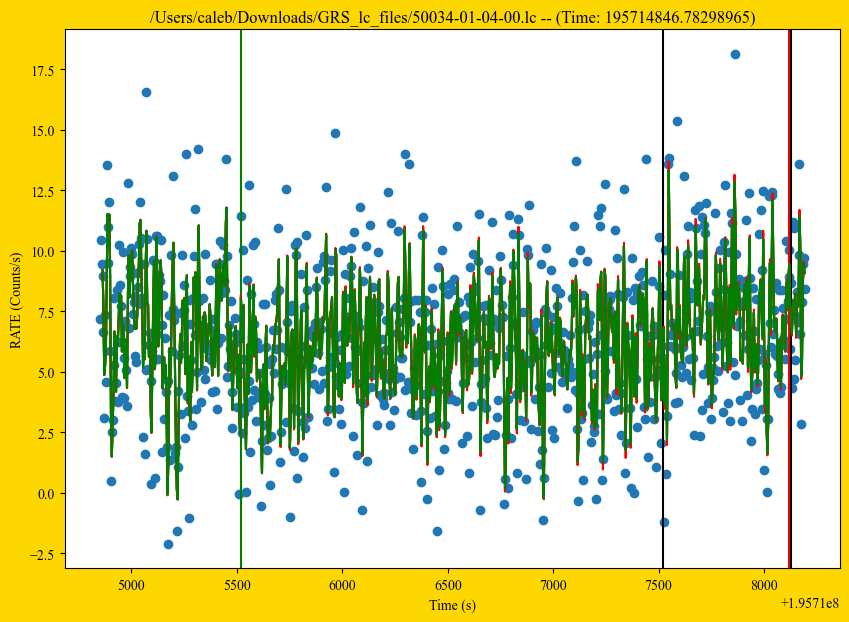

max 18.138572692871094
baseline 6.342869229293896
/Users/caleb/Downloads/GRS_lc_files/93052-02-06-01.lc
TIME_DIFF 0.37657594680786133
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: -455.6668392419815
SnR nan
max 77.85612487792969
baseline nan


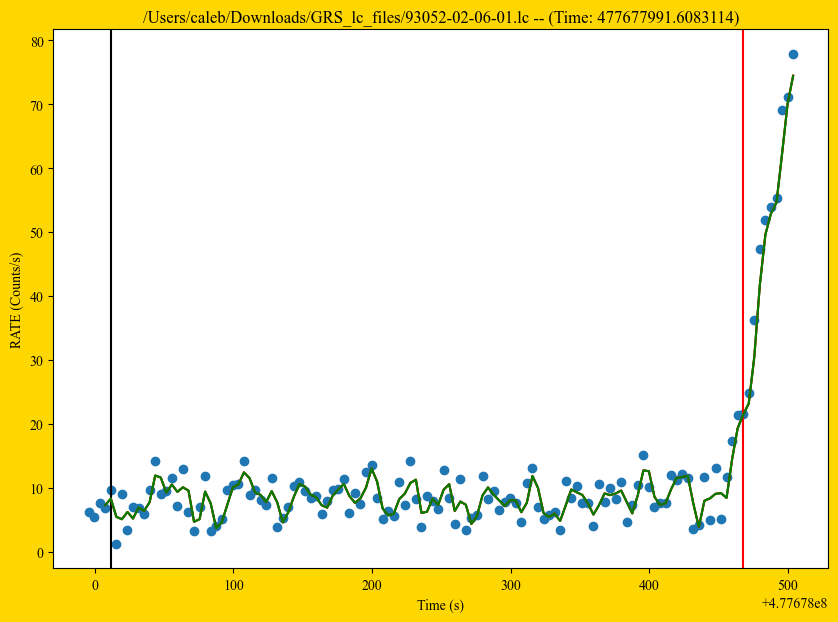

max 77.85612487792969
baseline 11.804262898862362
/Users/caleb/Downloads/GRS_lc_files/94041-01-03-09.lc
TIME_DIFF -0.014571845531463623
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: 5345.017431676388
SnR 0.1886161623473195
max 53.818702697753906
baseline 38.44660939459981


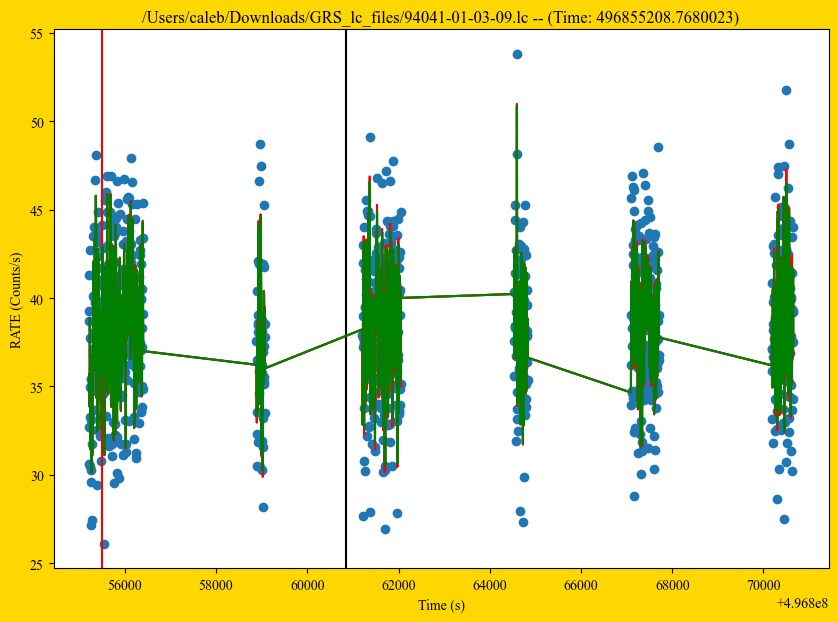

max 53.818702697753906
baseline 38.32953494537219
/Users/caleb/Downloads/GRS_lc_files/50034-01-06-04.lc
TIME_DIFF -1.5423253178596497
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: -837.4912653565407
SnR -0.34987360536795886
max 17.31708526611328
baseline 5.744560377938407


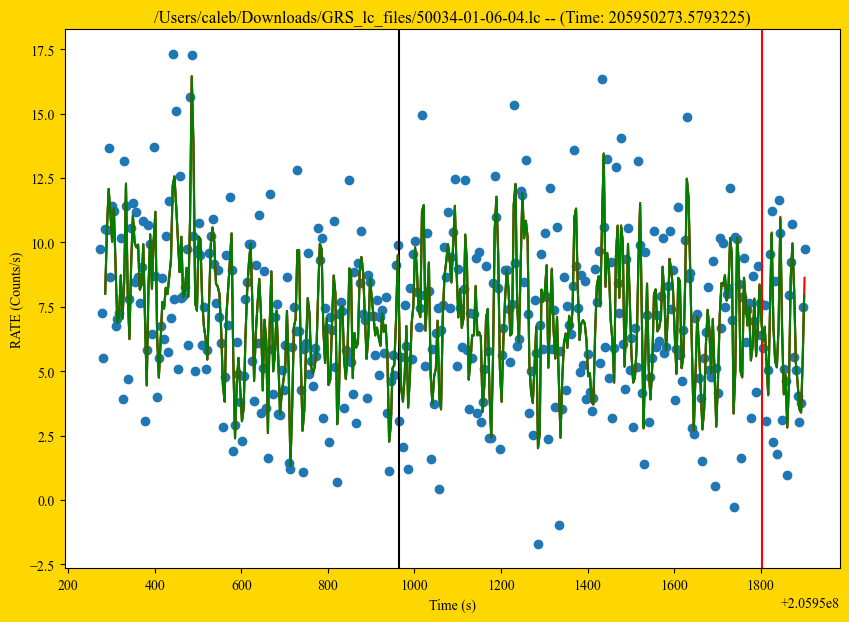

max 17.31708526611328
baseline 7.141896444208482
/Users/caleb/Downloads/GRS_lc_files/96052-02-01-01.lc
TIME_DIFF -1.7605276107788086
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: -788.7203223705292
SnR 0.0663814671036319
max 13.157793045043945
baseline 5.208708849820224


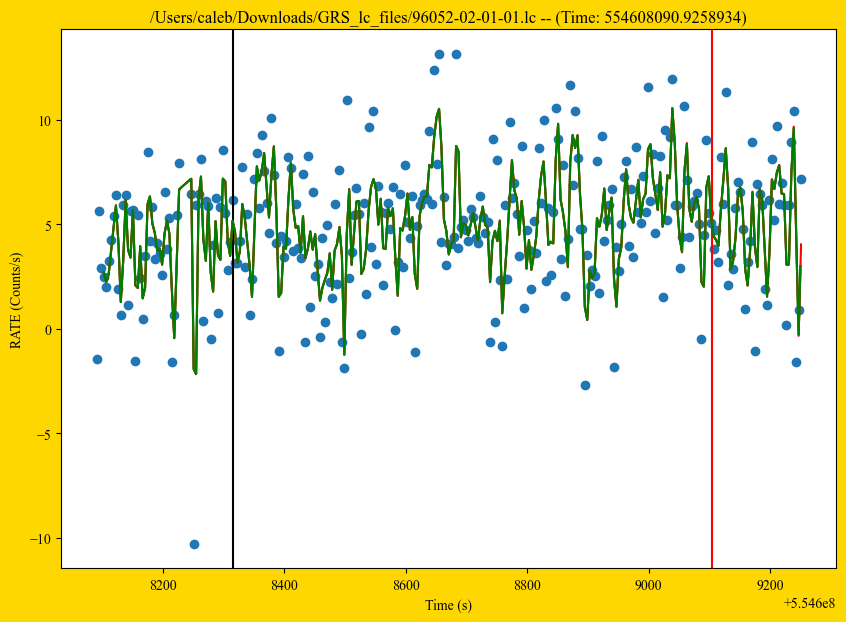

max 13.157793045043945
baseline 4.937004621020593
/Users/caleb/Downloads/GRS_lc_files/94041-01-01-09.lc
TIME_DIFF 1.1428829431533813
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
interp 14523 14523
time diff ingress: 2608.7215082645416
SnR -0.045951623112528546
TIME_DIFF 1.0836538076400757
1
2
3
4
5
1
2
3
4
5
1
2
3
4
5
time diff egress: 3878.9152874946594
SnR 0.09661725456122221
dip_rate, 68.1579697578184
SnR 0.05689728154974455
added
max 87.17521667480469
baseline 68.58101422145076


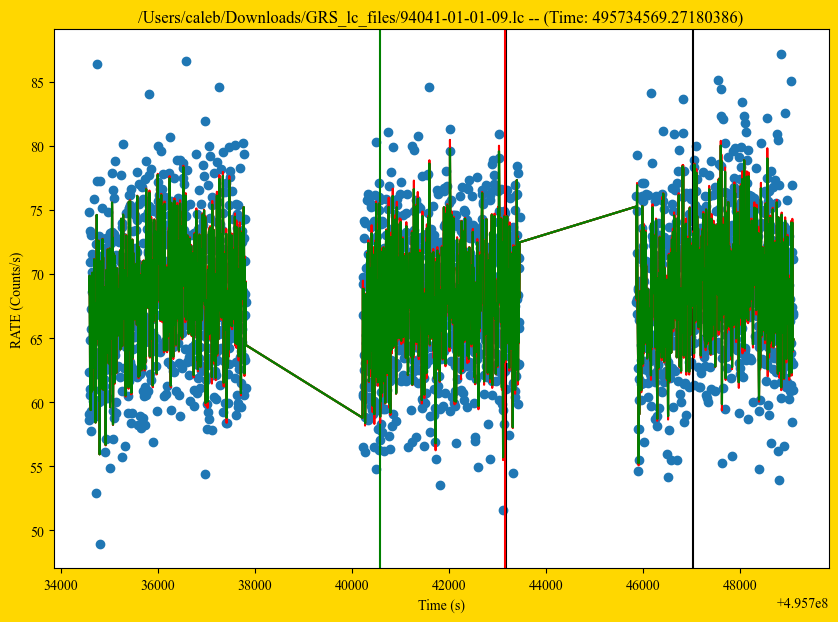

max 87.17521667480469
baseline 68.44946578966949
# clear ingress and egress 0 0
# invisible ingress/egress 21 26
# observations with either ingr/egre 39
# observations with both 8
# data Missing 1
['/Users/caleb/Downloads/GRS_lc_files/91045-02-01-20.lc', '/Users/caleb/Downloads/GRS_lc_files/91045-02-01-20.lc', '/Users/caleb/Downloads/GRS_lc_files/96052-02-01-03.lc', '/Users/caleb/Downloads/GRS_lc_files/96052-02-02-02.lc', '/Users/caleb/Downloads/GRS_lc_files/94041-01-01-12.lc', '/Users/caleb/Downloads/GRS_lc_files/94041-01-01-12.lc', '/Users/caleb/Downloads/GRS_lc_files/94041-01-01-06.lc', '/Users/caleb/Downloads/GRS_lc_files/94041-01-01-06.lc', '/Users/caleb/Downloads/GRS_lc_files/93052-02-06-01.lc', '/Users/caleb/Downloads/GRS_lc_files/50034-01-06-04.lc']


In [72]:
RXTE_analysis(gone,True,False)

In [27]:
sns

array([[0.02126731, 0.01022368, 0.02398902, ..., 0.20296672, 0.13360017,
        0.01623753],
       [0.02126731, 0.01022368, 0.02398902, ..., 0.20296672, 0.13360017,
        0.01623753],
       [0.02126731, 0.01022368, 0.02398902, ..., 0.20296672, 0.13360017,
        0.01623753],
       ...,
       [0.02126731, 0.01022368, 0.02398902, ..., 0.20296672, 0.13360017,
        0.01623753],
       [0.02126731, 0.01022368, 0.02398902, ..., 0.20296672, 0.13360017,
        0.01623753],
       [0.02126731, 0.01022368, 0.02398902, ..., 0.20296672, 0.13360017,
        0.01623753]])

111


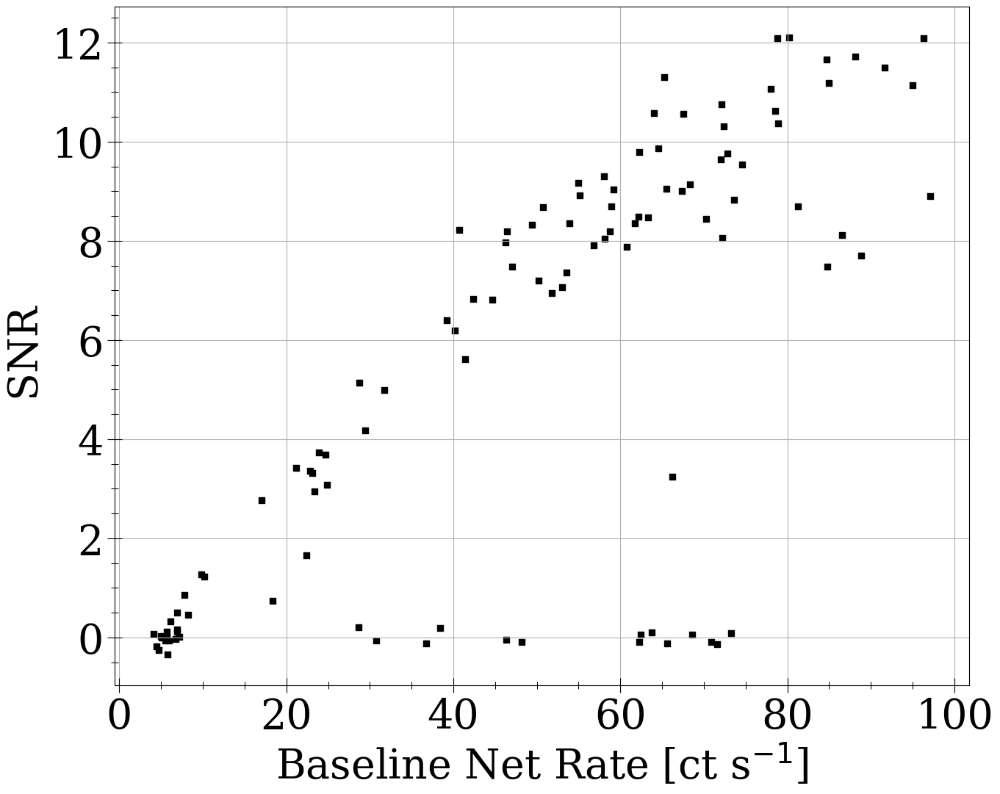

[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1.  1.1 1.2 1.3]


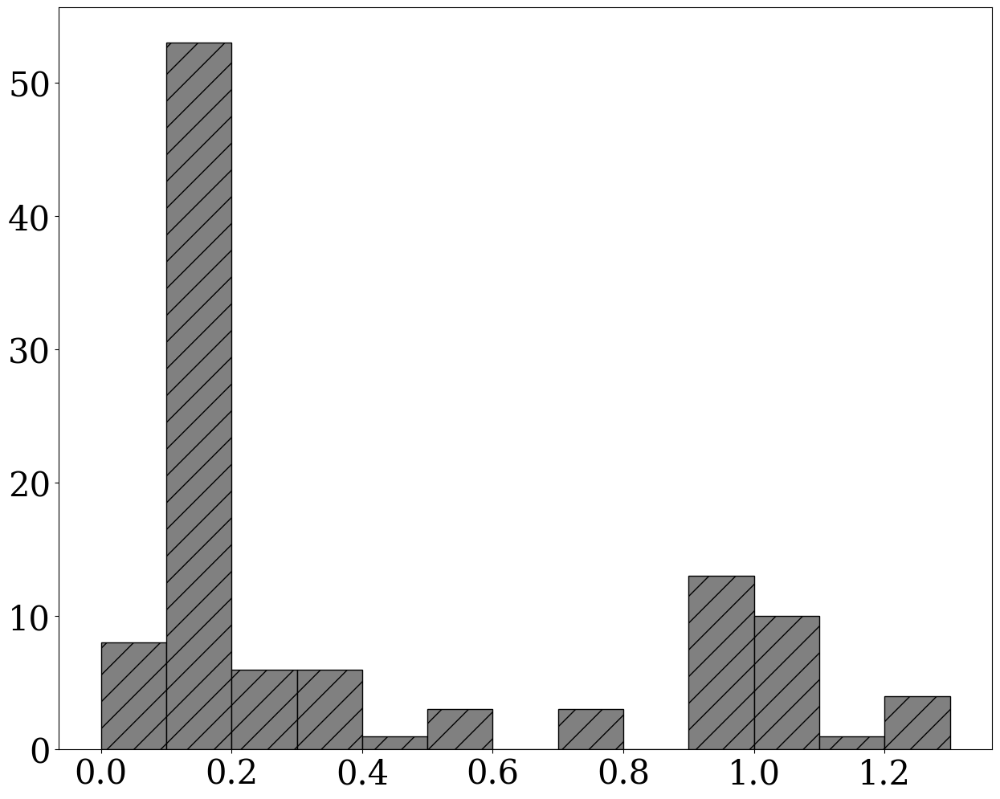

111


In [90]:
#dip analysis

"""# Dip/Baseline Analysis"""

baselines = [i[0] for i in all_info]
dip_rates = [i[1] for i in all_info]
noises = [i[-1] for i in all_info]

print(len(noises))
plt.rcParams["figure.figsize"] = (15,12)

big_bois = []
size = 40

for row,dip_rate in enumerate(dip_rates):
    if dip_rate > 40:
        big_bois.append(all_info[row][2])
        


    
rates_np = np.array(dip_rates)
baselines_np = np.array(baselines)
ratios = rates_np/baselines_np
sns = (baselines-ratios) / np.array(noises) 

plt.rcParams.update({
            'font.sans-serif': 'Times New Roman',
            'font.family': 'serif',
            })

plt.scatter(baselines,snrs,color='black',s=40,marker='s')

plt.xlabel(r"Baseline Net Rate [ct s$^{-1}$]",fontsize=size)
plt.ylabel("SNR ",fontsize=size)
# plt.ylim(0,2)
# x= np.arange(0,100)
# y= x
# plt.plot(x,y,'--',color='black')
plt.tick_params(axis='both', which='both', labelsize=size,direction='inout',length=15)
plt.tick_params(which='minor', width=0.75, length=7)
plt.minorticks_on()

plt.grid()
plt.savefig('SNRS_rxte')
plt.show()

bin = np.arange(0,1.4,.1)
print(bin)
plt.hist(ratios,bins=bin,facecolor='grey', 
         hatch='/', edgecolor='k',fill=True)
plt.show()
print(len(baselines))

In [89]:
big_bois

['/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-02-10.lc',
 '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-02-00.lc',
 '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-14.lc',
 '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-11.lc',
 '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-03-01.lc',
 '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-12.lc',
 '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-06.lc',
 '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-03.lc',
 '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-02-06.lc',
 '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-09.lc']

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-02-10.lc
max 60.65434646606445
baseline 48.15869375218682


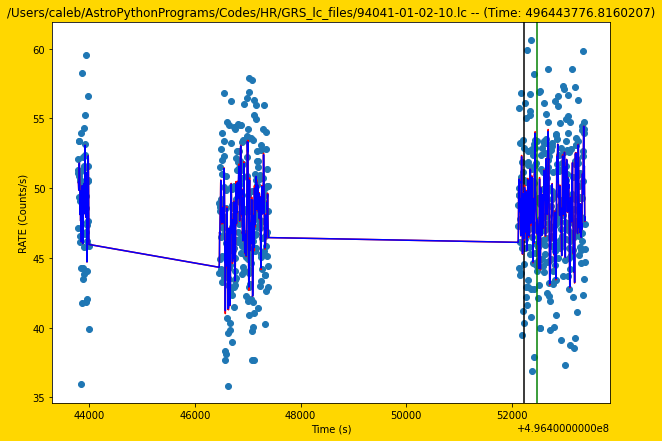

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-02-00.lc
max 82.58758544921875
baseline 62.28627808974786


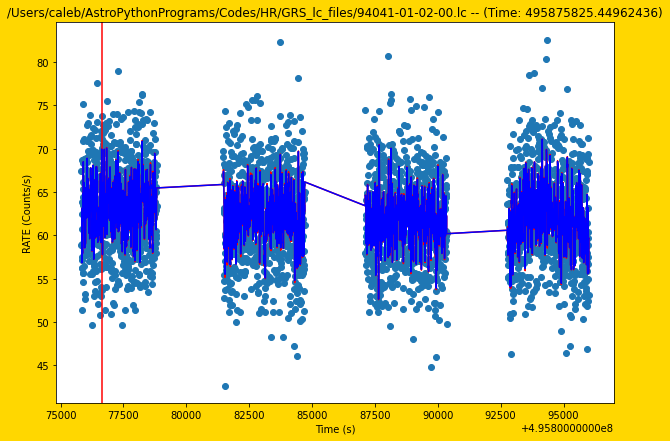

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-14.lc
max 80.4698257446289
baseline 63.798298854094284


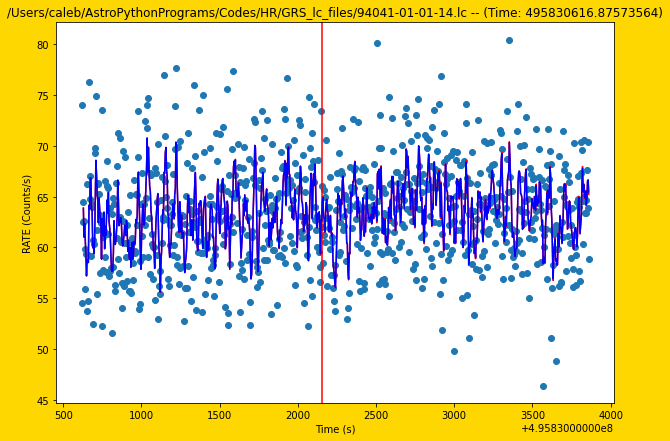

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-11.lc
max 88.49139404296875
baseline 70.93038348264473


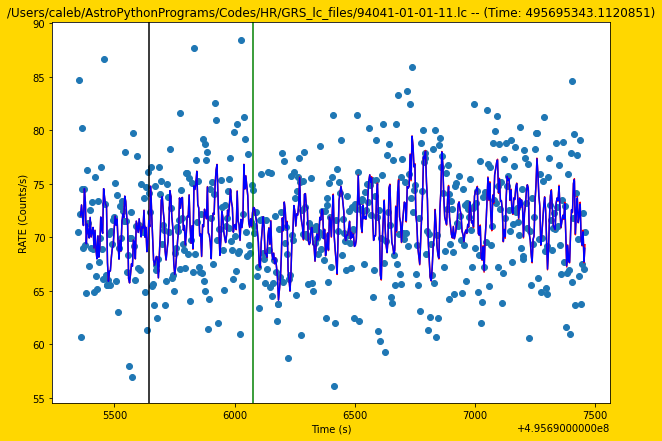

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-03-01.lc
max 61.210426330566406
baseline 46.28938947943097


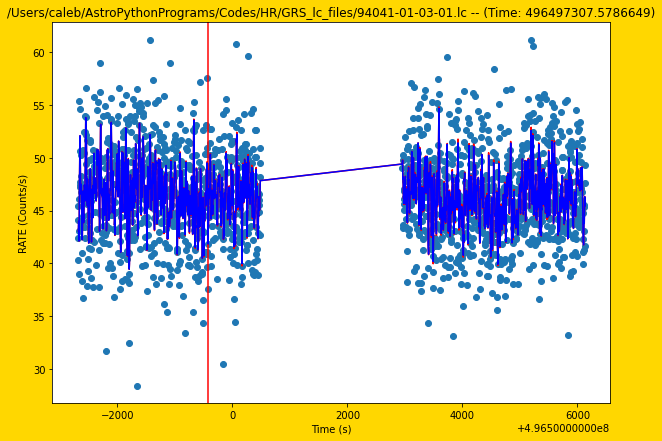

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-12.lc
max 2170.23095703125
baseline 65.5712702666945


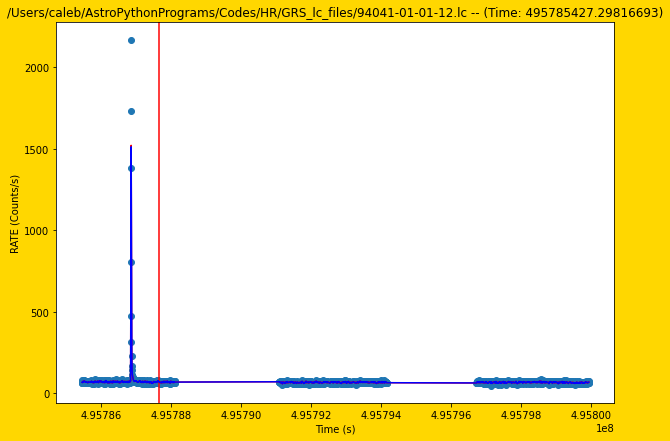

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-06.lc
max 2375.494140625
baseline 71.78642415918989


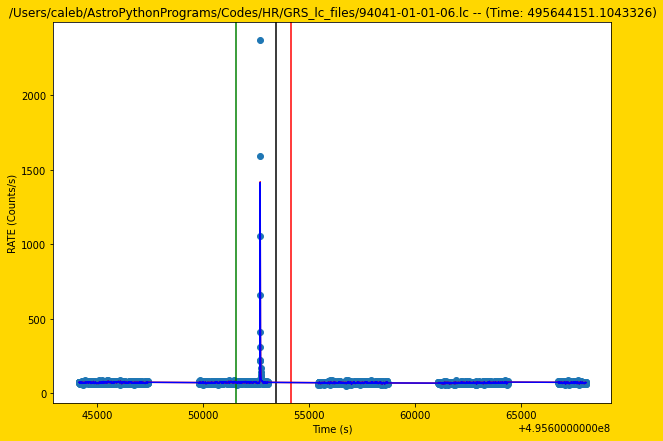

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-03.lc
max 93.882568359375
baseline 73.29627447479976


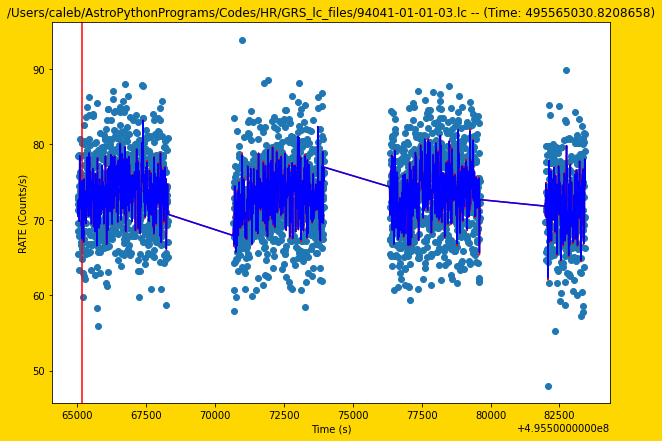

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-02-06.lc
max 81.32029724121094
baseline 62.44682289979639


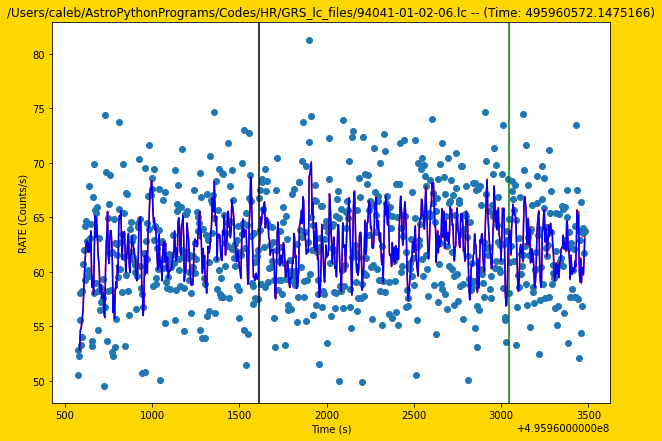

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-09.lc
max 87.17521667480469
baseline 68.5897748810363


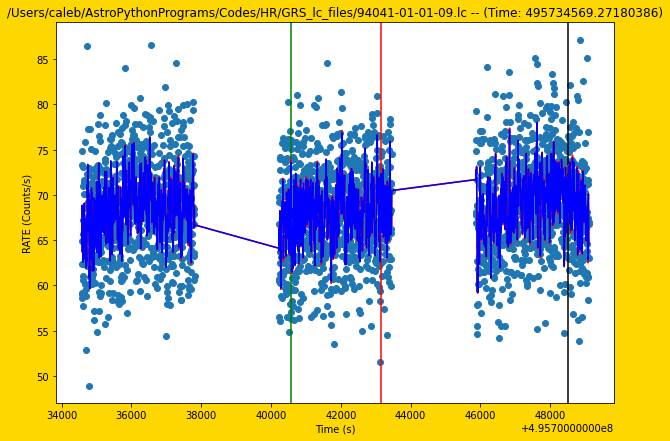

['/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-12.lc', '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-06.lc']


([],
 [],
 [(48.15869375218682,
   48.77153265129015,
   '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-02-10.lc',
   496443776.8160207),
  (62.28627808974786,
   62.88078161842465,
   '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-02-00.lc',
   495875825.44962436),
  (63.798298854094284,
   63.05107090037356,
   '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-14.lc',
   495830616.87573564),
  (70.93038348264473,
   71.63474577253645,
   '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-11.lc',
   495695343.1120851),
  (46.28938947943097,
   46.62540076740396,
   '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-03-01.lc',
   496497307.5786649),
  (65.5712702666945,
   81.68588265219887,
   '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-12.lc',
   495785427.29816693),
  (71.78642415918989,
   92.89456510819451,
   '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01

In [90]:
RXTE_analysis(big_bois,True,True)

/Users/caleb/Downloads/GRS_lc_files/30427-01-01-00.lc
MJD start 51069.34555939764
max 100.71379852294922
baseline 77.7925106917569
/Users/caleb/Downloads/GRS_lc_files/40419-01-01-00.lc
MJD start 51310.927847701525
max 110.7471923828125
baseline 90.47734254232496
/Users/caleb/Downloads/GRS_lc_files/40419-01-02-00.lc
MJD start 51448.72831783542
max 449.9937744140625
baseline 382.6901357919892
/Users/caleb/Downloads/GRS_lc_files/40419-01-02-01.lc
MJD start 51448.783404903035
INGRESS EXPECTED
TIME_DIFF 0.7668431401252747
baseline: 99.57852325439453
dip_rate_OC: 11.003364849090577
half means 55.29094405174255 59.07421411228644 51.50767399119866
interp time: 181076893.8039069 181076894.70443314
[0.0, 3.999652177095413, 7.9993042051792145, 11.998955994844437, 15.998607605695724, 19.998259007930756, 23.997910261154175, 27.99756133556366, 31.997212201356888, 35.99686285853386, 39.996513307094574, 43.996163576841354, 47.99581369757652, 51.99546357989311, 55.995113253593445, 59.99476274847984, 63

/opt/homebrew/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/homebrew/lib/python3.11/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/opt/homebrew/lib/python3.11/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/homebrew/lib/python3.11/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/opt/homebrew/lib/python3.11/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


MJD start 52066.253163580564
INGRESS EXPECTED
TIME_DIFF -0.3069494962692261
baseline: 73.51923599243165
dip_rate_OC: 9.990703296661376
half means 41.75496964454651 44.95423481374777 38.55570447534526
interp time: 234425557.95698035 234425557.97625038
[0.0, 4.000165492296219, 8.000330835580826, 12.000496178865433, 16.000661432743073, 20.000826597213745, 24.00099167227745, 28.00115668773651, 32.00132158398628, 36.001486390829086, 40.00165116786957, 44.00181579589844, 48.00198036432266, 52.002144783735275, 56.002309173345566, 60.00247347354889, 64.00263765454292, 68.00280171632767, 72.00296568870544, 76.00312954187393, 80.00329333543777, 84.00345700979233, 88.00362056493759, 92.00378400087357, 96.0039473772049, 100.00411060452461, 104.00427374243736, 108.00443676114082, 112.00459963083267, 116.00476241111755, 120.00492510199547, 124.00508764386177, 128.00525006651878, 132.0054123699665, 136.0055744946003, 140.00573658943176, 144.0058985054493, 148.00606030225754, 152.00622192025185, 156.0

([(181076893.93759,
   0.27735498547554016,
   -0.9226449429988861,
   1.577354907989502,
   3.783270060543894,
   51448.79742262692,
   -1198.9459282871655),
  (194113723.5066173,
   -10.071507900953293,
   -12.37150776386261,
   -7.67150804400444,
   2.6427176011446822,
   51599.68665374992,
   -905.9879795060739),
  (194291700.70209882,
   -3.8872039914131165,
   -6.087203860282898,
   -1.687204122543335,
   2.3405427156605305,
   51601.74657499392,
   -901.9843542803121),
  (195359563.87498868,
   -21.875785052776337,
   -24.075784921646118,
   5.024213343858719,
   1.9960938714076064,
   51614.106102457925,
   -877.9829955168431),
  (208574370.63949752,
   -2.9901847541332245,
   -4.090184688568115,
   -1.8901848196983337,
   3.3191487175661467,
   51767.055254824925,
   -580.9599715154764),
  (234203086.78884763,
   -2.660926878452301,
   -4.560926765203476,
   -0.7609269917011261,
   3.8274946929792044,
   52063.68391396092,
   -4.96695850205457),
  (234425558.28319988,
   -0.41

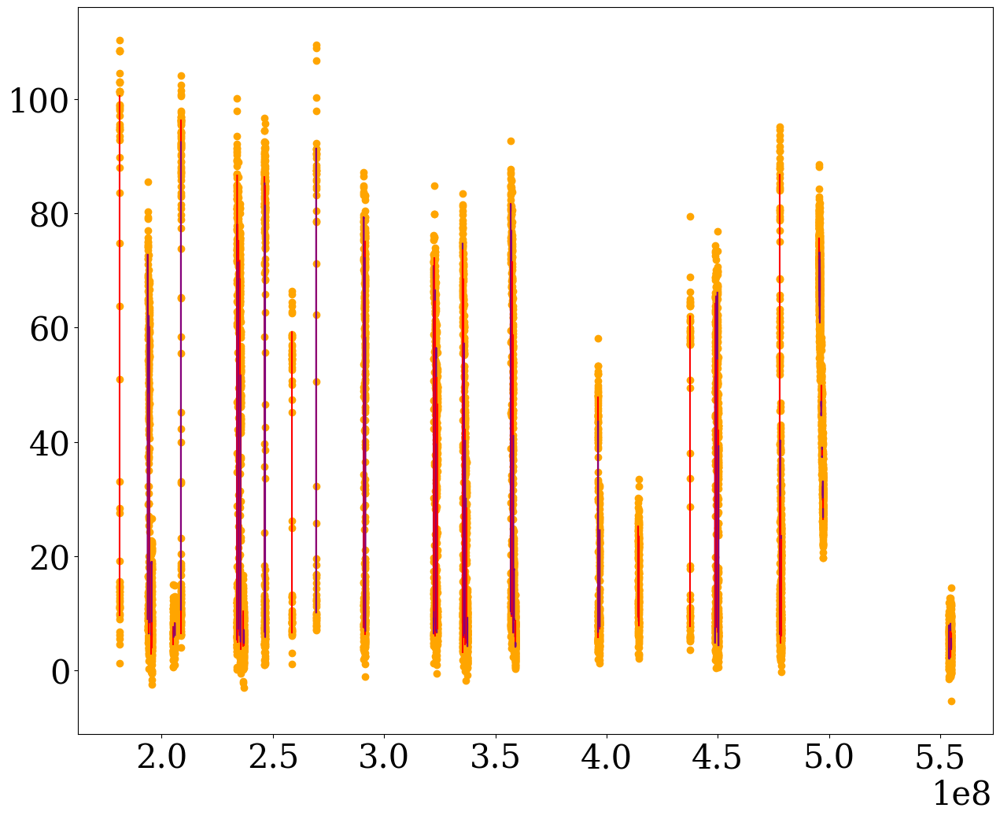

In [25]:
# sort the obsids by time
# plot chronologically
times_and_names.sort(key=lambda a: a[1])
sorted_lcs_list = [i[0] for i in times_and_names]
RXTE_analysis(sorted_lcs_list,False,True)

In [26]:
sorted_lcs_list

['/Users/caleb/Downloads/GRS_lc_files/30427-01-01-00.lc',
 '/Users/caleb/Downloads/GRS_lc_files/40419-01-01-00.lc',
 '/Users/caleb/Downloads/GRS_lc_files/40419-01-02-00.lc',
 '/Users/caleb/Downloads/GRS_lc_files/40419-01-02-01.lc',
 '/Users/caleb/Downloads/GRS_lc_files/40419-01-03-00.lc',
 '/Users/caleb/Downloads/GRS_lc_files/40419-01-04-00.lc',
 '/Users/caleb/Downloads/GRS_lc_files/50034-01-01-00.lc',
 '/Users/caleb/Downloads/GRS_lc_files/50034-01-01-01.lc',
 '/Users/caleb/Downloads/GRS_lc_files/50034-01-01-03.lc',
 '/Users/caleb/Downloads/GRS_lc_files/50034-01-01-04.lc',
 '/Users/caleb/Downloads/GRS_lc_files/50034-01-01-05.lc',
 '/Users/caleb/Downloads/GRS_lc_files/50034-01-01-06.lc',
 '/Users/caleb/Downloads/GRS_lc_files/50034-01-01-02.lc',
 '/Users/caleb/Downloads/GRS_lc_files/50034-01-02-00.lc',
 '/Users/caleb/Downloads/GRS_lc_files/50034-01-02-02.lc',
 '/Users/caleb/Downloads/GRS_lc_files/50034-01-02-03.lc',
 '/Users/caleb/Downloads/GRS_lc_files/50034-01-02-04.lc',
 '/Users/caleb

In [27]:
featured = []
eclipses = [i[2] for i in all_info]
for i in sorted_lcs_list:
    if '91045' in i:
        if i in eclipses:
            featured.append(i)
        
#91045, 60038[0:-3]

In [28]:
featured

['/Users/caleb/Downloads/GRS_lc_files/91045-02-01-00.lc',
 '/Users/caleb/Downloads/GRS_lc_files/91045-02-01-01.lc',
 '/Users/caleb/Downloads/GRS_lc_files/91045-02-01-02.lc',
 '/Users/caleb/Downloads/GRS_lc_files/91045-02-01-03.lc',
 '/Users/caleb/Downloads/GRS_lc_files/91045-02-01-11.lc',
 '/Users/caleb/Downloads/GRS_lc_files/91045-02-01-10.lc',
 '/Users/caleb/Downloads/GRS_lc_files/91045-02-01-21.lc',
 '/Users/caleb/Downloads/GRS_lc_files/91045-02-01-22.lc',
 '/Users/caleb/Downloads/GRS_lc_files/91045-02-01-20.lc',
 '/Users/caleb/Downloads/GRS_lc_files/91045-02-01-31.lc',
 '/Users/caleb/Downloads/GRS_lc_files/91045-02-01-32.lc',
 '/Users/caleb/Downloads/GRS_lc_files/91045-02-01-30.lc']

In [29]:
featured_trimmed = [featured[0]] + featured[3:5] + featured[7:10] + [featured[-1]]

In [106]:
def paper_plotter(lcs):
    
    fontsize =40
    fig, axs = plt.subplots(len(lcs),figsize=(15, 2*len(lcs)))

    plt.rcParams.update({
                'font.sans-serif': 'Times New Roman',
                'font.family': 'serif',
                })



    for lc_number,name in enumerate(lcs):
#         print(name)
        new_file = fits.open(name)
        tab = table.Table(new_file[1].data) 
        time = tab["TIME"].tolist()
        rate = tab["RATE"].tolist()
        errors = tab["ERROR"].tolist()

        start_time = time[0]
        end_time = time[-1]
        
                
        for row, i in enumerate(rate):
            if i < 0:
                rate.remove(i)
                time = time[0:row] + time[row+1:]
                
        max = 1000
        for i in range(0,len(time)):
            if rate[i] > max:
                rate[i] = max
                


#         'dip checking'a
#       cleaning
        rate = [x for x in rate if str(x) != 'nan']
        removed_times = []
        removed_errors = []
        for i in range(0,len(rate)):
            if str(rate[i]) != 'nan': 
                removed_times.append(time[i])
                removed_errors.append(errors[i])
        time = removed_times
        time = np.array(time)
        time -= min(time)
        time -= 320

        if "60038-01-04-03" in name:
            length = len(time)
            time = time[int(np.ceil(.7*length)):]
            rate = rate[int(np.ceil(.7*length)):]

    
        avg = np.mean(rate)
#         print("AVG:",avg)
#         print(min(rate))
#         print(np.std(rate))
#         dipping = False
#         for i in range(0,len(rate)):
#             try:
#                 if rate[i] < (.7*avg):
#                     dipping = True 
#             except:
#                 pass
#         if dipping == True:
#             flagged_dips.append(name)

#         axs[lc_number].rcParams["figure.figsize"] = (20,4)

        pd_rate = pd.DataFrame(rate)
        window = 4
        rate_rolling_average = pd_rate.rolling(window=window+1).mean()
        rate_rolling_average = rate_rolling_average.values.tolist()
        axs[lc_number].plot(time[window:-window],rate_rolling_average[window:-window],color='black')

        errs = []
        for i in rate:
            errs.append(np.sqrt(i))
        axs[lc_number].scatter(time,rate,color='purple',s=25)
        axs[lc_number].errorbar(time,rate,
                yerr = removed_errors,
                xerr = None,
                fmt ='.',
                color = "black",
                linewidth = .5,
                capsize = 1)

        
        if "91045-02-01-20" in name:
            axs[lc_number].set_ylim(0,30)
        
        if lc_number == 6:
            axs[lc_number].tick_params(axis='x', which='major', labelsize=fontsize, length=10, direction='inout')
            axs[lc_number].set_xlabel("Time [s]",size=fontsize)
        else:
            axs[lc_number].tick_params(axis='x', which='major', labelsize=0)
            axs[lc_number].tick_params(bottom = False)


        axs[lc_number].tick_params(axis='y', which='major', labelsize=fontsize)
        axs[lc_number].tick_params(axis='both',which='minor', direction='inout', width=0.75, length=7)

        ax2 = axs[lc_number].twinx()



        # check for ingress/egress
            
        # convert starting and ending time to MJD
        start_time_MJD = 49353.00003909 + start_time*(1/86400)
        end_time_MJD = 49353.00003909 + end_time*(1/86400)
#         ax2.set_ylabel(f"MJD\n {np.round(start_time_MJD,5)}",rotation=0,size=15,labelpad=55)
        ax2.set_yticks([])

        #determing n-values for start and end ingress
        start_n_ingress = ((start_time_MJD)-52066.259473)/0.514980303
        end_n_ingress = ((end_time_MJD)-52066.259473)/0.514980303

        #determing n-values for start and end ingress
        start_n_egress = ((start_time_MJD)-52066.289497)/0.514980303
        end_n_egress = ((end_time_MJD)-52066.289497)/0.514980303

        
        ingress_different = (math.floor(start_n_ingress) != math.floor(end_n_ingress))
        egress_different = (math.floor(start_n_egress) != math.floor(end_n_egress))

        
        ingress_error = 60.184
        egress_error = 60.184
        
        true_n_ingress = (52066.259473 + 0.514980311*math.floor(end_n_ingress)-49353.00003909)*86400-60.184
        true_n_egress = (52066.289497 + 0.514980275*math.floor(end_n_egress)-49353.00003909)*86400-60.184 

        if ingress_different:
            print(52066.259473 + 0.514980311*math.floor(end_n_ingress))
            print(true_n_ingress)
            axs[lc_number].axvline(x = true_n_ingress - start_time, color = 'green', linestyle = 'dashed', label = 'Predicted Ingress')
        if egress_different:
            print('true',true_n_egress)
            axs[lc_number].axvline(x = true_n_egress - start_time -320, color = 'red', linestyle = 'dashed', label = 'Predicted Egress')
            axs[lc_number].set_xlim(true_n_egress-start_time-100-310,true_n_egress-start_time+100-310)

#         plt.legend()
#         plt.xlim(5500,6000)
    plt.subplots_adjust(hspace=.3)

    plt.minorticks_on()

    fig.supylabel(r"Net Rate [ct s$^{-1}$]",size=fontsize)
    plt.savefig("disspearing_rxte")
    plt.show()

true 356920945.2067038
true 357232405.27702373
53490.695013225995
357496785.5813498
true 357499371.0515835
true 358122291.1922234
53501.509599756995
358431165.85762817
true 358433751.2625434
true 358878694.22014385
true 359056671.40318334


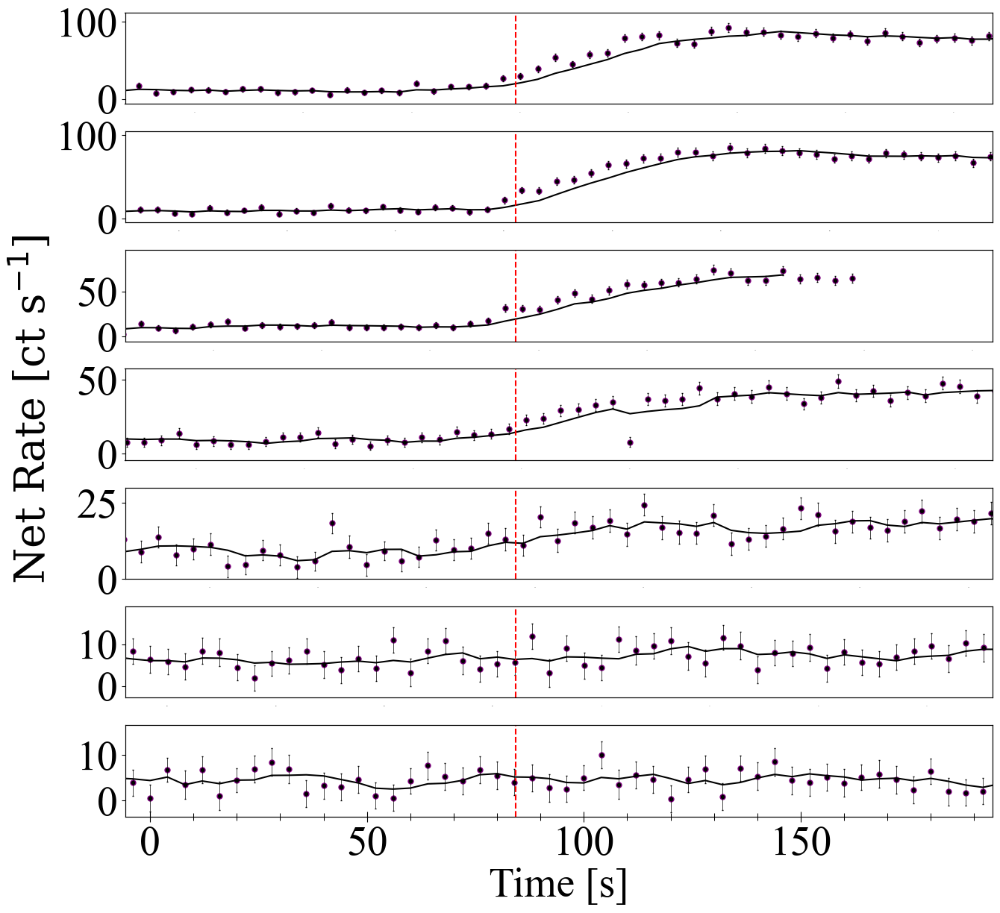

In [107]:
paper_plotter(featured_trimmed)

In [27]:
flagged_dips

['/Users/caleb/Downloads/GRS_lc_files/80045-02-04-05.lc',
 '/Users/caleb/Downloads/GRS_lc_files/60038-01-02-00.lc',
 '/Users/caleb/Downloads/GRS_lc_files/50034-01-01-06.lc',
 '/Users/caleb/Downloads/GRS_lc_files/60038-01-02-01.lc',
 '/Users/caleb/Downloads/GRS_lc_files/50034-01-07-01.lc',
 '/Users/caleb/Downloads/GRS_lc_files/50034-01-01-01.lc']

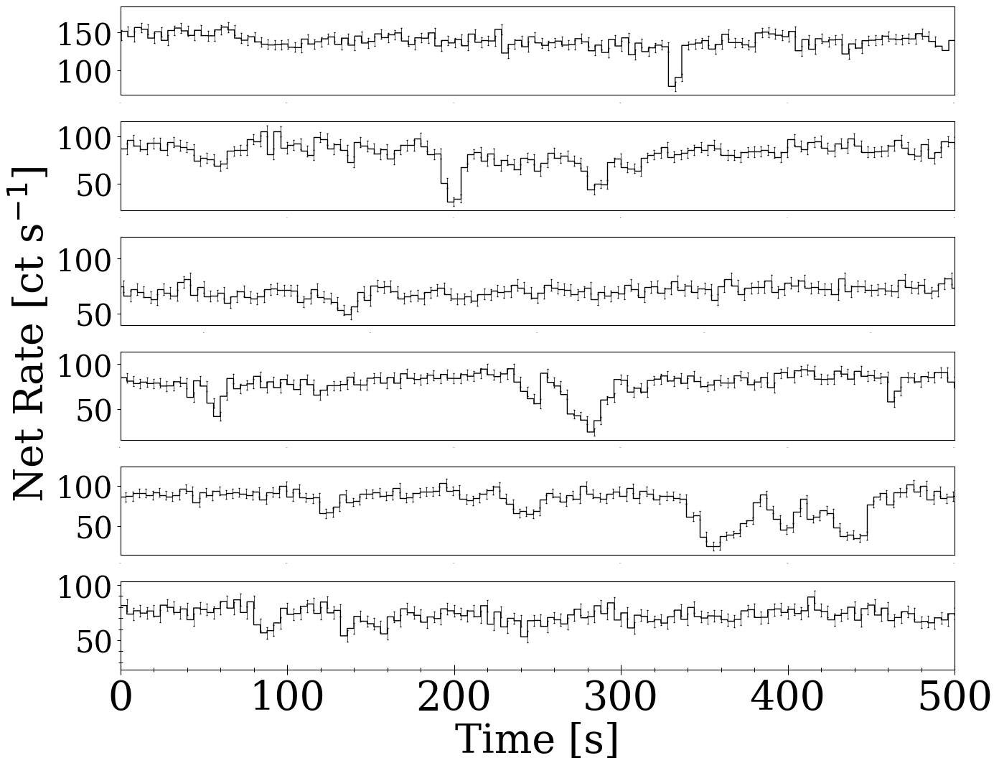

In [48]:
paper_plotter_dips(flagged_dips)

In [47]:
def paper_plotter_dips(lcs):
    
    
    # fig, axs = plt.subplots(len(lcs),figsize=(15, 12))
    plt.rcParams["figure.figsize"] = (15,12)
    fig,axs= plt.subplots(len(lcs),1)

    for lc_number,name in enumerate(lcs):
#         print(name)
        new_file = fits.open(name)
        tab = table.Table(new_file[1].data) 
        time = tab["TIME"].tolist()
        rate = tab["RATE"].tolist()
        errors = tab["ERROR"].tolist()

        start_time = time[0]
        end_time = time[-1]
        
                
        for row, i in enumerate(rate):
            if i < 0:
                rate.remove(i)
                time = time[0:row] + time[row+1:]
                
        max = 1000
        for i in range(0,len(time)):
            if rate[i] > max:
                rate[i] = max
                


#         'dip checking'a
#       cleaning
        rate = [x for x in rate if str(x) != 'nan']
        removed_times = []
        removed_errors = []
        for i in range(0,len(rate)):
            if str(rate[i]) != 'nan': 
                removed_times.append(time[i])
                removed_errors.append(errors[i])
        time = removed_times
        time = np.array(time)
        time -= min(time)
        
        if "50034-01-01-01.lc" in name:
            time -= 500


        

        if "80045-02-04-05.lc" in name:
            axs[lc_number].set_xlim(5500,6000)
        if "60038-01-02-00.lc" in name:
            axs[lc_number].set_xlim(100,600)
        if "50034-01-01-06.lc" in name:
            axs[lc_number].set_xlim(750,1250)
            axs[lc_number].set_ylim(40,120)

        if "60038-01-02-01.lc" in name:
            axs[lc_number].set_xlim(900,1400)
        if "50034-01-07-01.lc" in name:
            axs[lc_number].set_xlim(8400,8900)
        if "50034-01-01-01.lc" in name:
            axs[lc_number].set_xlim(0,500)
            
        
            
        if "60038-01-04-03" in name:
            length = len(time)
            time = time[int(np.ceil(.7*length)):]
            rate = rate[int(np.ceil(.7*length)):]

    
        avg = np.mean(rate)
#         print("AVG:",avg)
#         print(min(rate))
#         print(np.std(rate))
#         dipping = False
#         for i in range(0,len(rate)):
#             try:
#                 if rate[i] < (.7*avg):
#                     dipping = True 
#             except:
#                 pass
#         if dipping == True:
#             flagged_dips.append(name)

#         axs[lc_number].rcParams["figure.figsize"] = (20,4)

        pd_rate = pd.DataFrame(rate)
        window = 4
        rate_rolling_average = pd_rate.rolling(window=window+1).mean()
        rate_rolling_average = rate_rolling_average.values.tolist()
#         axs[lc_number].plot(time[window:-window],rate_rolling_average[window:-window],color='black')

        errs = []
        for i in rate:
            errs.append(np.sqrt(i))
        axs[lc_number].step([i - time[0] for i in time],rate,color='black',linewidth=1)
        axs[lc_number].errorbar([i - time[0] for i in time],rate,
                yerr = removed_errors,
                xerr = None,
                fmt = 'none',
                color = "black",
                linewidth = .5,
                capsize = 1)
        
        textsize = 40

        # axs[lc_number].set_ylabel(r"Net Rate [ct s$^{-1}$]",size=30)

        axs[lc_number].tick_params(axis='x', which='major', labelsize=0)
        axs[lc_number].tick_params(axis='y', which='major', labelsize=textsize-10)

            
        if "50034-01-01-01.lc" in name:
            axs[lc_number].tick_params(axis='x', which='both', direction='inout',length=10, labelsize=textsize)
        else:
            axs[lc_number].tick_params(axis='x', which='major', labelsize=0)
            axs[lc_number].tick_params(bottom = False)

        axs[lc_number].tick_params(axis='both',which='minor', direction='inout', width=0.75, length=5)




        # check for ingress/egress
            
        # convert starting and ending time to MJD
        start_time_MJD = 49353.00003909 + start_time*(1/86400)
        end_time_MJD = 49353.00003909 + end_time*(1/86400)
#             ax2 = axs[lc_number].twinx()

#         ax2.set_ylabel(f"MJD\n {np.round(start_time_MJD,5)}",rotation=0,size=15,labelpad=55)
#         ax2.set_yticks([])

        #determing n-values for start and end ingress
        start_n_ingress = ((start_time_MJD)-52066.259473)/0.514980303
        end_n_ingress = ((end_time_MJD)-52066.259473)/0.514980303

        #determing n-values for start and end ingress
        start_n_egress = ((start_time_MJD)-52066.289497)/0.514980303
        end_n_egress = ((end_time_MJD)-52066.289497)/0.514980303

        
        ingress_different = (math.floor(start_n_ingress) != math.floor(end_n_ingress))
        egress_different = (math.floor(start_n_egress) != math.floor(end_n_egress))

        
        ingress_error = 60.184
        egress_error = 60.184
        
        true_n_ingress = (52066.259473 + 0.514980311*math.floor(end_n_ingress)-49353.00003909)*86400-60.184
        true_n_egress = (52066.289497 + 0.514980275*math.floor(end_n_egress)-49353.00003909)*86400-60.184 

#         if ingress_different:
#             print(52066.259473 + 0.514980311*math.floor(end_n_ingress))
#             print(true_n_ingress)
#             axs[lc_number].axvline(x = true_n_ingress - start_time, color = 'green', linestyle = 'dashed', label = 'Predicted Ingress')
#         if egress_different:
#             print('true',true_n_egress)
#             axs[lc_number].axvline(x = true_n_egress - start_time, color = 'red', linestyle = 'dashed', label = 'Predicted Egress')
#             axs[lc_number].set_xlim(true_n_egress-start_time-100,true_n_egress-start_time+100)
        
#         plt.legend()
#         plt.xlim(5500,6000
    fig.supylabel(r"Net Rate [ct s$^{-1}$]",size=textsize)
    axs[5].set_xlabel("Time [s]",size=textsize)

    plt.subplots_adjust(hspace=.3)

    plt.minorticks_on()
    plt.savefig("rxte_all_dips")
#     plt.show()

In [21]:
new_file = fits.open('/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/60038-01-03-01.lc')
tab = table.Table(new_file[1].data) 


In [22]:
tab

TIME,RATE,ERROR,FRACEXP
float64,float32,float32,float32
234425069.95598444,71.48294,5.197758,1.0
234425073.95615026,69.48294,5.149436,1.0
234425077.9563161,66.98294,5.0883875,1.0
234425081.9564821,93.47757,5.70237,1.0
234425085.9566481,79.22757,5.380941,1.0
234425089.95681417,79.47757,5.3867455,1.0
234425093.95698035,79.47757,5.3867455,1.0
234425097.95714653,82.58748,5.462443,1.0
234425101.95731282,83.58748,5.4852786,1.0


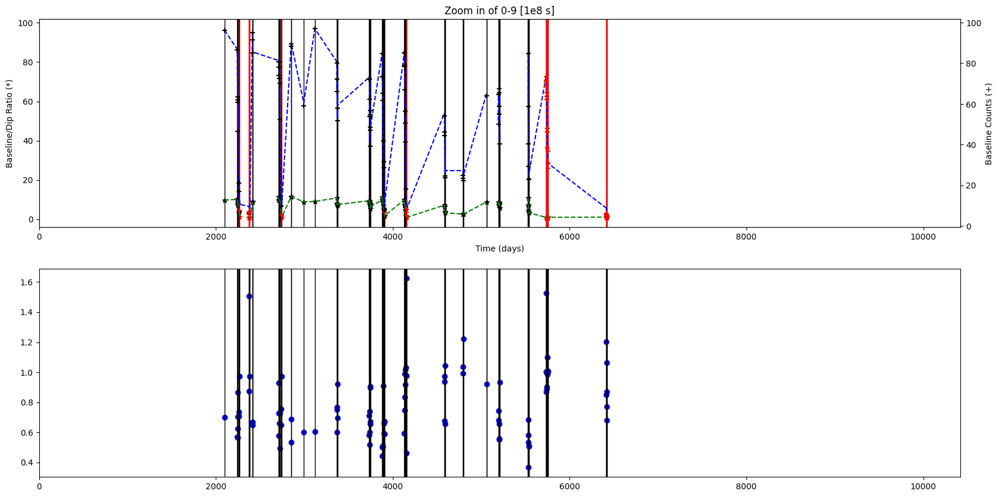

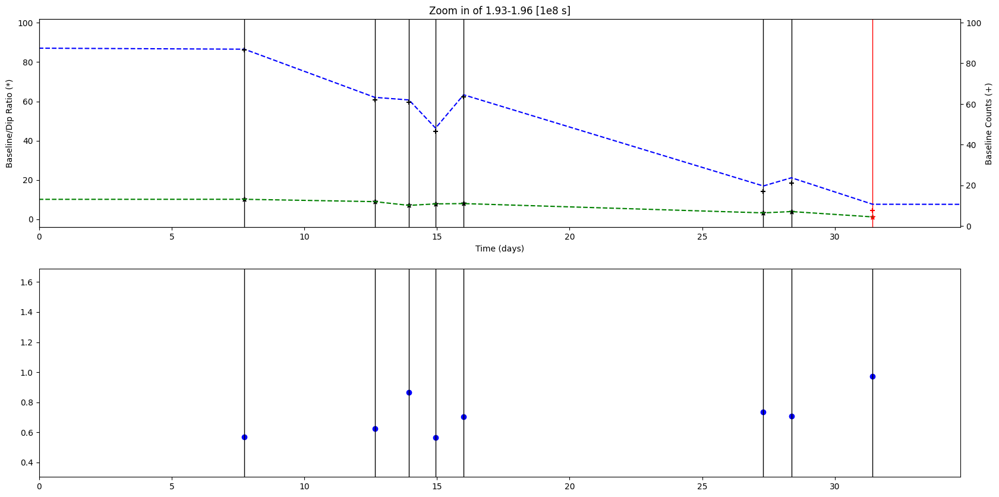

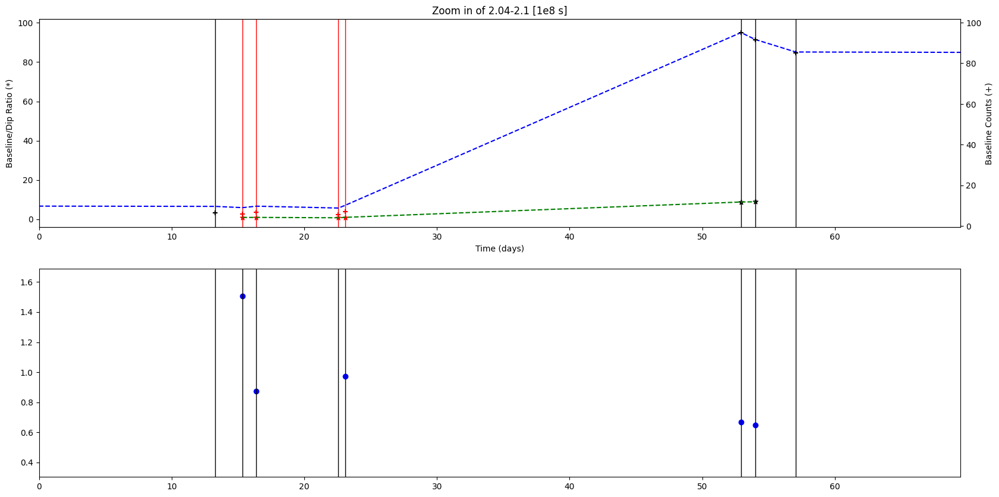

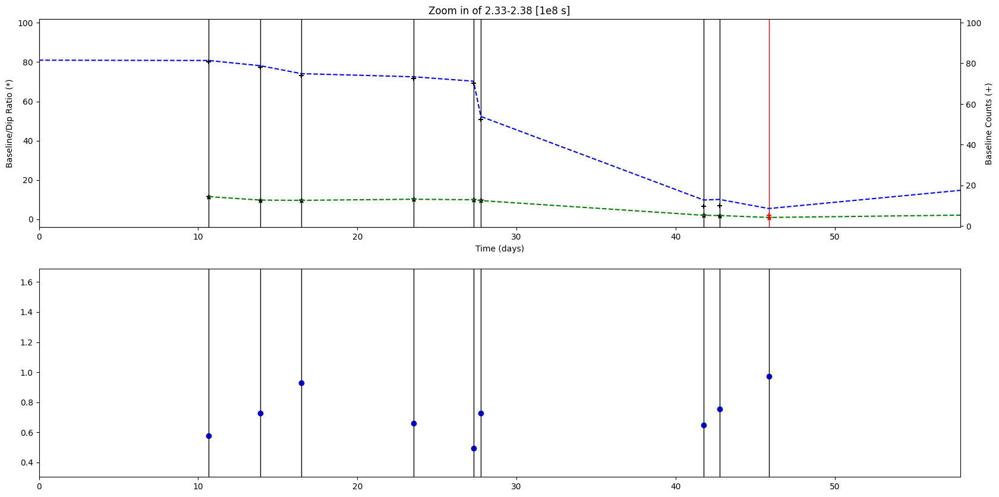

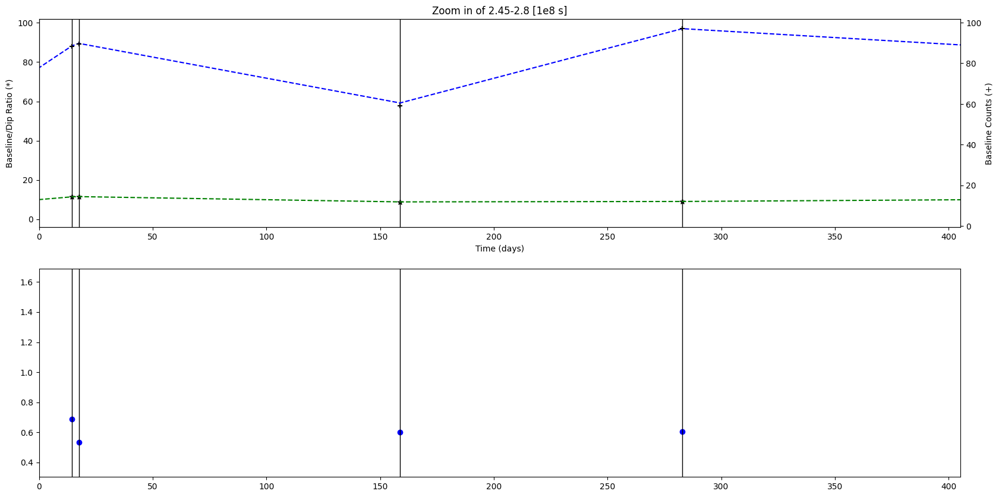

...

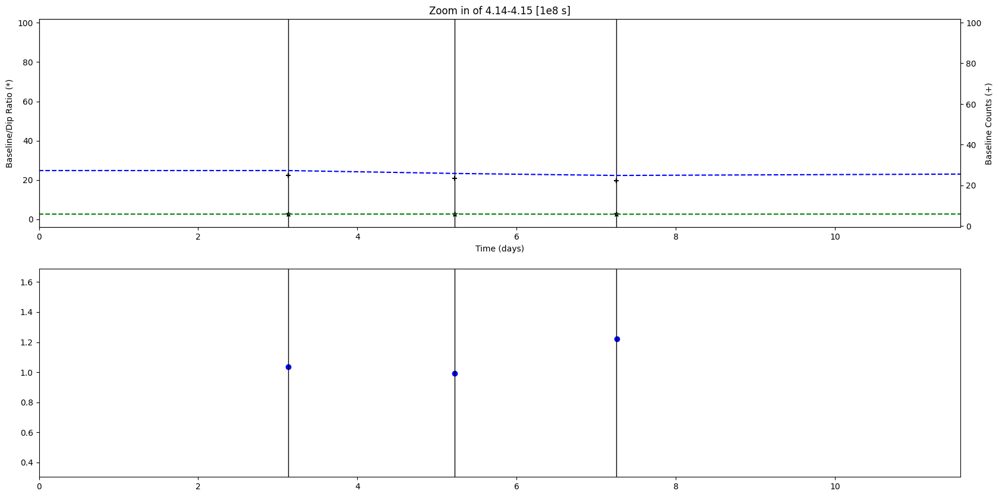

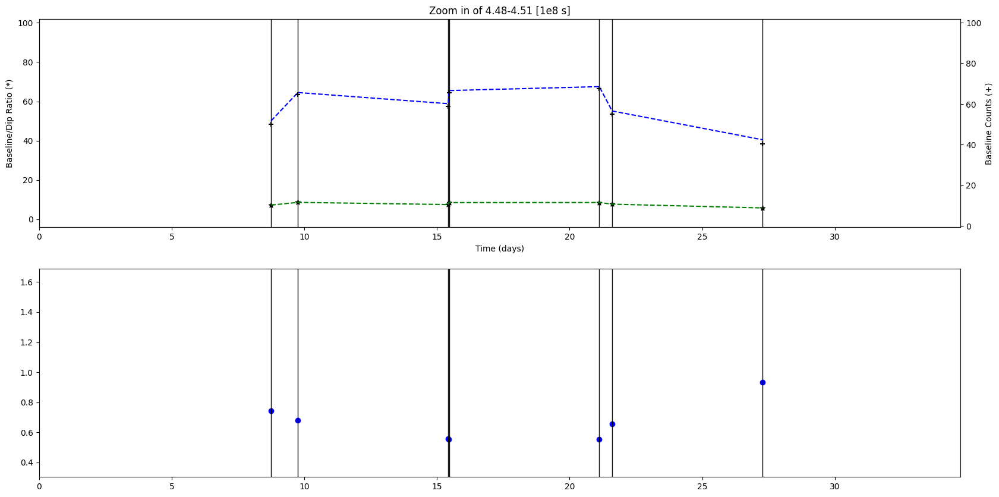

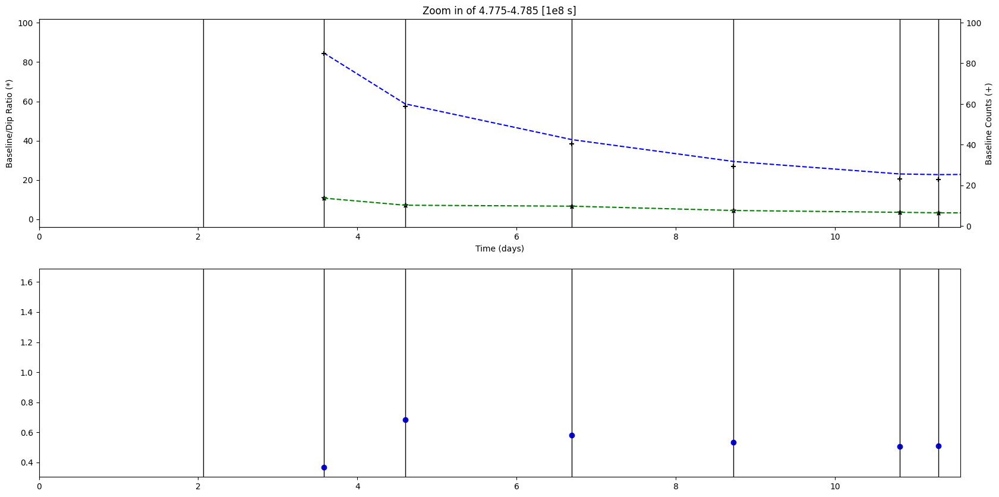

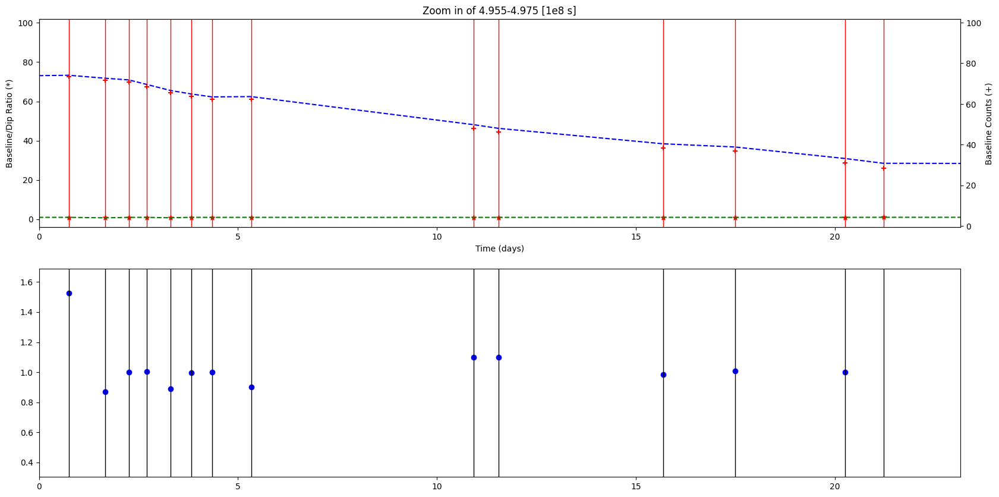

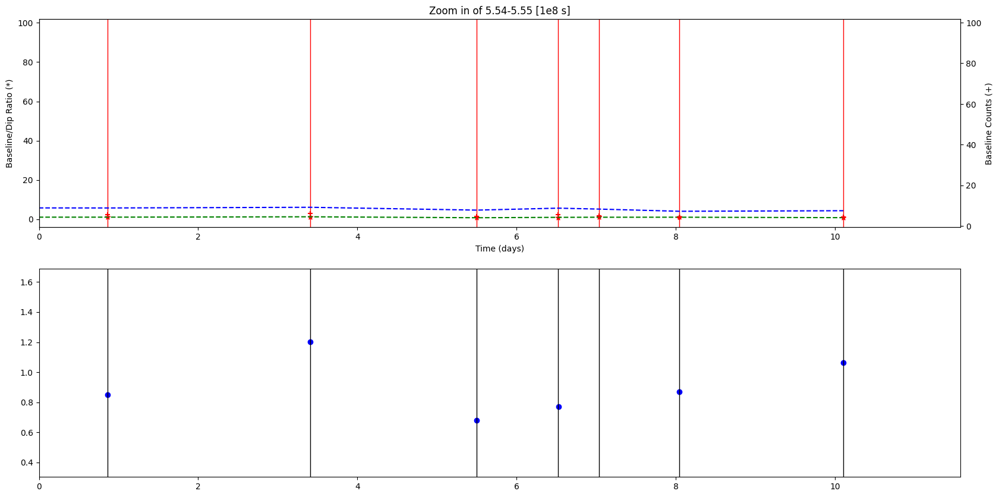

In [26]:
# Hardness Ratio Analysis
from mpl_toolkits.mplot3d.axes3d import axis3d
def timing(start,end):
    
  #first we need to sort all_info
  all_info.sort(key=lambda a: a[3])


  plt.rcParams["figure.figsize"] = (20,10)
  fig, (ax1,ax3) = plt.subplots(2,1)
  ax1.set_title(f'Zoom in of {start}-{end} [1e8 s]')

  # for i in all_info: 
  #   if (i[1]/i[0]) > .8:
  #     plt.scatter(i[1],i[0])
  # plt.show()
  ax2 = ax1.twinx() 

  start = start*10**8
  end = end*10**8
  times = []

  

  all_baselines = [i[0] for i in all_info]
    
  all_dips = [i[1] for i in all_info]

  
  all_ratios = np.array(all_baselines)/np.array(all_dips)

  all_times = np.array([i[3] for i in all_info]) 
  all_times = (all_times - start)/86400

  for i in all_info: 
    time = i[3]
    time -= start 
    

    # convert to days

    time = time/86400

    times.append(time)


    if (i[1]/i[0]) > .7:
      ax1.scatter(time,i[0]/i[1],color='red',marker='*')
      ax1.axvline(x=time,color='red',linewidth=1)
      ax2.scatter(time,i[0],color='red',marker='+')
      ax3.axvline(x=time,color='black',linewidth=1)

    else:
      ax1.scatter(time,i[0]/i[1],color='black',marker='*')
      ax1.axvline(x=time,color='black',linewidth=1)
      ax2.scatter(time,i[0],color='black',marker='+')
      ax3.axvline(x=time,color='black',linewidth=1)
        
  ax1.plot(all_times, all_baselines, color='blue',linestyle='dashed')
  ax1.plot(all_times, all_ratios, color='green',linestyle='dashed')

  ax2.set_ylabel("Baseline Counts (+)")
  ax1.set_ylabel("Baseline/Dip Ratio (*)")
  ax1.set_xlabel("Time (days)")


  # chandra observations  
  # plt.scatter(861568433.593,1,color='blue',marker='*')
  # plt.scatter(872331649.181,1,color='blue',marker='*')
  # #suzaku:
  # plt.scatter(495703503.678,1,color='blue',marker='*')
  

  baseline_hrs = np.array([i[1] for i in hr_info])
  dip_hrs = np.array([i[2] for i in hr_info])

  baseline_dip_ratios = baseline_hrs/dip_hrs
  times_hrs = np.array([i[3] for i in hr_info])
  times_hrs = (times_hrs - start)/86400



  ax3.scatter(times_hrs,baseline_dip_ratios,color='blue')
  ax3.set_xlim(0,(end-start)/86400)


  ax1.set_xlim(0,(end-start)/86400)



  plt.show()


timing(0,9)

pairings = [(1.93,1.96), (2.04,2.1),(2.33,2.38),(2.45,2.8),(2.905,2.92),(3.2,3.25),(3.35,3.38), (3.565,3.595), (3.96,3.98), (4.14,4.15), (4.48,4.51), (4.775,4.785), (4.955,4.975),(5.54,5.55)]

for i in pairings:
  timing(i[0],i[1])

In [41]:
import statsmodels.api as sm


bad -21.875785052776337
-4.997828900814056 1.4000003337860107 1.5000003576278687 2.475362748103211
-5.752026319503784 1.7000004053115845 1.6000003814697266 2.075151048859756
0.9265073835849762 1.0999999344348907 1.0999999344348907 2.9572591135742474
-8.80383425951004 1.9000004529953003 1.9000004529953003 3.359031767018296
-2.660926878452301 1.899999886751175 1.899999886751175 3.8274946929792044
-2.9901847541332245 1.0999999344348907 1.0999999344348907 3.3191487175661467
-4.4003466963768005 2.000000476837158 2.000000476837158 2.9160875900135226
-13.236746788024902 1.9000004529953003 1.8000004291534424 2.230436840164457
-0.4118817448616028 1.4999999105930328 1.5999999046325684 3.1992651692012553
-3.8872039914131165 2.1999998688697815 2.1999998688697815 2.3405427156605305
-4.1480934619903564 0.8000001907348633 0.8000001907348633 2.865269612205569
-2.476495921611786 1.5000003576278687 1.6000003814697266 2.3769759501418197
-6.044561743736267 1.200000286102295 1.100000262260437 3.15513559686

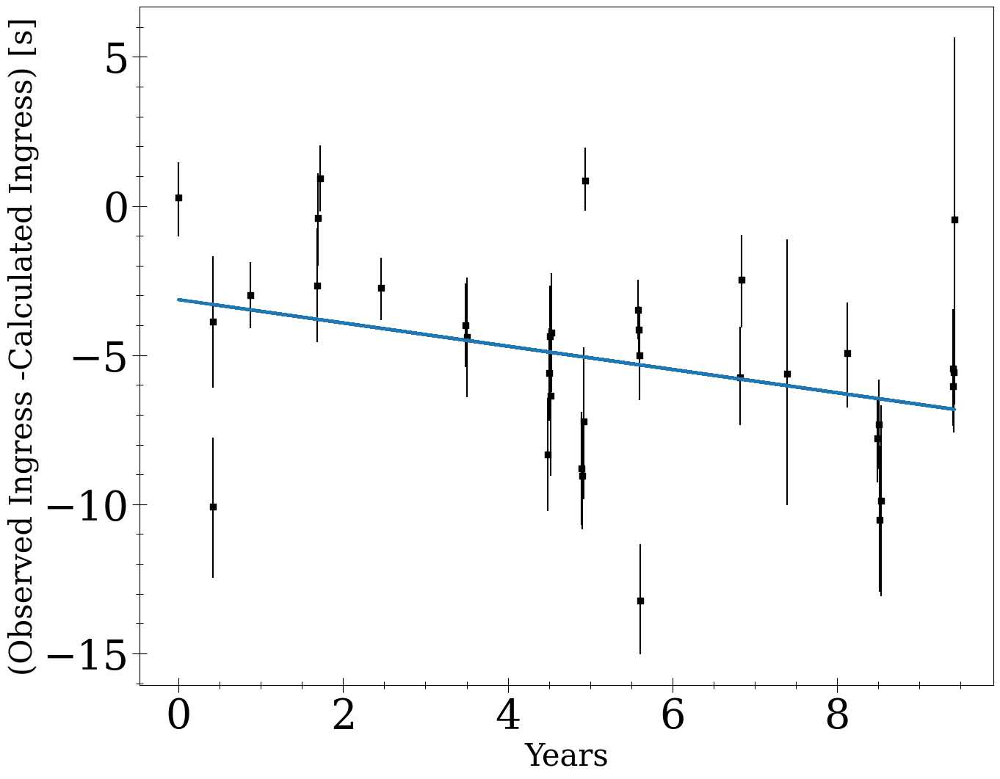

In [62]:
# O-C 
fig, ax = plt.subplots(figsize = (15, 12))
times = ingress_times


predicted_times = np.array([x[0] for x in times])

predicted_times = np.array(predicted_times)
predicted_times = predicted_times - min(predicted_times)
predicted_times = predicted_times/31536000


calculated_diff =np.array([x[1] for x in times])
calculated_error_plus = np.array([(x[2]) for x in times])
rate_errs = np.array([(x[4]) for x in times])
mjds = np.array([(x[5]) for x in times])
n = np.array([(x[6]) for x in times])


calculated_error_mins = np.array([(x[3]) for x in times])



plus = abs(calculated_error_plus - calculated_diff)
minus = abs(calculated_error_mins - calculated_diff)


mids = []
mins = []
pls = []
tims = []
mjdss = []
ns= []
for i in range(0,len(calculated_error_plus)):
    if plus[i] < 20 and minus[i] < 8:
        mids.append(calculated_diff[i])
        mins.append(minus[i])
        pls.append(plus[i])
        tims.append(predicted_times[i])
        mjdss.append(mjds[i])
        ns.append(n[i])
    else:
        print("bad",calculated_diff[i])


calculated_diff = mids
minus = mins
plus = pls
predicted_times = tims
mjds = mjdss


oc_info = pd.DataFrame(columns=["MJD","Orbit Number","Lower Error","Upper Error","Deviation"])

for i in range(0,len(plus)):
    print(calculated_diff[i],plus[i],minus[i],rate_errs[i])
    oc_info.loc[len(oc_info.index)] = [mjds[i],int(np.round(ns[i])),f"{np.round(minus[i],2)}"+"s",f"{np.round(plus[i],2)}"+"s",f"{np.round(calculated_diff[i],2)}"+"s"]

    
ns = [int(np.round(x)) for x in ns]
ns.sort()
print(ns)
oc_info = oc_info.sort_values('Orbit Number')

# plus = [abs(x) for x in plus]

calculated_errors = np.column_stack((minus,plus))
calculated_errors_new = np.transpose(calculated_errors)
# print(calculated_errors_new)

ax.scatter(predicted_times,calculated_diff,marker='s',color='black',s=40)
# print(calculated_errors)

ax.errorbar(predicted_times,calculated_diff,yerr=calculated_errors_new,fmt="None",color='black')

ax.set_xlabel("Years")
ax.set_ylabel("(Observed Ingress -Calculated Ingress) [s]")
 



x= predicted_times
y = calculated_diff
y = np.array(y)

#define predictor and response variables

#add constant to predictor variables
x = sm.add_constant(x)

#fit linear regression model
model = sm.OLS(y, x).fit()

#view model summary
print(model.summary())
a, b = np.polyfit(predicted_times, y, 1)
print(a,b)

predicted_times = np.array(predicted_times)
plt.plot(predicted_times, a*predicted_times+b,linewidth=3)


plt.tick_params(axis='both', which='both', labelsize=size,direction='inout',length=15)
plt.tick_params(which='minor', width=0.75, length=7)
plt.minorticks_on()

plt.show()

In [370]:
print(oc_info.to_latex(index=False,
                  formatters={"name": str.upper},
                  float_format="{:.5f}".format,
))  

\begin{tabular}{rrlll}
\toprule
MJD & Orbit Number & Lower Error & Upper Error & Deviation \\
\midrule
51594.56691 & -916 & 1.9s & 1.8s & -4.6s \\
51600.74667 & -904 & 4.1s & 4.1s & 3.3s \\
51602.80659 & -900 & 3.4s & 3.3s & 3.21s \\
51615.16612 & -876 & 3.7s & 3.7s & 1.02s \\
51768.11526 & -579 & 1.3s & 1.4s & -4.45s \\
52066.28884 & 0 & 3.3s & 3.3s & 0.97s \\
52471.57832 & 787 & 1.5s & 1.5s & -3.46s \\
52719.79881 & 1269 & 2.1s & 2.0s & 5.93s \\
52728.03849 & 1285 & 3.1s & 3.2s & 4.62s \\
53084.40484 & 1977 & 2.3s & 2.3s & 6.7s \\
53090.58461 & 1989 & 2.1s & 2.1s & -1.09s \\
53093.67449 & 1995 & 2.3s & 2.4s & 7.53s \\
53096.24939 & 2000 & 3.6s & 3.7s & 6.2s \\
53099.85425 & 2007 & 5.1s & 5.2s & 9.37s \\
53233.74912 & 2267 & 2.2s & 2.3s & 3.13s \\
53240.44387 & 2280 & 1.7s & 1.7s & 1.62s \\
53247.13861 & 2293 & 3.0s & 3.0s & 1.79s \\
53251.25845 & 2301 & 5.0s & 5.0s & 7.65s \\
53484.02954 & 2753 & 1.8s & 1.8s & 6.07s \\
53487.63440 & 2760 & 1.6s & 1.6s & 7.09s \\
53497.93400 & 2780 & 

3.3010420501232147 4.099999755620956 4.099999755620956 3.418708356753516
8.320435106754303 3.500000834465027 3.500000834465027 2.597079852436023
6.066803872585297 1.8000004291534424 1.8000004291534424 2.9765169657548554
-1.0915889739990234 2.100000500679016 2.100000500679016 3.1691617999894732
3.1254846453666687 2.300000548362732 2.200000524520874 2.829766534778909
0.9681949615478516 3.2999998033046722 3.2999998033046722 4.107556790854564
6.195109486579895 3.7000008821487427 3.6000008583068848 2.9585845085367586
-4.445384383201599 1.3999999165534973 1.2999999225139618 2.9154188908539567
4.621693789958954 3.200000762939453 3.100000739097595 2.7763680918878078
7.533401250839233 2.40000057220459 2.300000548362732 2.157801888187338
1.617713212966919 1.7000004053115845 1.7000004053115845 2.3986286384196465
8.655865669250488 6.800001621246338 6.800001621246338 2.3084656194174396
6.704247832298279 2.300000548362732 2.300000548362732 2.186255221748051
3.209927052259445 3.2999998033046722 3.399

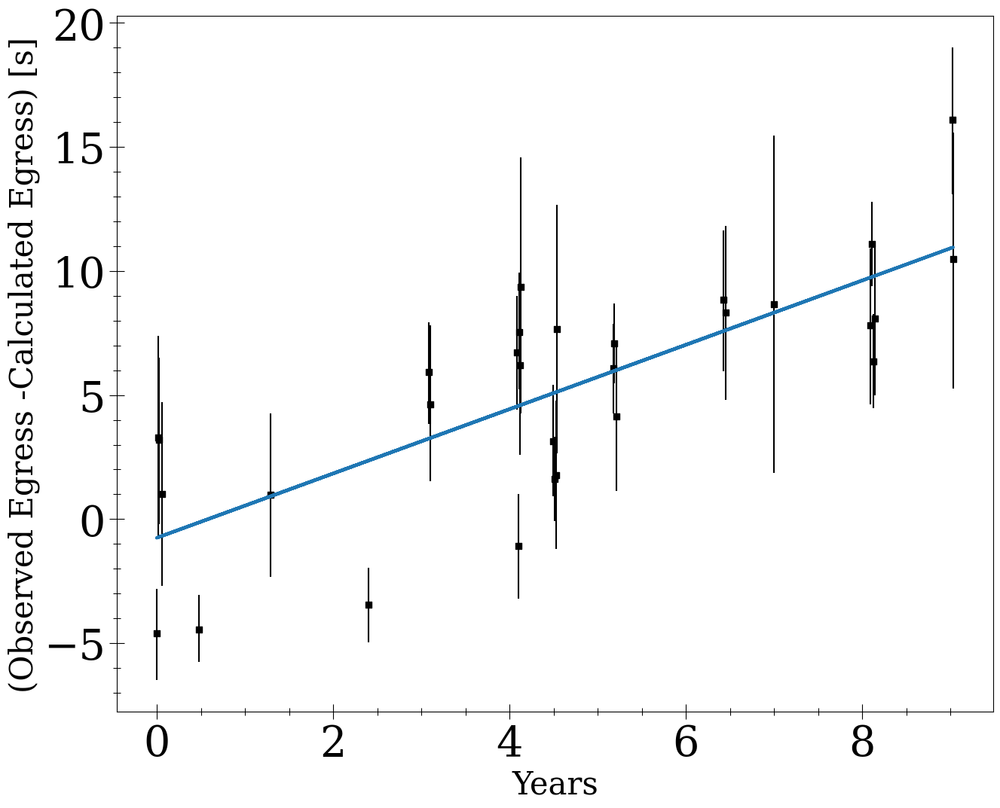

In [61]:
fig, ax = plt.subplots(figsize = (15, 12))

times = egress_times

predicted_times = np.array([x[0] for x in times])


predicted_times = np.array(predicted_times)
predicted_times = predicted_times - min(predicted_times)
predicted_times = predicted_times/31536000


calculated_diff =np.array([x[1] for x in times])
calculated_error_plus = np.array([(x[2]) for x in times])
rate_errs = np.array([(x[4]) for x in times])
mjds = np.array([(x[5]) for x in times])
n = np.array([(x[6]) for x in times])


calculated_error_mins = np.array([(x[3]) for x in times])



plus = abs(calculated_error_plus - calculated_diff)
minus = abs(calculated_error_mins - calculated_diff)


mids = []
mins = []
pls = []
tims = []
mjdss = []
ns= []
for i in range(0,len(calculated_error_plus)):
    if plus[i] < 20 and minus[i] < 8:
        mids.append(calculated_diff[i])
        mins.append(minus[i])
        pls.append(plus[i])
        tims.append(predicted_times[i])
        mjdss.append(mjds[i])
        ns.append(n[i])
    else:
        print("bad",calculated_diff[i])


calculated_diff = mids
minus = mins
plus = pls
predicted_times = tims
mjds = mjdss


oc_info = pd.DataFrame(columns=["MJD","Orbit Number","Lower Error","Upper Error","Deviation"])

for i in range(0,len(plus)):
    print(calculated_diff[i],plus[i],minus[i],rate_errs[i])
    oc_info.loc[len(oc_info.index)] = [mjds[i],int(np.round(ns[i])),f"{np.round(minus[i],2)}"+"s",f"{np.round(plus[i],2)}"+"s",f"{np.round(calculated_diff[i],2)}"+"s"]

    
ns = [int(np.round(x)) for x in ns]
ns.sort()
print(ns)
oc_info = oc_info.sort_values('Orbit Number')

# plus = [abs(x) for x in plus]

calculated_errors = np.column_stack((minus,plus))
calculated_errors_new = np.transpose(calculated_errors)
# print(calculated_errors_new)

ax.scatter(predicted_times,calculated_diff,marker='s',color='black',s=40)
# print(calculated_errors)

ax.errorbar(predicted_times,calculated_diff,yerr=calculated_errors_new,fmt="None",color='black')

ax.set_xlabel("Years")
ax.set_ylabel("(Observed Egress -Calculated Egress) [s]")

x= predicted_times
y = calculated_diff
y = np.array(y)

#define predictor and response variables

#add constant to predictor variables
x = sm.add_constant(x)

#fit linear regression model
model = sm.OLS(y, x).fit()

#view model summary
print(model.summary())
a, b = np.polyfit(predicted_times, y, 1)
print(a,b)

predicted_times = np.array(predicted_times)
plt.plot(predicted_times, a*predicted_times+b,linewidth=3)
plt.tick_params(axis='both', which='both', labelsize=size,direction='inout',length=15)
plt.tick_params(which='minor', width=0.75, length=7)
plt.minorticks_on()

plt.show()

In [371]:
print(oc_info.to_latex(index=False,
                  formatters={"name": str.upper},
                  float_format="{:.5f}".format,))


\begin{tabular}{rrlll}
\toprule
MJD & Orbit Number & Lower Error & Upper Error & Deviation \\
\midrule
51594.56691 & -916 & 1.9s & 1.8s & -4.6s \\
51600.74667 & -904 & 4.1s & 4.1s & 3.3s \\
51602.80659 & -900 & 3.4s & 3.3s & 3.21s \\
51615.16612 & -876 & 3.7s & 3.7s & 1.02s \\
51768.11526 & -579 & 1.3s & 1.4s & -4.45s \\
52066.28884 & 0 & 3.3s & 3.3s & 0.97s \\
52471.57832 & 787 & 1.5s & 1.5s & -3.46s \\
52719.79881 & 1269 & 2.1s & 2.0s & 5.93s \\
52728.03849 & 1285 & 3.1s & 3.2s & 4.62s \\
53084.40484 & 1977 & 2.3s & 2.3s & 6.7s \\
53090.58461 & 1989 & 2.1s & 2.1s & -1.09s \\
53093.67449 & 1995 & 2.3s & 2.4s & 7.53s \\
53096.24939 & 2000 & 3.6s & 3.7s & 6.2s \\
53099.85425 & 2007 & 5.1s & 5.2s & 9.37s \\
53233.74912 & 2267 & 2.2s & 2.3s & 3.13s \\
53240.44387 & 2280 & 1.7s & 1.7s & 1.62s \\
53247.13861 & 2293 & 3.0s & 3.0s & 1.79s \\
53251.25845 & 2301 & 5.0s & 5.0s & 7.65s \\
53484.02954 & 2753 & 1.8s & 1.8s & 6.07s \\
53487.63440 & 2760 & 1.6s & 1.6s & 7.09s \\
53497.93400 & 2780 & 

[4.09999976 3.50000083 1.80000043 2.1000005  2.30000055 3.2999998
 3.70000088 1.39999992 3.20000076 2.40000057 1.70000041 6.80000162
 2.30000055 3.2999998  2.00000048 5.20000124 1.90000045 5.10000122
 1.70000041 1.50000036 3.69999978 5.00000119 1.79999989 2.90000069
 3.00000072 3.00000072 3.10000074 1.60000038 2.80000067 3.10000074]
[4.09999976 3.50000083 1.80000043 2.1000005  2.20000052 3.2999998
 3.60000086 1.29999992 3.10000074 2.30000055 1.70000041 6.80000162
 2.30000055 3.3999998  2.1000005  5.10000122 1.90000045 5.20000124
 1.70000041 1.50000036 3.69999978 5.00000119 1.89999989 3.00000072
 3.00000072 3.00000072 3.10000074 1.60000038 2.90000069 3.20000076]
[[4.09999976 3.50000083 1.80000043 2.1000005  2.20000052 3.2999998
  3.60000086 1.29999992 3.10000074 2.30000055 1.70000041 6.80000162
  2.30000055 3.3999998  2.1000005  5.10000122 1.90000045 5.20000124
  1.70000041 1.50000036 3.69999978 5.00000119 1.89999989 3.00000072
  3.00000072 3.00000072 3.10000074 1.60000038 2.90000069 3.

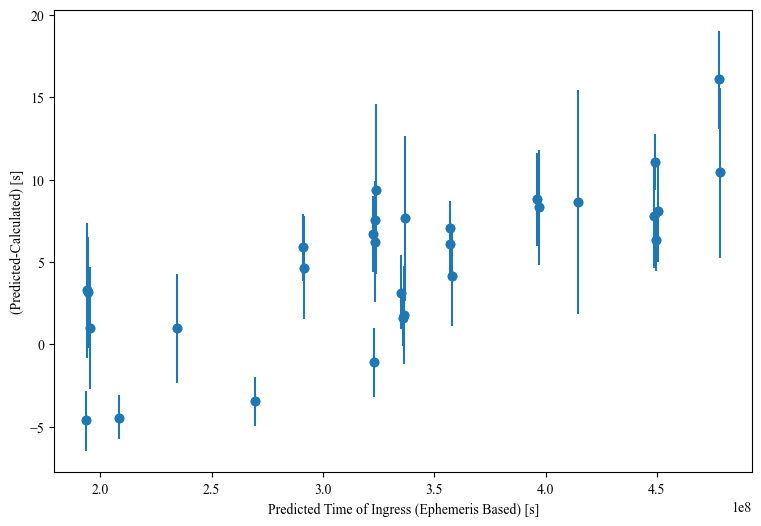

In [365]:
fig, ax = plt.subplots(figsize = (9, 6))
times = egress_times


predicted_times = np.array([x[0] for x in times])
calculated_diff =np.array([x[1] for x in times])
calculated_error_plus = np.array([(x[2]) for x in times])
calculated_error_mins = np.array([(x[3]) for x in times])

for i in range(0,len(calculated_error_plus)):
  if calculated_error_mins[i] > 100:
    calculated_error_mins[i] = calculated_error_plus[i]


# for i in range(0a,len(calculated_error_mins)):
#   if calculated_error_mins[i] > 200:
#     calculated_error_mins[i] = 0


plus = abs(calculated_error_plus - calculated_diff)
minus = abs(calculated_error_mins - calculated_diff)

print(plus)
print(minus)

mids = []
mins = []
pls = []
tims = []

for i in range(0,len(calculated_error_plus)):
    if plus[i] < 20 and minus[i] < 8:
        mids.append(calculated_diff[i])
        mins.append(minus[i])
        pls.append(plus[i])
        tims.append(predicted_times[i])
    else:
        print("bad",calculated_diff[i])


calculated_diff = mids
minus = mins
plus = pls
predicted_times = tims


calculated_errors = np.column_stack((minus, plus))
calculated_errors_new = np.transpose(calculated_errors)
print(calculated_errors_new)

ax.scatter(predicted_times,calculated_diff)

ax.errorbar(predicted_times,calculated_diff,yerr=calculated_errors_new,fmt="o")

ax.set_xlabel("Predicted Time of Ingress (Ephemeris Based) [s]")
ax.set_ylabel("(Predicted-Calculated) [s]")
plt.show()

In [368]:
len(egress_times)

30

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-12.lc


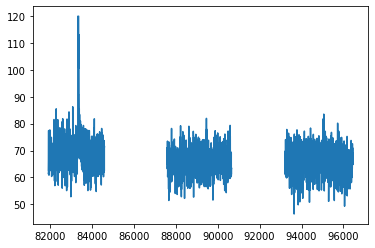

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-13.lc


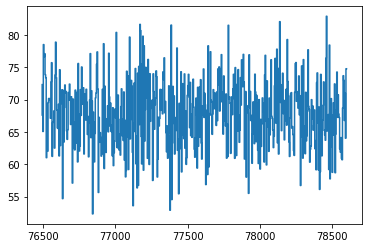

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-08.lc


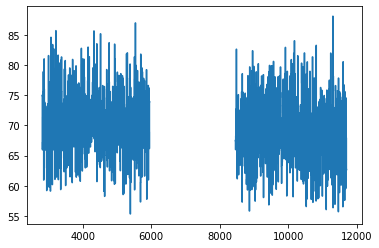

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-09.lc


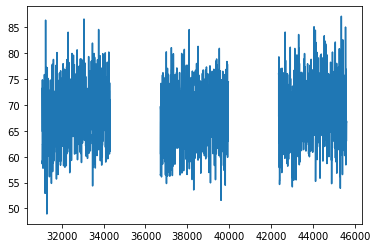

In [14]:
"""# Suzaku Analysis

"""



for i in times_and_names:
  start_time_MJD = 49353.00003909 + i[1]*(1/86400)

  # get the ones during Suzaku
  if start_time_MJD > 55090.30904 and start_time_MJD < 55091.46644741:
    print(i[0])
    single_plot(i[0],120,False,False,495703503.678)



In [10]:
"""# Hardness Ratios

"""
from matplotlib import gridspec


# ingress equation:  52066.259473(5) + 0.514980311(8)n
# egress equation: 52066.289497(10) +0.514980275(15)n
import math

def RXTE_analysis_HR(lcs,plot_yes,timing):
  #keeps track of all baselines for observations with eclipsess
  baselines = []
  # keeps track of all dip rates
  dip_rates = []
  # combines this info with name and start time
  all_info = []
  # keeps track of calculated ingress/egress with uncertainties
  ingress_times = []
  egress_times = []
  # keeps track of which obsids had bursts
  burst_obsids = []
  # keeps track of all times and lc names, for sorting
  times_and_names = []

  #
  hr_info = []
  textsize = 50
    
  all_full_HRS = []
  all_baselines = []
  all_full_HR_errors = []  

  all_times = []
    
  for lc in lcs:
    name = lc
    print(name)



    # channel1

    new_file = fits.open(working_directory+'/GRS_lc_hardness/channel1/'+lc)
    tab = table.Table(new_file[1].data) 
    time1 = np.array(tab["TIME"])
    rate1 = np.array(tab["RATE"])
    start_time = time1[0]
    end_time = time1[-1] + 75


    # channel2
    new_file = fits.open(working_directory+'/GRS_lc_hardness/channel2/'+lc)
    tab = table.Table(new_file[1].data) 
    time2 = np.array(tab["TIME"])
    rate2 = np.array(tab["RATE"])


    # channel3
    new_file = fits.open(working_directory+'/GRS_lc_hardness/channel3/'+lc)
    tab = table.Table(new_file[1].data) 
    time3 = np.array(tab["TIME"])
    rate3 = np.array(tab["RATE"])


    # channel4
    new_file = fits.open(working_directory+'/GRS_lc_hardness/channel4/'+lc)
    tab = table.Table(new_file[1].data) 
    time4 = np.array(tab["TIME"])
    rate4 = np.array(tab["RATE"])

    length = len(time1)

    times_and_names.append((name,start_time))

    # convert starting and ending time to MJD
    start_time_MJD = 49353.00003909 + start_time*(1/86400)
    end_time_MJD = 49353.00003909 + end_time*(1/86400)

    #determing n-values for start and end ingress
    start_n_ingress = ((start_time_MJD)-52066.259473)/0.514980311
    end_n_ingress = ((end_time_MJD)-52066.259473)/0.514980311

    #determing n-values for start and end ingress
    start_n_egress = ((start_time_MJD)-52066.289497)/0.514980275
    end_n_egress = ((end_time_MJD)-52066.289497)/0.514980275


    color = 'white'

    # check how different start and end times are from expected ingress/egress to see if we should expect an eclipse during that observation
    ingress_different = (math.floor(start_n_ingress) != math.floor(end_n_ingress))
    egress_different = (math.floor(start_n_egress) != math.floor(end_n_egress))

    cleaned_rate = [x for x in rate1 if str(x) != 'nan']
    cleaned_rate2 = [x for x in rate2 if str(x) != 'nan']
    cleaned_rate3 = [x for x in rate3 if str(x) != 'nan']
    cleaned_rate4 = [x for x in rate4 if str(x) != 'nan']

    hr_counts_soft = (rate2+rate1)
    hr_counts_hard = (rate4+rate3)

    hr_binned =  np.log((rate2+rate1)/(rate4+rate3))
    hr_binned_errors = []
    for row in range(0,len(hr_counts_hard)):
        soft_num = hr_counts_soft[row]
        hard_num = hr_counts_hard[row]
        error = (1/np.log(10))*np.sqrt(1/soft_num + 1/hard_num)
        hr_binned_errors.append(error)


    hr_binned_times = []
    hr_binned_errors_final = []
    hr_counts_soft_final = []
    hr_counts_hard_final = []

    
    for i in range(0,len(hr_binned)):
        if str(hr_binned[i]) != 'nan': 
            hr_binned_times.append(time1[i])
            hr_binned_errors_final.append(hr_binned_errors[i])
            hr_counts_soft_final.append(hr_counts_soft[i])
            hr_counts_hard_final.append(hr_counts_hard[i])
            
    hr_counts_soft = hr_counts_soft_final
    hr_counts_hard = hr_counts_hard_final

    hr_binned = [x for x in hr_binned if str(x) != 'nan']
    hr_binned_times = hr_binned_times - min(hr_binned_times)
    
    hr_errors = (1/np.log(10))*np.sqrt(1/(rate2+rate1)+1/(rate3+rate4))
    
    
    all_times.append(start_time_MJD)
    if ingress_different or egress_different:


      ## plotting




      if plot_yes == True:
        fig = plt.figure()
        gs = gridspec.GridSpec(2, 1, height_ratios=[1, 1]) 
        plt.rcParams.update({
            'font.sans-serif': 'Times New Roman',
            'font.family': 'sans-serif'
            })
        ax1 = plt.subplot(gs[0])
        ax2 = plt.subplot(gs[1], sharex = ax1)

        plt.rcParams["figure.figsize"] = (25,20)

        color = 'gold'
        # ax1.rcParams["figure.figsize"] = (10,7)
#         fig.patch.set_facecolor(color)
        ax1.set_ylabel("RATE (Counts/s)",size=textsize)
        ax2.set_xlabel("Time (s)",size=textsize)
        ax1.step(time1,rate1,color='red',label='2-4kev')
        ax1.step(time2,rate2,color='orange',label='4-7kev')
        ax1.step(time3,rate3,color='turquoise',label='7-10kev')
        ax1.step(time4,rate4,color='orchid',label='10-20kev')
        ax2.set_ylabel("Hardness Ratio -- Log(S/H)",size=textsize)

        ax2.tick_params(axis='both', which='major', labelsize=textsize)
        ax1.tick_params(axis='both', which='major', labelsize=textsize)
        ax1.legend(fontsize=20)
        ax2.step(hr_binned_times,hr_binned,color='black')


      'Data Cleaning, Rolling Average, and Interpolation'
      # clean the rate list by removing nan values
      # then find the median of the rate list
      med = np.median(cleaned_rate)
      # these are all the times with rates that are not nan
      removed_times = []

      for i in range(0,len(rate1)):
        if str(rate1[i]) != 'nan': 
          removed_times.append(time1[i])

      # make a rolling average of the cleaned rate
      pd_cleaned_rate = pd.DataFrame(cleaned_rate)
      rolling_average = pd_cleaned_rate.rolling(window=4).mean()
      rolling_average = rolling_average.values.tolist()
      # remove first and last three bc they are nan
      rolling_average = rolling_average[3:]
      removed_times = removed_times[3:]
      # convert this pd to list (probably a better way to do this??)
      list_rolling_average = []
      for i in rolling_average:
        list_rolling_average.append(i[0])
      # let's interpolate this rolling average
      interp_func = interp1d(removed_times, list_rolling_average)
      interp_times = np.arange(removed_times[0],removed_times[-1],1)
      interp_average = interp_func(interp_times)
      interp_average = interp_average.tolist()
      index_buffer = 8

      # We define a function that will find the closest time associated with a particular rate
      def find_closest_time(rate):
                 
        closest_in_rate = min(interp_average, key=lambda x:abs(x-rate))
        rate_index_in = interp_average.index(closest_in_rate)
        calculated_time_in = interp_times[rate_index_in]
        return calculated_time_in

      'If there is an expected ingress'
      
      if ingress_different: 

        # calculate the expected ingress, with an error factor to make it more aligned. Possible that RXTE observations are not barycenter corrected?
        error = 60
        true_n_ingress = (52066.259473 + 0.514980311*math.floor(end_n_ingress)-49353.00003909)*86400 - error

        # grabs time closest to true_n_ingress time
        time1 = list(time1)
        closest_in = min(time1, key=lambda x:abs(x-true_n_ingress))
        index_in = time1.index(closest_in)

        # defines the previous part of the lightcurve as the baseline before this index_in, with a buffer to account for ingress itself
        # get mean and sd
        baseline_before = np.mean(cleaned_rate[0:(index_in-index_buffer)])
        baseline_hr_before = np.mean(hr_binned[0:(index_in-index_buffer)])
        baseline_hr = baseline_hr_before
        
        baseline = baseline_before
        baseline_sd = np.std(cleaned_rate[0:(index_in-index_buffer)])
        baseline_hr_sd = np.std(hr_binned[0:(index_in-index_buffer)])
        
        
        
        dip_hr_error = (1/np.log(10))*np.sqrt(1/np.sum(hr_counts_soft[index_in+index_buffer:]) + 1/np.sum(hr_counts_hard[index_in+index_buffer:]))
        baseline_hr_error = (1/np.log(10))*np.sqrt(1/np.sum(hr_counts_soft[0:(index_in-index_buffer)]) + 1/np.sum(hr_counts_hard[0:(index_in-index_buffer)]))

#         baseline_hr_error = np.mean(hr_binned_errors_final[0:(index_in-index_buffer)])

        
        

        # defines the following part of the lightcurve as the diprate, with a buffer to account for ingress
        # get mean and sd

        dip_rate = np.mean(cleaned_rate[index_in+index_buffer:])
        dip_hr = np.mean(hr_binned[index_in+index_buffer:])
    

        dip_sd = np.std(cleaned_rate[index_in+index_buffer:])
        dip_hr_sd = np.std(hr_binned[index_in+index_buffer:])

        rate_mid_err = np.sqrt(dip_sd**2 + baseline_sd**2)

        # defines this as the midway of the ingress
        # find the point in time closest to this rate, using an interpolated smoothed lightcurve
        halfway_mean_in = (dip_rate + baseline_before)/2
        halfway_mean_in_sd_up = halfway_mean_in + rate_mid_err
        halfway_mean_in_sd_down = halfway_mean_in - rate_mid_err

        # get associated times with all these values
        time_mid = find_closest_time(halfway_mean_in)
        time_mid_plus = find_closest_time(halfway_mean_in_sd_up)
        time_mid_minus = find_closest_time(halfway_mean_in_sd_down)

        
        
        
        
        
        
        
        
        
        
        if plot_yes == True:
        # plot the time associated with this point as a line
          # plt.axvline(x = time_mid, color = 'black', label = 'axvline - full height')
          # plot a line at ingress time
          ax1.axvline(x = true_n_ingress, color = 'green', label = 'Expected Ingress')


        # if it is reasonably close to the expected time of ingress, assume no bugs occured and add it to the ingress list
        diff = true_n_ingress+error
        if abs(time_mid-true_n_ingress) < 20:
          ingress_times.append((true_n_ingress,(time_mid-diff),(time_mid_plus-diff),(time_mid_minus-diff)))


      if egress_different:

        # calculate the expected ingress, with an error factor to make it more aligned
        true_n_egress = (52066.289497 + 0.514980275*math.floor(end_n_egress)-49353.00003909)*86400 - 45

        # grabs time closest to true_n_engress time
        time1 = list(time1)
        closest_out = min(time1, key=lambda x:abs(x-true_n_egress))
        index_out = time1.index(closest_out)

        # calculates baseline rate
        baseline_after = np.mean(cleaned_rate[index_out+index_buffer:])
        baseline = baseline_after
        baseline_hr_after = np.mean(hr_binned[index_out+index_buffer:])
        baseline_hr = baseline_hr_after

        baseline_sd = np.std(cleaned_rate[index_out+index_buffer:])
        baseline_hr_sd = np.std(hr_binned[index_out+index_buffer:])

        
        dip_hr_error = (1/np.log(10))*np.sqrt(1/np.sum(hr_counts_soft[:index_out-index_buffer]) + 1/np.sum(hr_counts_hard[:index_out-index_buffer]))
        baseline_hr_error = (1/np.log(10))*np.sqrt(1/np.sum(hr_counts_soft[index_out+index_buffer:]) + 1/np.sum(hr_counts_hard[index_out+index_buffer:]))

        #calculates dip rate
        dip_rate = np.mean(cleaned_rate[:index_out-index_buffer])
        dip_hr = np.mean(hr_binned[:index_out-index_buffer])

        dip_sd = np.std(cleaned_rate[:index_out-index_buffer])
        dip_hr_sd = np.std(hr_binned[:index_out-index_buffer])

        rate_mid_err = np.sqrt(dip_sd**2 + baseline_sd**2)

        # now lets calculate the time at which the rate is halfway between eclipse and baseline
        halfway_mean_out = (dip_rate + baseline_after)/2
        halfway_mean_out_sd_up = halfway_mean_out + rate_mid_err
        halfway_mean_out_sd_down = halfway_mean_out - rate_mid_err

        time_mid = find_closest_time(halfway_mean_out)
        time_mid_plus = find_closest_time(halfway_mean_out_sd_up)
        time_mid_minus = find_closest_time(halfway_mean_out_sd_down)

        if plot_yes == True:
#               plot lines
          ax1.axvline(x = true_n_egress, color = 'red', label = 'Expected Egress')

        diff = true_n_egress+45
        if abs(time_mid-true_n_egress) < 20:
            egress_times.append((true_n_egress,(time_mid-diff),(time_mid_plus-diff),(time_mid_minus-diff)))

        #print statements

      if ingress_different and egress_different:
        # we have a new baselin and dip rate if there is a full eclipse
#         baseline = (baseline_before + baseline_after)/2
        baseline_hr = np.mean(hr_binned[:index_in-index_buffer])*((index_in-index_buffer)/(length-2*index_buffer)) + np.mean(hr_binned[index_in+index_buffer:])*((length - (index_in + index_buffer))/(length-2*index_buffer))
        baseline_hr_sd = np.std(hr_binned[:index_in-index_buffer])*((index_in-index_buffer)/(length-2*index_buffer)) + np.mean(hr_binned[index_in+index_buffer:])*((length - (index_in + index_buffer))/(length-2*index_buffer))
#         baseline_hr_error = np.mean(hr_binned_errors_final[:index_in-index_buffer])*((index_in-index_buffer)/(length-2*index_buffer)) + np.mean(hr_binned[index_in+index_buffer:])*((length - (index_in + index_buffer))/(length-2*index_buffer))

#         dip_rate = np.mean(cleaned_rate[index_in+12:index_out-12])

        dip_hr_error = (1/np.log(10))*np.sqrt(1/np.sum(hr_counts_soft[index_in+index_buffer:index_out-index_buffer]) + 1/np.sum(hr_counts_hard[index_in+index_buffer:index_out-index_buffer]))
        baseline_hr_error = (1/np.log(10))*np.sqrt(1/np.sum(hr_counts_soft[:index_in-index_buffer]) + 1/np.sum(hr_counts_hard[:index_in-index_buffer]))

        dip_hr = np.mean(hr_binned[index_in+index_buffer:index_out-index_buffer])
#         dip_hr_error = np.mean(hr_binned_errors_final[index_in+index_buffer:index_out-index_buffer])
        dip_hr_sd = np.std(hr_binned[index_in+index_buffer:index_out-index_buffer])

        print(hr_binned[index_in+index_buffer:index_out-index_buffer])

#         print('ratio:',((index_in-12)/(length-24)),((length - (index_in + 12))/(length-24)))



      #if max rate is bigger than 2x basline, we will say we have a burst
#       print("max",max(cleaned_rate))
#       print('baseline',baseline)
      if max(cleaned_rate) > (3*baseline):
        burst_obsids.append(name)

      baselines.append(baseline)
      dip_rates.append(dip_rate)
      print((name,baseline_hr,dip_hr))
    
      all_full_HRS.append(baseline_hr)
      all_full_HR_errors.append(baseline_hr_error)
      all_baselines.append(baseline)
    
    

      lc_info = (baseline, dip_rate, name, time1[0])
      hr_info.append((name,baseline_hr,dip_hr,start_time_MJD,dip_hr_sd,baseline_hr_sd,baseline_hr_error,dip_hr_error))
      all_info.append(lc_info)

      # plotting
#           if plot_yes == True:
        # actual plot
        # plt.plot(removed_times,rolling_average,color='red')
        # plt.plot(interp_times,interp_average,color='blue')
#         ax1.set_title(f'{name} -- (Time: {start_time})')
        # plt.ylim(0,100)
        # plt.show()

    else:
      all_baselines.append(np.mean(cleaned_rate)+np.mean(cleaned_rate2)+np.mean(cleaned_rate3)+np.mean(cleaned_rate4))
      all_full_HRS.append(np.mean(hr_binned))
      full_hr_error =  (1/np.log(10))*np.sqrt(1/np.sum(hr_counts_soft) + 1/np.sum(hr_counts_hard))
      all_full_HR_errors.append(full_hr_error)
        
        
      if plot_yes == True:
          textsize= 40
          plt.rcParams["figure.figsize"] = (15,12)
          fig, (ax1, ax2)= plt.subplots(2,1)
          plt.rcParams.update({
            'font.sans-serif': 'Times New Roman',
            'font.family': 'serif',
            })

          # ax1.rcParams["figure.figsize"] = (10,7)
          # fig.patch.set_facecolor(clor)
          ax1.set_ylabel(r"Net Rate [ct s$^{-1}$]",size=textsize)
          ax2.set_xlabel("Time [ks]",size=textsize)
          ax1.step([i/1000 for i in time1],rate1,color='red',label='2-4kev')
          ax1.step([i/1000 for i in time1],rate2,color='orange',label='4-7kev')
          ax1.step([i/1000 for i in time1],rate3,color='turquoise',label='7-10kev')
          ax1.step([i/1000 for i in time1],rate4,color='orchid',label='10-20kev')
          ax1.tick_params(axis='both', which='major', labelsize=textsize)

          ax2.step([i/1000 for i in hr_binned_times],hr_binned,where='mid',color='black')
          ax2.errorbar([i/1000 for i in hr_binned_times],hr_binned,hr_binned_errors_final,color='black',fmt="none")
#           ax1.set_title(f'{name} -- (Time: {start_time})')

          ax2.set_ylabel('HR',size=textsize)
          ax2.tick_params(axis='both', which='major', labelsize=textsize)
          ax1.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
          ax2.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
          ax1.tick_params(axis='x', which='major', labelsize=0)
          ax1.tick_params(bottom = False)
          ax1.tick_params(axis='both', which='both', labelsize=size,direction='inout',length=15)

          ax1.tick_params(which='minor', width=0.75, length=7)

          ax2.tick_params(axis='both', which='both', labelsize=size,direction='inout',length=15)

          ax2.tick_params(which='minor', width=0.75, length=7)
          plt.tight_layout()
          plt.subplots_adjust(hspace=.0)


          plt.minorticks_on()
          plt.savefig("RXTE_DIP_HR")
          plt.show()

          # ax1.legend(fontsize=25)

          # plt.show()
#       print("max",max(cleaned_rate))
#       print('baseline',np.mean(cleaned_rate))
#       if max(cleaned_rate) > (4*np.mean(cleaned_rate)):
#         burst_obsids.append(name)

#     print(burst_obsids)

#     print('weird')
  print(hr_info)
  return hr_info, all_info, all_full_HRS, all_baselines,all_full_HR_errors, all_times


In [11]:
hr_info,all_info,all_full_HRS, all_baselines, all_full_HR_errors, all_times= RXTE_analysis_HR(channel1,False,True)

60038-01-07-05.lc
50034-01-02-06.lc
('50034-01-02-06.lc', 0.7196695, 0.82936347)
94041-01-02-20.lc
60038-01-01-00.lc
[1.274145, 0.9008707]
('60038-01-01-00.lc', 0.629069227336058, 1.0875078)
91045-02-01-10.lc
[0.39135584, 0.68853545, 0.6782388, 0.71672463, 0.28988847, 1.2361548, 0.6512537, 0.7171056, 0.94580853, 0.8022356, 0.53312165, 0.44986165, 0.7527969, 0.6892295, 0.641235, 0.9644174, 0.6700966, 0.36600634, 0.7135766, 0.24371329, 0.5942158, 0.37014917, 0.7354337, 0.43347767, 0.3497102, 0.40168372, 1.0272303, 0.26485077, 0.5796245, 0.19964819, 1.248426, 0.44933385, 0.93626404, 0.48641047, 0.6044967, 0.58908814, 0.2916979, 0.5898438, 1.5545031, 0.93755907, 0.282082, 0.66742194, 1.003382]
('91045-02-01-10.lc', 0.6560710116668984, 0.64506716)
92046-02-01-11.lc
('92046-02-01-11.lc', 0.5387023, 0.5156223)
92046-02-01-01.lc
('92046-02-01-01.lc', 0.66475815, 0.9814462)
91045-02-01-00.lc
('91045-02-01-00.lc', 0.7239145, 1.2189915)
94041-01-02-04.lc
80045-02-04-01.lc
('80045-02-04-01.lc', 0.

/var/folders/8w/z7zsz3tj76jd_p19pfzbwj5c0000gn/T/ipykernel_57613/2653192971.py:309: RuntimeWarning: divide by zero encountered in scalar divide
  baseline_hr_error = (1/np.log(10))*np.sqrt(1/np.sum(hr_counts_soft[index_out+index_buffer:]) + 1/np.sum(hr_counts_hard[index_out+index_buffer:]))
/var/folders/8w/z7zsz3tj76jd_p19pfzbwj5c0000gn/T/ipykernel_57613/2653192971.py:348: RuntimeWarning: divide by zero encountered in scalar divide
  dip_hr_error = (1/np.log(10))*np.sqrt(1/np.sum(hr_counts_soft[index_in+index_buffer:index_out-index_buffer]) + 1/np.sum(hr_counts_hard[index_in+index_buffer:index_out-index_buffer]))
/var/folders/8w/z7zsz3tj76jd_p19pfzbwj5c0000gn/T/ipykernel_57613/2653192971.py:103: RuntimeWarning: invalid value encountered in log
  hr_binned =  np.log((rate2+rate1)/(rate4+rate3))
/var/folders/8w/z7zsz3tj76jd_p19pfzbwj5c0000gn/T/ipykernel_57613/2653192971.py:108: RuntimeWarning: invalid value encountered in sqrt
  error = (1/np.log(10))*np.sqrt(1/soft_num + 1/hard_num)
/va

('96052-02-01-02.lc', 0.77363, 0.88947415)
60038-01-07-01.lc
94041-01-02-10.lc
('94041-01-02-10.lc', 0.26377898, 0.2399227)
80045-02-06-01.lc
('80045-02-06-01.lc', 0.71569824, 1.419297)
91045-02-01-20.lc
[0.8254792, 0.43694773, 0.6584143, 0.96492267, 0.337416, 0.43409663, 1.318683, 0.55415744, 0.020365773, 0.56613666, 0.06527401, 0.5853986, 0.0916318, 1.0896674, 0.5038227, 0.45696747, 0.62052655, 0.11108045, 0.141669, 0.3187487, 0.5871366, 0.05295512, 0.3554869, 0.5476648, -0.0885902, 0.66505486, 0.66599166, 0.56906956, 0.38703278, 0.18397118, 0.7989867, 0.4979216, 1.0178465, 0.09172784, 0.360434, 0.32059348, 0.57687193, 0.397293, 0.791701, 0.30145305, 0.39823395, 0.47909784, 0.33049864, 0.15572838, 0.5058269, 0.40392762, 0.3398657, 0.62468165, 0.51401454, 0.34981194, 0.4015508, 0.20675227, 0.41313472, 0.70056444, 0.48161992, 0.7218673, 0.3269045, 0.48208052, 0.1300243, 0.9374938, 0.6311964, 0.65026957, 0.7909827, 0.1270995, 0.05481753, 0.435495, 0.61426383, 0.5003133, 0.07600651, 0.35

/var/folders/8w/z7zsz3tj76jd_p19pfzbwj5c0000gn/T/ipykernel_57613/2653192971.py:234: RuntimeWarning: divide by zero encountered in scalar divide
  dip_hr_error = (1/np.log(10))*np.sqrt(1/np.sum(hr_counts_soft[index_in+index_buffer:]) + 1/np.sum(hr_counts_hard[index_in+index_buffer:]))


[1.6986502, 1.2002443, 1.330966, 1.2457134, 0.5432578, 1.1379987, 0.996308, 0.7524353, 1.8302182, 1.8919631, 1.1571758, 0.38649827, 1.1628547, 1.6687635, 0.612652, 1.2231941, 0.72278094, 0.9343139, 0.73534447, 0.40620583, 1.4717395, 2.7352142, 1.3966601, 0.95332235, 1.2763339, 0.41906232, 1.0791574, 0.9745831, 1.6903095, 0.69674224, 1.3183334, 0.9630282, 1.45275, 2.549455, 2.5151672, 2.0563583, 0.78021026, 1.9633086, 1.4037374, 0.7461759, 0.55173254, 0.8357425, 1.2298502, 0.98345876, 1.3016415, 3.3766224, 1.3844258, 0.36829084, 0.7841254, 0.8947203, 0.757413, 1.3500695, 1.347373, 0.6829469, 0.8321524, 1.0144246, 1.3309662, 3.008554, 0.7534181, 1.0451647, 0.91954416, 1.2832633, 1.5448532, 1.2029405, 1.8358853, 1.264778, 1.7409935, 0.815042, 0.5628717, 1.3820924, 1.63802, 0.7667097, 0.43577528, 1.7050906, 0.3973658, 0.22924122, 1.3642122, 0.5819609, 0.68044657, 1.930122, 1.711705, 1.4235792, 0.5744921, 1.9621012, 0.82096386, 0.8446824, 1.4479805, 0.6169672, 1.0385962, 1.4679, 0.96504813,

In [12]:
hr_info
names = [i[0] for i in hr_info]

print(len(names))

names2 = [i[2].split('/')[-1] for i in all_info]

print(len(names2))

uncommon = list(set(names2)^set(names))
print(uncommon)

for i in all_info:
    if i[2].split('/')[-1] in uncommon:
        all_info.remove(i)




109
109
[]


In [49]:
print(len(all_info))

109


In [14]:
from matplotlib.ticker import FormatStrFormatter


In [13]:
baseline_hrs = [i[1] for i in hr_info]
dip_hrs = [i[2] for i in hr_info]
start_time = [i[3] for i in hr_info]
dip_hr_sd = [i[4] for i in hr_info]
baseline_hr_sd = [i[5] for i in hr_info]
baseline_hr_error = [i[6] for i in hr_info]
dip_hr_error = [i[7] for i in hr_info]



In [15]:
hr_infos_table = pd.DataFrame(columns=['baseline','dip','baseline_error','dip_error','time'])

In [16]:
hr_infos_table['baseline'] = baseline_hrs
hr_infos_table['dip'] = dip_hrs
hr_infos_table['baseline_error'] = baseline_hr_error
hr_infos_table['dip_error'] = dip_hr_error
hr_infos_table['time'] = start_time

In [17]:
hr_infos_table = hr_infos_table[(hr_infos_table['time'] < 55085) | (hr_infos_table['time'] > 55115)]

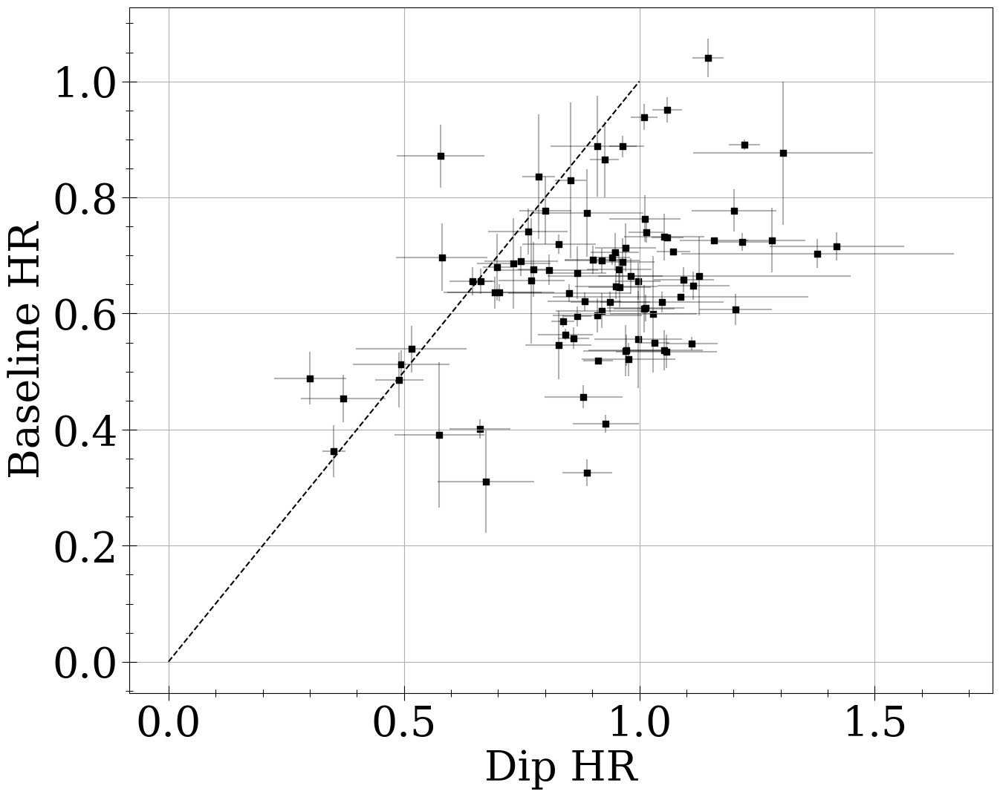

In [18]:
x= np.arange(0,2)
size = 40
plt.xlabel("Dip HR",fontsize=size)
plt.ylabel("Baseline HR",fontsize=size)

y= x
plt.plot(x,y,'--',color='black')
plt.rcParams.update({
            'font.sans-serif': 'Times New Roman',
            'font.family': 'serif'
            })

plt.scatter(hr_infos_table['dip'],hr_infos_table['baseline'],s=40,color='black',marker='s')
plt.tick_params(axis='both', which='major', labelsize=size)
plt.rcParams["figure.figsize"] = (15,12)   

plt.errorbar(hr_infos_table['dip'],hr_infos_table['baseline'],xerr=hr_infos_table['dip_error'],yerr=hr_infos_table['baseline_error'],fmt="None",color='black',alpha=.3)

plt.minorticks_on()

plt.tick_params(axis='both', which='both', labelsize=size,direction='inout',length=15)
plt.tick_params(which='minor', width=0.75, length=7)
plt.grid()
plt.savefig("HR_scatterplot")
# plt.errorbar(dip_hrs,baseline_hrs,yerr=baseline_hr_sd,xerr=dip_hr_sd,fmt="o")


In [19]:
Hr_baselines = pd.DataFrame(columns=['baseline','HR','error','MJD'])

In [20]:
Hr_baselines['baseline'] = all_baselines
Hr_baselines['HR'] = all_full_HRS
Hr_baselines['error'] = all_full_HR_errors

Hr_baselines['MJD'] = all_times


In [21]:
not_sus = Hr_baselines[(Hr_baselines['MJD'] < 55085) | (Hr_baselines['MJD'] > 55105)]

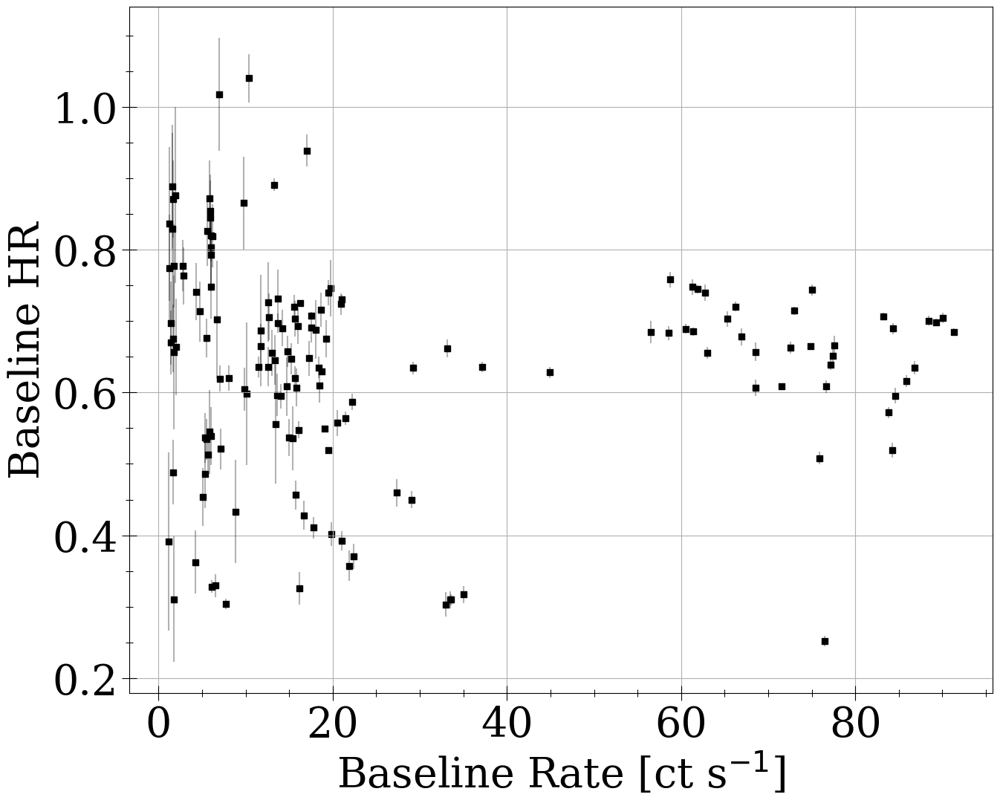

In [25]:
plt.scatter(not_sus["baseline"],not_sus["HR"],marker='s',color='black')
plt.errorbar(not_sus["baseline"],not_sus["HR"],yerr=not_sus["error"],fmt="None",color='black',alpha=.3)

plt.minorticks_on()

plt.tick_params(axis='both', which='both', labelsize=size,direction='inout',length=15)
plt.tick_params(which='minor', width=0.75, length=7)
plt.xlabel(r"Baseline Rate [ct s$^{-1}$]",size=40)
plt.ylabel("Baseline HR",size=40)

plt.grid()
plt.savefig('baseline_HR_scatter')


In [114]:
sus = not_sus[(not_sus['baseline'] >60) & (not_sus['HR'] < .3)]

In [115]:
sus

,baseline,HR,MJD
105,76.444771,0.252062,51069.345652


In [44]:
outlier = [i[0] for i in hr_info if (i[2] > 2)]

60038-01-02-01.lc


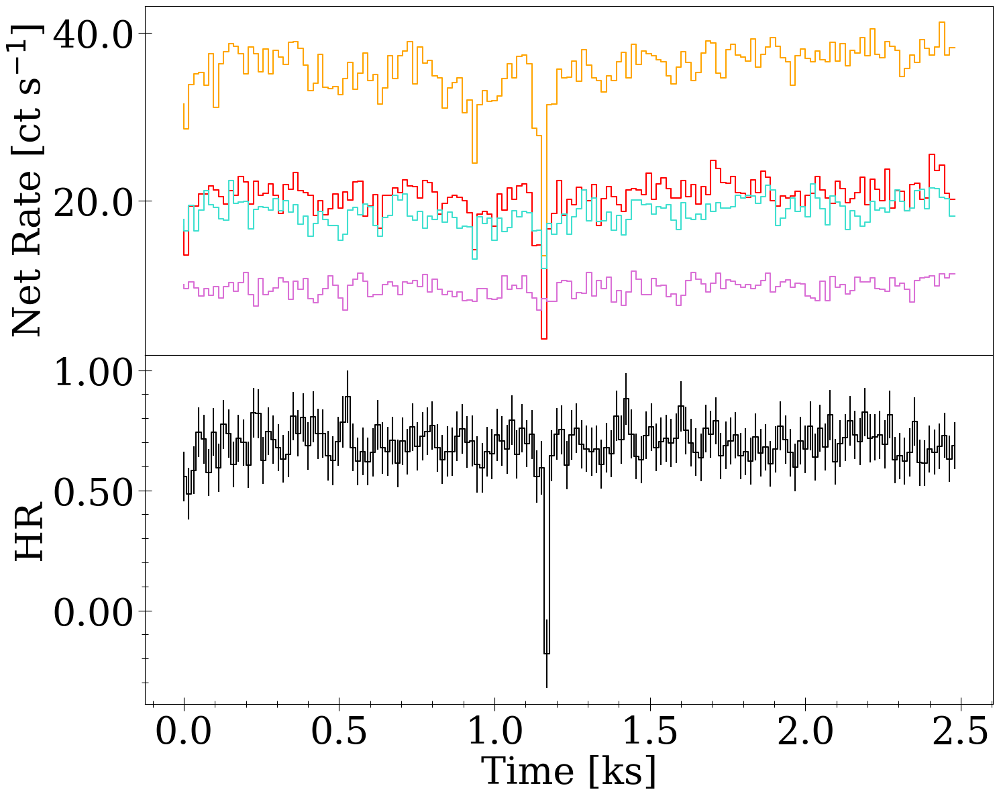

[]


([], [], [0.6893648], [84.28639], [0.008032843130772887], [52203.096729618046])

In [23]:
RXTE_analysis_HR(['60038-01-02-01.lc'],True,True)

In [38]:

def single_plot(name,max,xmin,xmax,time_subtract):
  new_file = fits.open(name)
  tab = table.Table(new_file[1].data) 
  time = tab["TIME"].tolist()
  rate = tab["RATE"].tolist()

  #cutting off tall bursts
  
  for i in range(0,len(time)):
    if rate[i] > max:
      rate[i] = max

    
  time = np.array(time)
  if time_subtract != False:
    time -= 495703503.678
  else:
    time -= min(time)

  plt.step(time,rate,color='black',linewidth=.8)
  plt.xlabel("Time [ks]",fontsize=30)
  plt.ylabel(r"Net Rate [ct s$^{-1}$]",fontsize=30)
  plt.rcParams.update({
            'font.sans-serif': 'Times New Roman',
            'font.family': 'sans-serif',
            })
  plt.tick_params(axis='both', which='major', labelsize=30)

  if xmin != False:
    plt.xlim(xmin,xmax)

#   plt.show()

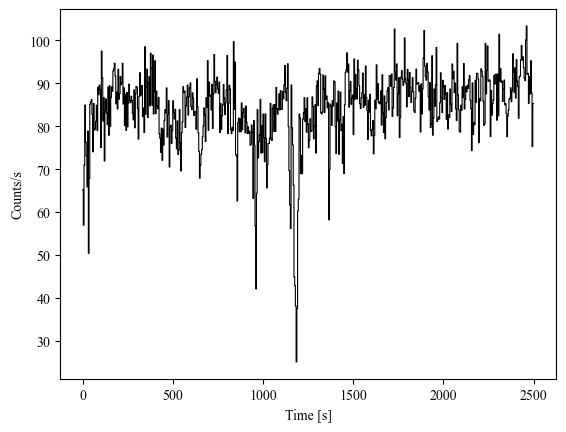

In [93]:
accretion_related_dips = ['/Users/caleb/Downloads/GRS_lc_files/60038-01-02-01.lc']
b
for i in accretion_related_dips:
    single_plot(i,120,0,0,0)

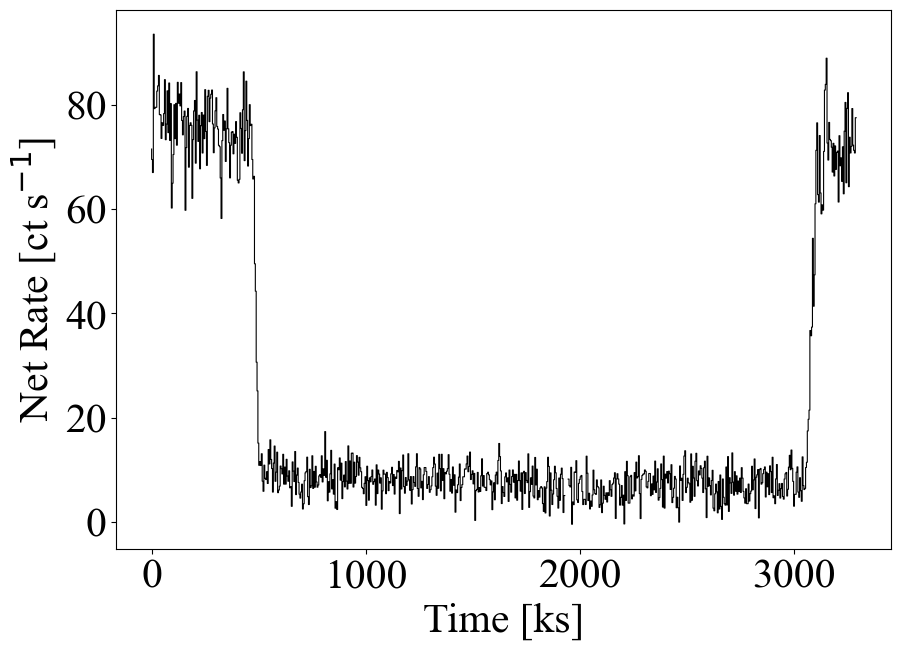

In [39]:
single_plot('/Users/caleb/Downloads/GRS_lc_files/60038-01-03-01.lc',120,0,0,0)

In [37]:
2596 / (24*60*60*.514980303)

0.058344554386376785

In [72]:
Axis.set_ticks().help()

NameError: name 'Axis' is not defined

In [80]:
help(matplotlib.pyplot.axis.set_ticks)

NameError: name 'matplotlib' is not defined

In [ ]:
zand_bursts = ['/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/60038-01-05-00.lc','/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/60038-01-07-04.lc',]

In [177]:
burst_obsids = ['91045-02-01-20.lc', '60038-01-07-04.lc', '94041-01-01-12.lc', '94041-01-01-06.lc', '60038-01-08-01.lc', '94041-01-02-12.lc', '94041-01-01-02.lc', '94041-01-03-04.lc', '96052-02-01-03.lc', '94041-01-01-07.lc', '94041-01-03-00.lc', '96052-02-02-02.lc', '60038-01-05-00.lc', '60038-01-08-00.lc']
burst_obsids = ['/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/'+i for i in burst_obsids]

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/91045-02-01-20.lc


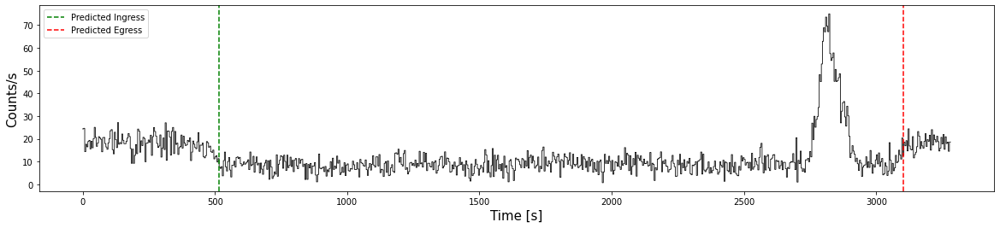

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/60038-01-07-04.lc


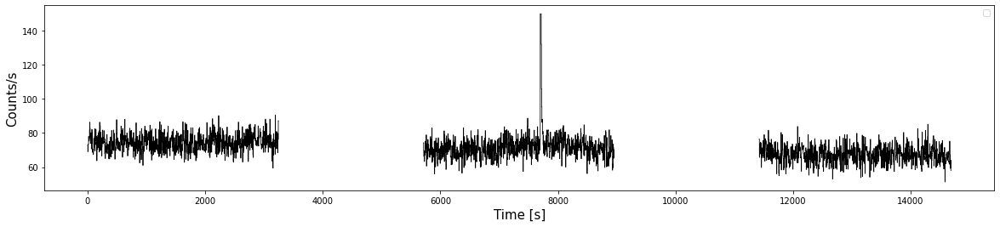

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-12.lc


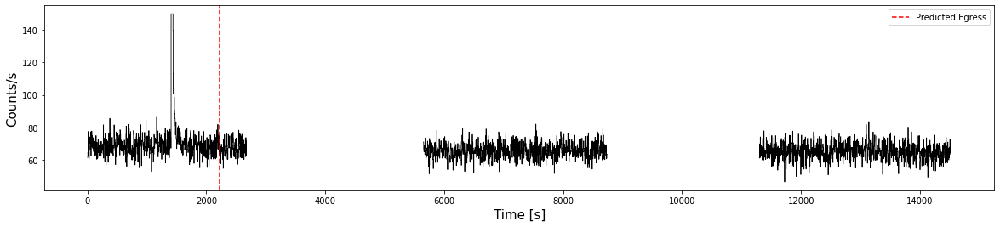

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-06.lc


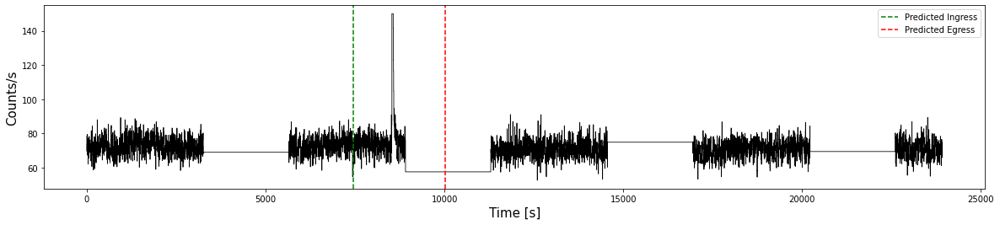

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/60038-01-08-01.lc


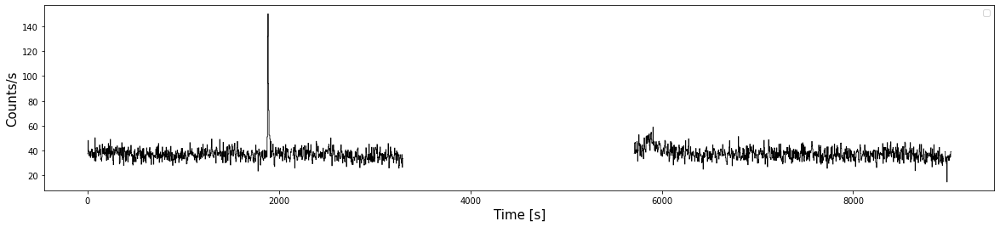

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-02-12.lc


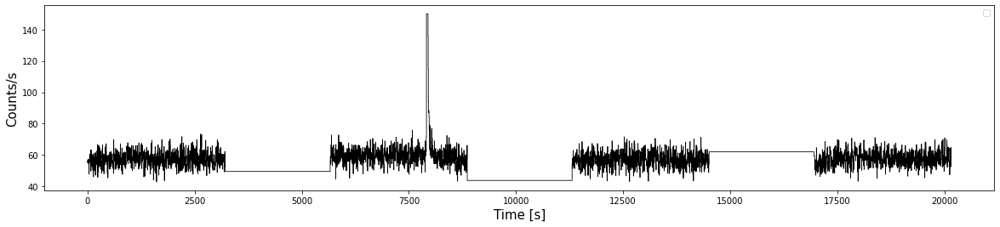

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-02.lc


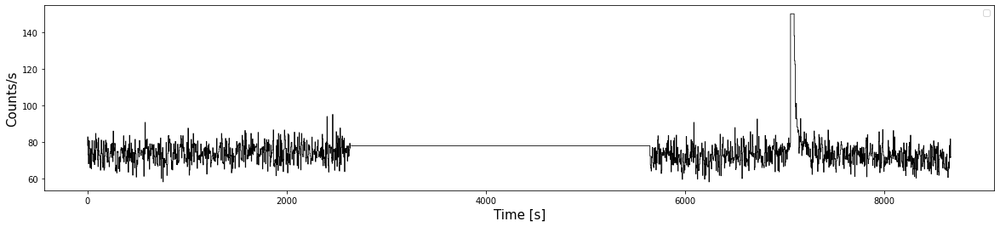

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-03-04.lc


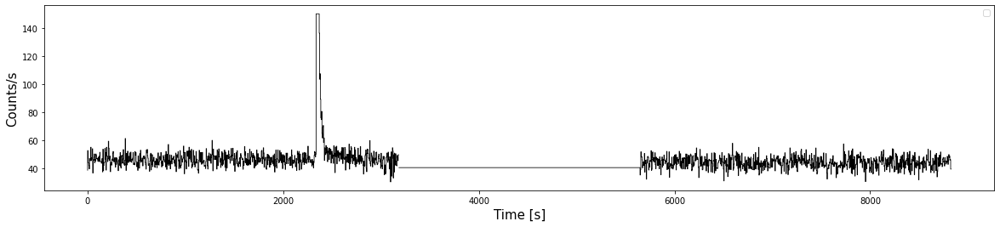

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/96052-02-01-03.lc


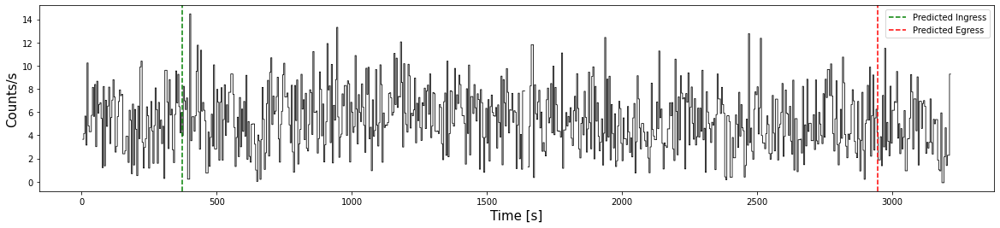

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-07.lc


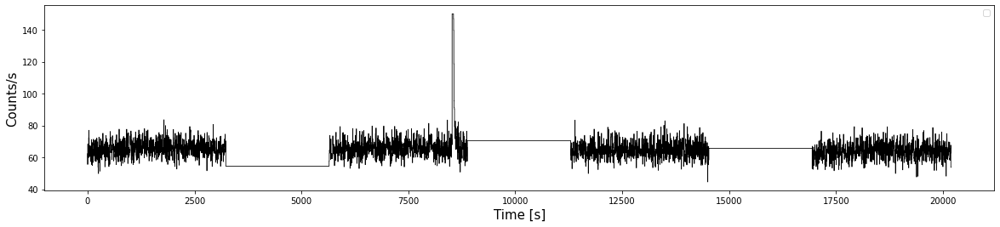

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-03-00.lc


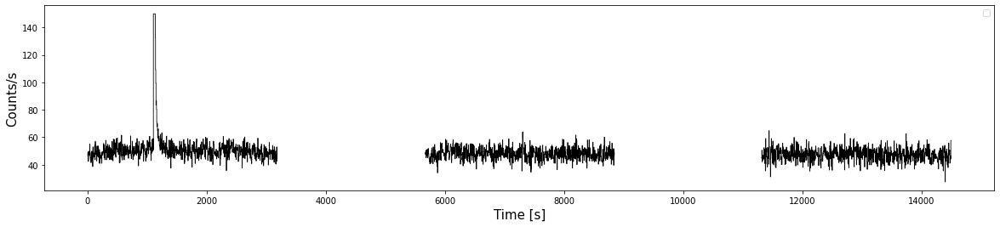

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/96052-02-02-02.lc


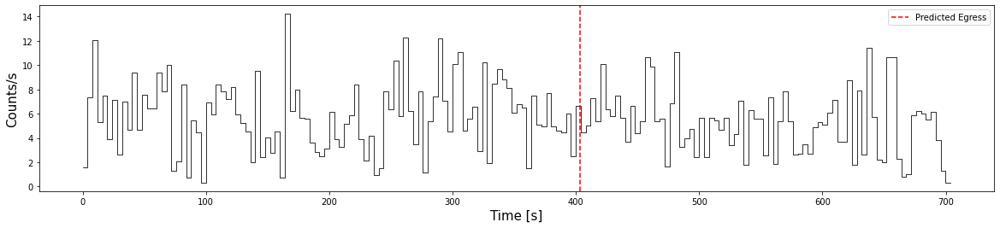

/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/60038-01-05-00.lc


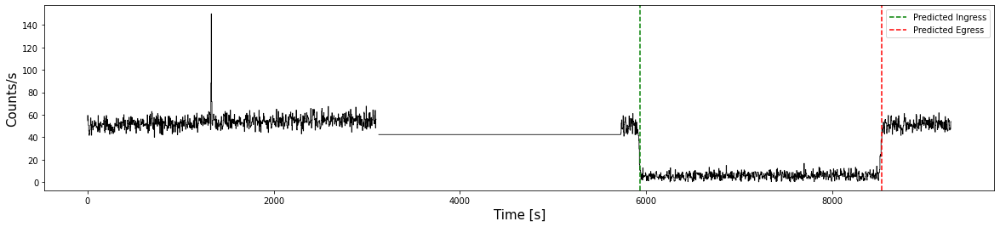

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/60038-01-08-00.lc


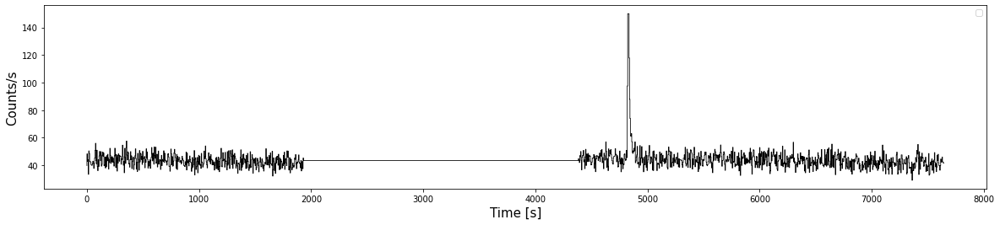

In [178]:
paper_plotter(burst_obsids)

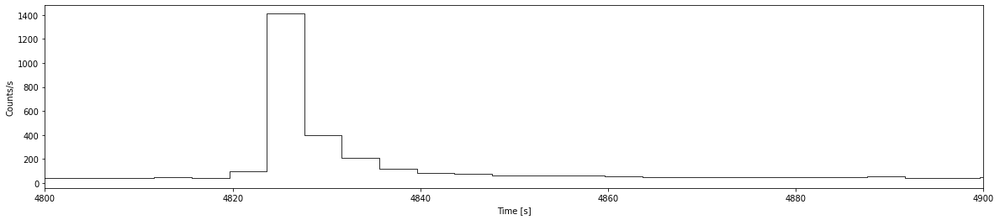

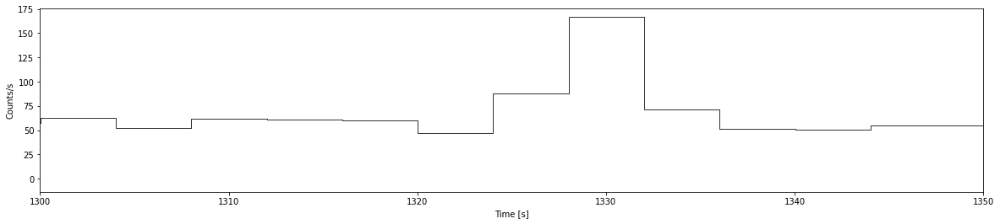

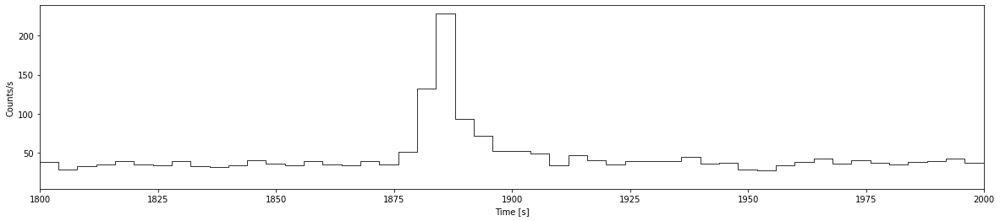

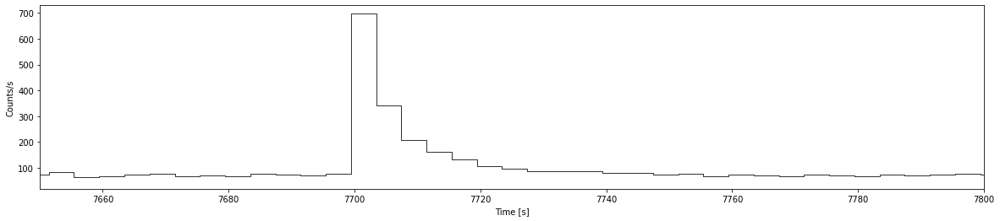

In [198]:
single_plot('/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/60038-01-08-00.lc',2000,4800,4900,False)
single_plot('/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/60038-01-05-00.lc',2000,1300,1350,False)
single_plot('/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/60038-01-08-01.lc',2000,1800,2000,False)
single_plot('/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/60038-01-07-04.lc',2000,7650,7800,False)

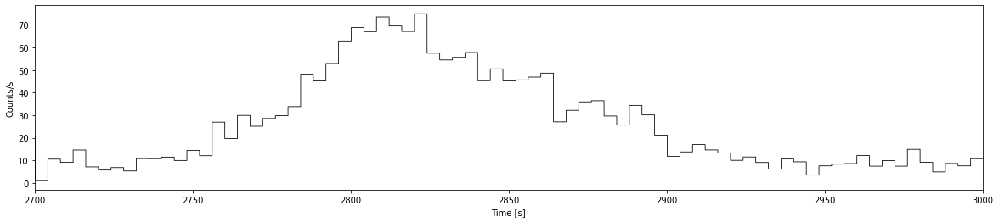

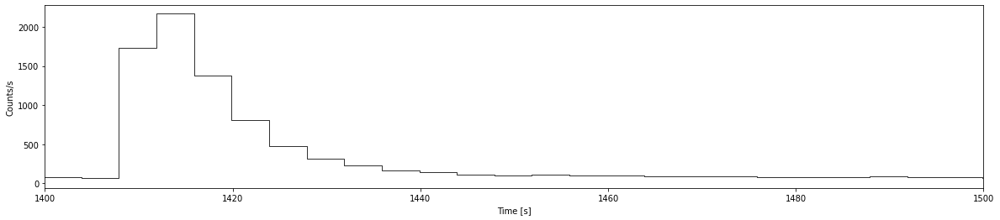

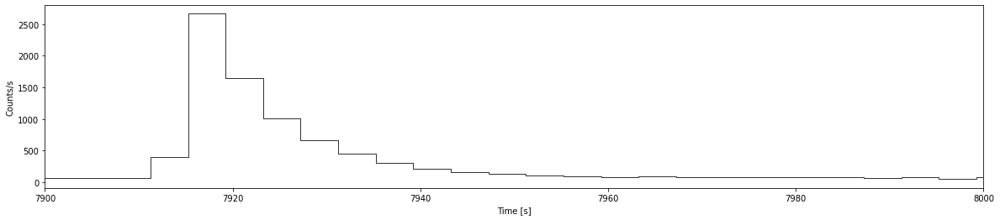

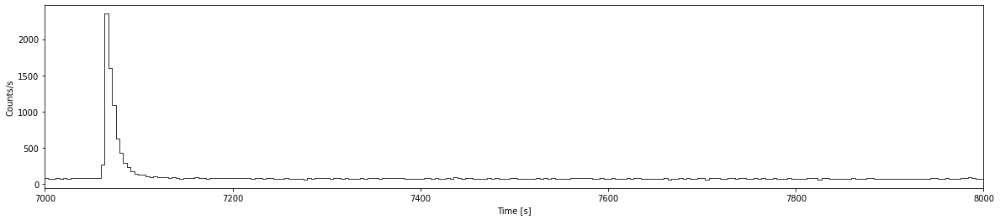

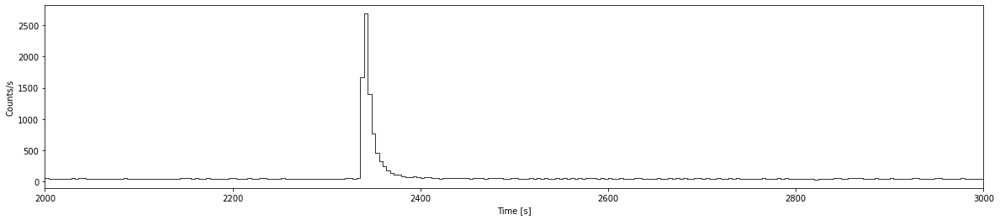

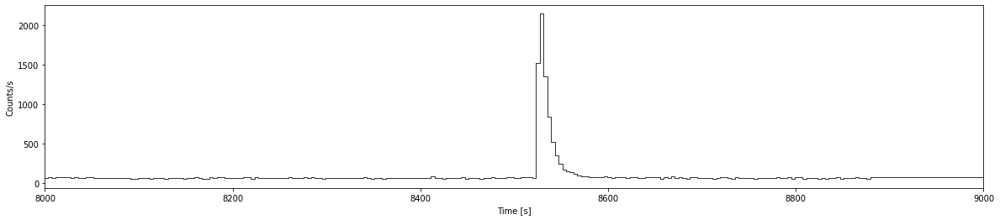

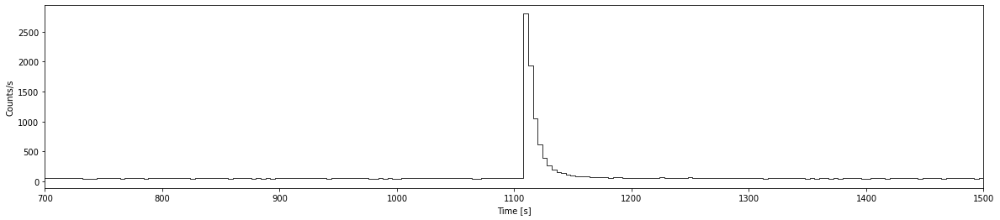

In [206]:
single_plot('/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/91045-02-01-20.lc',2000,2700,3000,False)
single_plot('/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-12.lc',3000,1400,1500,False)
single_plot('/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-02-12.lc',3000,7900,8000,False)
single_plot('/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-02.lc',3000,7000,8000,False)

single_plot('/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-03-04.lc',3000,2000,3000,False)
single_plot('/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-01-07.lc',3000,8000,9000,False)
single_plot('/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-03-00.lc',3000,700,1500,False)

single_plot('/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/94041-01-03-00.lc',3000,700,1500,False)


In [263]:
np.arange(0,60*.5,.5)

array([ 0. ,  0.5,  1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4. ,  4.5,  5. ,
        5.5,  6. ,  6.5,  7. ,  7.5,  8. ,  8.5,  9. ,  9.5, 10. , 10.5,
       11. , 11.5, 12. , 12.5, 13. , 13.5, 14. , 14.5, 15. , 15.5, 16. ,
       16.5, 17. , 17.5, 18. , 18.5, 19. , 19.5, 20. , 20.5, 21. , 21.5,
       22. , 22.5, 23. , 23.5, 24. , 24.5, 25. , 25.5, 26. , 26.5, 27. ,
       27.5, 28. , 28.5, 29. , 29.5])

In [265]:
len(np.arange(0,60*.5,.5))

60

In [89]:
flagged_dips

['/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/80045-02-04-05.lc',
 '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/60038-01-02-00.lc',
 '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/50034-01-01-06.lc',
 '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/60038-01-02-01.lc',
 '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/50034-01-07-01.lc',
 '/Users/caleb/AstroPythonPrograms/Codes/HR/GRS_lc_files/50034-01-01-01.lc']